# Прогнозирование покупательской активности клиента

**Заголовок:**

Прогнозирование покупательской активности клиента



**Цель исследования:**
1.    Нужно построить модель, которая предскажет вероятность снижения покупательской активности клиента в следующие три месяца.
2.    В исследование нужно включить дополнительные данные финансового департамента о прибыльности клиента: какой доход каждый покупатель приносил компании за последние три месяца.
3.    Используя данные модели и данные о прибыльности клиентов, нужно выделить сегменты покупателей и разработать для них персонализированные предложения.


**Ход исследования:**

*    Загрузка данных
*    Предобработка данных
*    Исследовательский анализ данных
*    Объединение таблиц
*    Корреляционный анализ данных
*    Использование пайплайнов
*    Анализ важности признаков
*    Сегментация покупателей
*    Общий вывод

**Описание данных:**

1.    **market_file.csv**

Таблица, которая содержит данные о поведении покупателя на сайте, о коммуникациях с покупателем и его продуктовом поведении.

*    `id` — номер покупателя в корпоративной базе данных.
*    `Покупательская активность` — рассчитанный класс покупательской активности (целевой признак): `снизилась` или `прежний уровень`.
*    `Тип сервиса` — уровень сервиса, например `премиум` и `стандарт`.
*    `Разрешить сообщать` — информация о том, можно ли присылать покупателю дополнительные предложения о товаре. Согласие на это даёт покупатель.
*    `Маркет_актив_6_мес` — среднемесячное значение маркетинговых коммуникаций компании, которое приходилось на покупателя за последние 6 месяцев. Это значение показывает, какое число рассылок, звонков, показов рекламы и прочего приходилось на клиента.
*    `Маркет_актив_тек_мес` — количество маркетинговых коммуникаций в текущем месяце.
*    `Длительность` — значение, которое показывает, сколько дней прошло с момента регистрации покупателя на сайте.
*    `Акционные_покупки` — среднемесячная доля покупок по акции от общего числа покупок за последние 6 месяцев.
*    `Популярная_категория` — самая популярная категория товаров у покупателя за последние 6 месяцев.
*    `Средний_просмотр_категорий_за_визит` — показывает, сколько в среднем категорий покупатель просмотрел за визит в течение последнего месяца.
*    `Неоплаченные_продукты_штук_квартал` — общее число неоплаченных товаров в корзине за последние 3 месяца.
*    `Ошибка_сервиса` — число сбоев, которые коснулись покупателя во время посещения сайта.
*    `Страниц_за_визит` — среднее количество страниц, которые просмотрел покупатель за один визит на сайт за последние 3 месяца.
    
2.    **market_money.csv**

Таблица с данными о выручке, которую получает магазин с покупателя, то есть сколько покупатель всего потратил за период взаимодействия с сайтом.

*    `id` — номер покупателя в корпоративной базе данных.
*    `Период` — название периода, во время которого зафиксирована выручка. Например, `'текущий_месяц'` или `'предыдущий_месяц'`.
*    `Выручка` — сумма выручки за период.

3.    **market_time.csv**

Таблица с данными о времени (в минутах), которое покупатель провёл на сайте в течение периода.

*    `id` — номер покупателя в корпоративной базе данных.
*    `Период` — название периода, во время которого зафиксировано общее время.
*    `минут` — значение времени, проведённого на сайте, в минутах.

4.    **money.csv**

Таблица с данными о среднемесячной прибыли продавца за последние 3 месяца: какую прибыль получает магазин от продаж каждому покупателю.

*    `id` — номер покупателя в корпоративной базе данных.
*    `Прибыль` — значение прибыли.

## Загрузка данных

In [1]:
#импортируем необходимые библиотеки
!pip install --upgrade -q scikit-learn
!pip install --upgrade -q shap
!pip install --upgrade -q phik

import os

import pandas as pd
import numpy as np

import textwrap

import phik

from sklearn.model_selection import (train_test_split,
                                     RandomizedSearchCV)

from sklearn.pipeline import Pipeline

from sklearn.preprocessing import (MinMaxScaler,
                                   MaxAbsScaler,
                                   RobustScaler,
                                   StandardScaler, 
                                   OneHotEncoder,
                                   OrdinalEncoder,
                                   LabelEncoder)

from sklearn.compose import ColumnTransformer

from sklearn.impute import SimpleImputer

from sklearn.linear_model import LogisticRegression

from sklearn.neighbors import KNeighborsClassifier

from sklearn.svm import SVC

from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import roc_auc_score

from sklearn.inspection import permutation_importance

import shap

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#настроим отображение графиков
plt.rcParams['figure.figsize'] = (12, 8)

In [3]:
#считываем файлы
pth1_1 = '/datasets/market_file.csv'
pth1_2 = 'market_file.csv'

pth2_1 = '/datasets/market_money.csv'
pth2_2 = 'market_money.csv'

pth3_1 = '/datasets/market_time.csv'
pth3_2 = 'market_time.csv'

pth4_1 = '/datasets/money.csv'
pth4_2 = 'money.csv'


if os.path.exists(pth1_1):
    market_file = pd.read_csv(pth1_1)
elif os.path.exists(pth1_2):
    market_file = pd.read_csv(pth1_2)
else:
    print('Something is wrong with file market_file.csv')
    
if os.path.exists(pth2_1):
    market_money = pd.read_csv(pth2_1)
elif os.path.exists(pth2_2):
    market_money = pd.read_csv(pth2_2)
else:
    print('Something is wrong with file market_money.csv')

if os.path.exists(pth3_1):
    market_time = pd.read_csv(pth3_1)
elif os.path.exists(pth3_2):
    market_time = pd.read_csv(pth3_2)
else:
    print('Something is wrong with file market_time.csv')
    
if os.path.exists(pth4_1):
    money = pd.read_csv(pth4_1, sep=';', decimal=',')
elif os.path.exists(pth4_2):
    money = pd.read_csv(pth4_2, sep=';', decimal=',')
else:
    print('Something is wrong with file money.csv')

In [4]:
#посмотрим на данные в файле market_file
market_file.head(10)

,id,Покупательская активность,Тип сервиса,Разрешить сообщать,Маркет_актив_6_мес,Маркет_актив_тек_мес,Длительность,Акционные_покупки,Популярная_категория,Средний_просмотр_категорий_за_визит,Неоплаченные_продукты_штук_квартал,Ошибка_сервиса,Страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2
5,215353,Снизилась,стандартт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4
6,215354,Снизилась,стандартт,да,5.1,3,431,0.23,Косметика и аксесуары,2,3,7,2
7,215355,Снизилась,стандартт,нет,4.7,4,284,0.17,Товары для детей,5,1,6,4
8,215356,Снизилась,стандартт,да,4.2,4,192,0.14,Косметика и аксесуары,2,2,1,3
9,215357,Снизилась,стандартт,да,3.9,5,154,0.00,Техника для красоты и здоровья,3,3,9,5


In [5]:
#приведём названия столбцов к каноническому виду
market_file.columns = market_file.columns.str.lower().str.replace(' ', '_')

In [6]:
#посмотрим на данные в файле market_money
market_money.head(10)

,id,Период,Выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6
5,215349,предыдущий_месяц,5216.0
6,215350,препредыдущий_месяц,4826.0
7,215350,текущий_месяц,5058.4
8,215350,предыдущий_месяц,5457.5
9,215351,текущий_месяц,6610.4


In [7]:
#приведём названия столбцов к каноническому виду
market_money.columns = market_money.columns.str.lower()

In [8]:
#посмотрим на данные в файле market_time
market_time.head(10)

,id,Период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13
5,215350,предыдцщий_месяц,8
6,215351,текущий_месяц,13
7,215351,предыдцщий_месяц,11
8,215352,текущий_месяц,11
9,215352,предыдцщий_месяц,8


In [9]:
#приведём названия столбцов к каноническому виду
market_time.columns = market_time.columns.str.lower()

In [10]:
#посмотрим на данные в файле money
money.head(10)

,id,Прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21
5,215353,3.95
6,215354,3.62
7,215355,5.26
8,215356,4.93
9,215357,4.66


In [11]:
#приведём названия столбцов к каноническому виду
money.columns = money.columns.str.lower()

Необходимые библиотеки импортированы, данные загружены. Названия колонок приведены к каноническому виду, как и разделители в датафрейме `money`

## Предобработка данных

In [12]:
#функция, возвращающая базовую информацию о датафрейме
def df_basic_info(df):
    #df - датафрейм
    
    print(f'Названия столбцов\n\n{df.columns}')
    print('----------------------------------------------------------------')
    print(f'Основные параметры данных\n\n{df.columns}')
    df.info()
    print('----------------------------------------------------------------')
    print(f'Типы данных\n\n{df.dtypes.value_counts()}')
    print('----------------------------------------------------------------')
    print(f'Размер датафрейма\n\n{df.shape}')
    print('----------------------------------------------------------------')
    print(f'Базовые статистики\n\n{df.describe()}')
    print('----------------------------------------------------------------')
    print(f'Доля пропущенных значений\n\n{df.isna().mean().sort_values()}')
    print('----------------------------------------------------------------')
    print(f'Количество дубликатов\n\n{df.duplicated().sum()}')
    print('----------------------------------------------------------------')
    return df.head(10)

### market_file

In [13]:
df_basic_info(market_file)

Названия столбцов

Index(['id', 'покупательская_активность', 'тип_сервиса', 'разрешить_сообщать',
       'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность',
       'акционные_покупки', 'популярная_категория',
       'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит'],
      dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['id', 'покупательская_активность', 'тип_сервиса', 'разрешить_сообщать',
       'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность',
       'акционные_покупки', 'популярная_категория',
       'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype 

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2
5,215353,Снизилась,стандартт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4
6,215354,Снизилась,стандартт,да,5.1,3,431,0.23,Косметика и аксесуары,2,3,7,2
7,215355,Снизилась,стандартт,нет,4.7,4,284,0.17,Товары для детей,5,1,6,4
8,215356,Снизилась,стандартт,да,4.2,4,192,0.14,Косметика и аксесуары,2,2,1,3
9,215357,Снизилась,стандартт,да,3.9,5,154,0.00,Техника для красоты и здоровья,3,3,9,5


In [14]:
#изменим типы данных на корректные или более подходящие
new_int_cols = (['id', 'маркет_актив_тек_мес', 'длительность', 'средний_просмотр_категорий_за_визит',
                'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса', 'страниц_за_визит'])
for col in new_int_cols:
    market_file[col] = market_file[col].astype('int32')

new_float_cols = ['маркет_актив_6_мес', 'акционные_покупки']
for col in new_float_cols:
    market_file[col] = market_file[col].astype('float32')
    
df_basic_info(market_file)

Названия столбцов

Index(['id', 'покупательская_активность', 'тип_сервиса', 'разрешить_сообщать',
       'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность',
       'акционные_покупки', 'популярная_категория',
       'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит'],
      dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['id', 'покупательская_активность', 'тип_сервиса', 'разрешить_сообщать',
       'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность',
       'акционные_покупки', 'популярная_категория',
       'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype 

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
0,215348,Снизилась,премиум,да,3.4,5,121,0.00,Товары для детей,6,2,1,5
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5
2,215350,Снизилась,стандартт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5
3,215351,Снизилась,стандартт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4
4,215352,Снизилась,стандартт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2
5,215353,Снизилась,стандартт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4
6,215354,Снизилась,стандартт,да,5.1,3,431,0.23,Косметика и аксесуары,2,3,7,2
7,215355,Снизилась,стандартт,нет,4.7,4,284,0.17,Товары для детей,5,1,6,4
8,215356,Снизилась,стандартт,да,4.2,4,192,0.14,Косметика и аксесуары,2,2,1,3
9,215357,Снизилась,стандартт,да,3.9,5,154,0.00,Техника для красоты и здоровья,3,3,9,5


### market_money

In [15]:
df_basic_info(market_money)

Названия столбцов

Index(['id', 'период', 'выручка'], dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['id', 'период', 'выручка'], dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       3900 non-null   int64  
 1   период   3900 non-null   object 
 2   выручка  3900 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 91.5+ KB
----------------------------------------------------------------
Типы данных

object     1
int64      1
float64    1
dtype: int64
----------------------------------------------------------------
Размер датафрейма

(3900, 3)
----------------------------------------------------------------
Базовые статистики

                  id        выручка
count    3900.000000    3900.000000
mean   215997.500000    5025.696051
std       3

,id,период,выручка
0,215348,препредыдущий_месяц,0.0
1,215348,текущий_месяц,3293.1
2,215348,предыдущий_месяц,0.0
3,215349,препредыдущий_месяц,4472.0
4,215349,текущий_месяц,4971.6
5,215349,предыдущий_месяц,5216.0
6,215350,препредыдущий_месяц,4826.0
7,215350,текущий_месяц,5058.4
8,215350,предыдущий_месяц,5457.5
9,215351,текущий_месяц,6610.4


In [16]:
#изменим типы данных на корректные или более подходящие
market_money['id'] = market_money['id'].astype('int32')
market_money['выручка'] = market_money['выручка'].astype('float32')
    
df_basic_info(market_money)

Названия столбцов

Index(['id', 'период', 'выручка'], dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['id', 'период', 'выручка'], dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3900 entries, 0 to 3899
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       3900 non-null   int32  
 1   период   3900 non-null   object 
 2   выручка  3900 non-null   float32
dtypes: float32(1), int32(1), object(1)
memory usage: 61.1+ KB
----------------------------------------------------------------
Типы данных

object     1
int32      1
float32    1
dtype: int64
----------------------------------------------------------------
Размер датафрейма

(3900, 3)
----------------------------------------------------------------
Базовые статистики

                  id        выручка
count    3900.000000    3900.000000
mean   215997.500000    5025.696289
std       3

,id,период,выручка
0,215348,препредыдущий_месяц,0.000000
1,215348,текущий_месяц,3293.100098
2,215348,предыдущий_месяц,0.000000
3,215349,препредыдущий_месяц,4472.000000
4,215349,текущий_месяц,4971.600098
5,215349,предыдущий_месяц,5216.000000
6,215350,препредыдущий_месяц,4826.000000
7,215350,текущий_месяц,5058.399902
8,215350,предыдущий_месяц,5457.500000
9,215351,текущий_месяц,6610.399902


### market_time

In [17]:
df_basic_info(market_time)

Названия столбцов

Index(['id', 'период', 'минут'], dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['id', 'период', 'минут'], dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2600 non-null   int64 
 1   период  2600 non-null   object
 2   минут   2600 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 61.1+ KB
----------------------------------------------------------------
Типы данных

int64     2
object    1
dtype: int64
----------------------------------------------------------------
Размер датафрейма

(2600, 3)
----------------------------------------------------------------
Базовые статистики

                  id        минут
count    2600.000000  2600.000000
mean   215997.500000    13.336154
std       375.349754     4.080198
min    215348.000000    

,id,период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13
5,215350,предыдцщий_месяц,8
6,215351,текущий_месяц,13
7,215351,предыдцщий_месяц,11
8,215352,текущий_месяц,11
9,215352,предыдцщий_месяц,8


In [18]:
#изменим типы данных на корректные или более подходящие
new_int_cols = ['id', 'минут']
for col in new_int_cols:
    market_time[col] = market_time[col].astype('int32')
    
df_basic_info(market_time)

Названия столбцов

Index(['id', 'период', 'минут'], dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['id', 'период', 'минут'], dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2600 entries, 0 to 2599
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      2600 non-null   int32 
 1   период  2600 non-null   object
 2   минут   2600 non-null   int32 
dtypes: int32(2), object(1)
memory usage: 40.8+ KB
----------------------------------------------------------------
Типы данных

int32     2
object    1
dtype: int64
----------------------------------------------------------------
Размер датафрейма

(2600, 3)
----------------------------------------------------------------
Базовые статистики

                  id        минут
count    2600.000000  2600.000000
mean   215997.500000    13.336154
std       375.349754     4.080198
min    215348.000000    

,id,период,минут
0,215348,текущий_месяц,14
1,215348,предыдцщий_месяц,13
2,215349,текущий_месяц,10
3,215349,предыдцщий_месяц,12
4,215350,текущий_месяц,13
5,215350,предыдцщий_месяц,8
6,215351,текущий_месяц,13
7,215351,предыдцщий_месяц,11
8,215352,текущий_месяц,11
9,215352,предыдцщий_месяц,8


### money

In [19]:
df_basic_info(money)

Названия столбцов

Index(['id', 'прибыль'], dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['id', 'прибыль'], dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1300 non-null   int64  
 1   прибыль  1300 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 20.4 KB
----------------------------------------------------------------
Типы данных

float64    1
int64      1
dtype: int64
----------------------------------------------------------------
Размер датафрейма

(1300, 2)
----------------------------------------------------------------
Базовые статистики

                  id      прибыль
count    1300.000000  1300.000000
mean   215997.500000     3.996631
std       375.421985     1.013722
min    215348.000000     0.860000
25%    215672.750000     3.30000

,id,прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21
5,215353,3.95
6,215354,3.62
7,215355,5.26
8,215356,4.93
9,215357,4.66


In [20]:
#изменим типы данных на корректные или более подходящие
money['id'] = money['id'].astype('int32')
money['прибыль'] = money['прибыль'].astype('float32')

df_basic_info(money)

Названия столбцов

Index(['id', 'прибыль'], dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['id', 'прибыль'], dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1300 non-null   int32  
 1   прибыль  1300 non-null   float32
dtypes: float32(1), int32(1)
memory usage: 10.3 KB
----------------------------------------------------------------
Типы данных

int32      1
float32    1
dtype: int64
----------------------------------------------------------------
Размер датафрейма

(1300, 2)
----------------------------------------------------------------
Базовые статистики

                  id      прибыль
count    1300.000000  1300.000000
mean   215997.500000     3.996630
std       375.421985     1.013722
min    215348.000000     0.860000
25%    215672.750000     3.30000

,id,прибыль
0,215348,0.98
1,215349,4.16
2,215350,3.13
3,215351,4.87
4,215352,4.21
5,215353,3.95
6,215354,3.62
7,215355,5.26
8,215356,4.93
9,215357,4.66


Таким образом, в четырёх имеющихся датафреймах изменены типы данных на корректные/более подходящие. Кроме того, было установлено, что в данных отсутствуют пропущенные значения и явные дубликаты. Визуально можно отметить опечатки в некоторых столбцах со строковыми значениями.

В дальнейшем будет осуществлена ещё одна проверка на неявные дубликаты после объединения датафреймов.

## Исследовательский анализ данных

In [21]:
#функция для корректной отрисовки названий столбцов
def wrap_labels(ax, width, break_long_words=False):
    #ax - график
    #width - ширина строки
    
    #создание списка названий столбцов c заданной шириной строки
    labels = []
    for label in ax.get_xticklabels():
        text = label.get_text()
        labels.append(textwrap.fill(text, width=width, 
                                    break_long_words=break_long_words))
    ax.set_xticks(ax.get_xticks(), labels=labels)

In [22]:
#функция для анализа категориальных признаков
def cat_feat_analysis(df, feat):
    #df - датафрейм
    #feat - категориальный признак
    
    #отрисовка столбчатой диаграммы
    fig, ax = plt.subplots()
    print(f'Уникальные значения\n\n{df[feat].value_counts(normalize=True)}')
    print('-----------------------------------------------------')
    print(f'Базовые статистики\n\n{df[feat].describe()}')
    print('-----------------------------------------------------')
    sns.countplot(data=df,
                  x=feat,
                  hue=feat,
                  legend=False,
                  palette='pastel',
                  ax=ax).set(title=f'Распределение признака\n{feat}', 
                             ylabel='Количество пользователей')
    
    #корректировка длины названия столбца
    wrap_labels(ax, 10)
    ax.figure

In [23]:
#функция для анализа количественных признаков
def quant_feat_analysis(df, feat):
    #df - датафрейм
    #feat - количественный признак
    
    print(f'Базовые статистики\n\n{df[feat].describe()}')
    print('-----------------------------------------------------')
    fig, (ax_box, ax_hist) = plt.subplots(2,
                                          sharex=True,
                                          gridspec_kw = {'height_ratios': (.1, .9)})
    #отрисовка боксплота
    sns.boxplot(data=df, 
                x=feat,
                color='cadetblue',
                ax=ax_box)
    
    #отрисовка гистограммы
    sns.histplot(data=df,
                 x=feat,
                 bins=round(1 + np.log2(df.shape[0])),
                 kde=True,
                 color='cadetblue',
                 ax=ax_hist)
    
    ax_box.set(xlabel = '') 
    ax_box.set(title=f'Распределение признака\n{feat}') 
    ax_hist.set(xlabel=feat)
    ax_hist.set(ylabel='Количество пользователей')
    
    plt.show()

### market_file

#### id

Исследовательский анализ не требуется

#### покупательская_активность

Уникальные значения

Прежний уровень    0.616923
Снизилась          0.383077
Name: покупательская_активность, dtype: float64
-----------------------------------------------------
Базовые статистики

count                1300
unique                  2
top       Прежний уровень
freq                  802
Name: покупательская_активность, dtype: object
-----------------------------------------------------


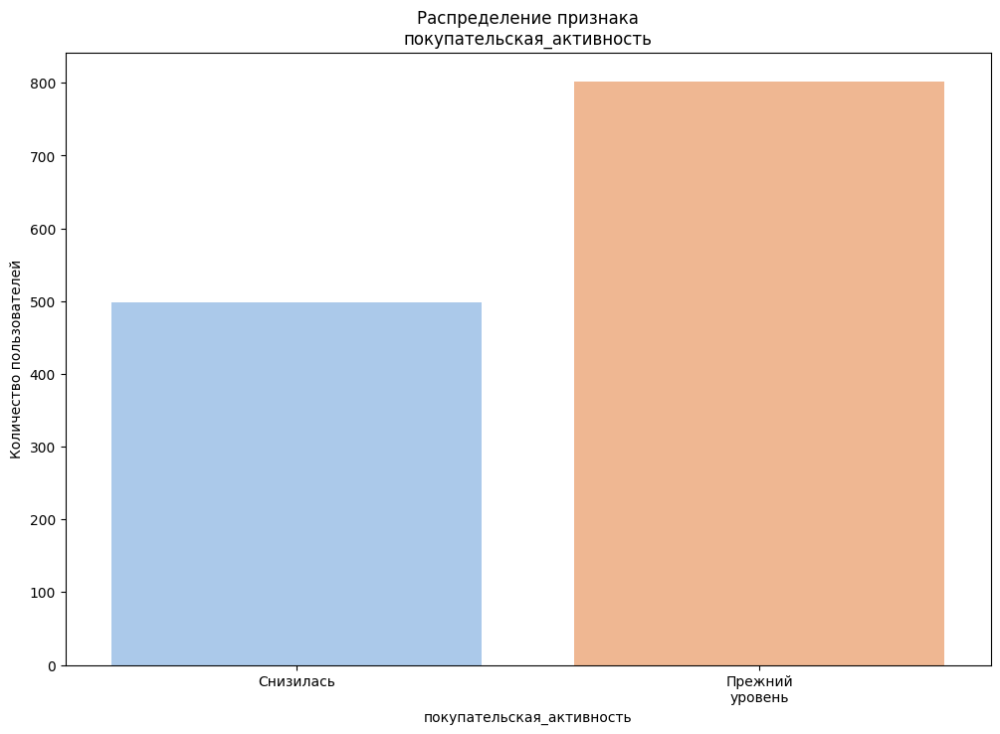

In [24]:
cat_feat_analysis(market_file, 'покупательская_активность')

Классы целевого признака несбалансированы. Учтём это при обучении моделей

#### тип_сервиса

Уникальные значения

стандарт     0.703077
премиум      0.289231
стандартт    0.007692
Name: тип_сервиса, dtype: float64
-----------------------------------------------------
Базовые статистики

count         1300
unique           3
top       стандарт
freq           914
Name: тип_сервиса, dtype: object
-----------------------------------------------------


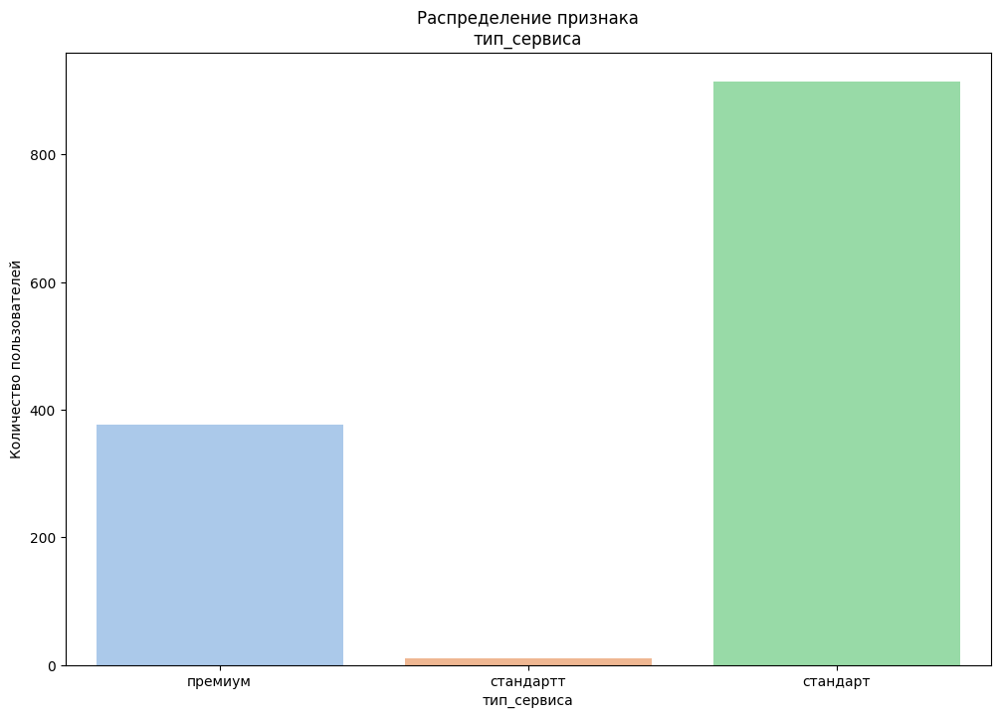

In [25]:
cat_feat_analysis(market_file, 'тип_сервиса')

Явно заметна опечатка в названии класса, исправим её

Уникальные значения

стандарт    0.710769
премиум     0.289231
Name: тип_сервиса, dtype: float64
-----------------------------------------------------
Базовые статистики

count         1300
unique           2
top       стандарт
freq           924
Name: тип_сервиса, dtype: object
-----------------------------------------------------


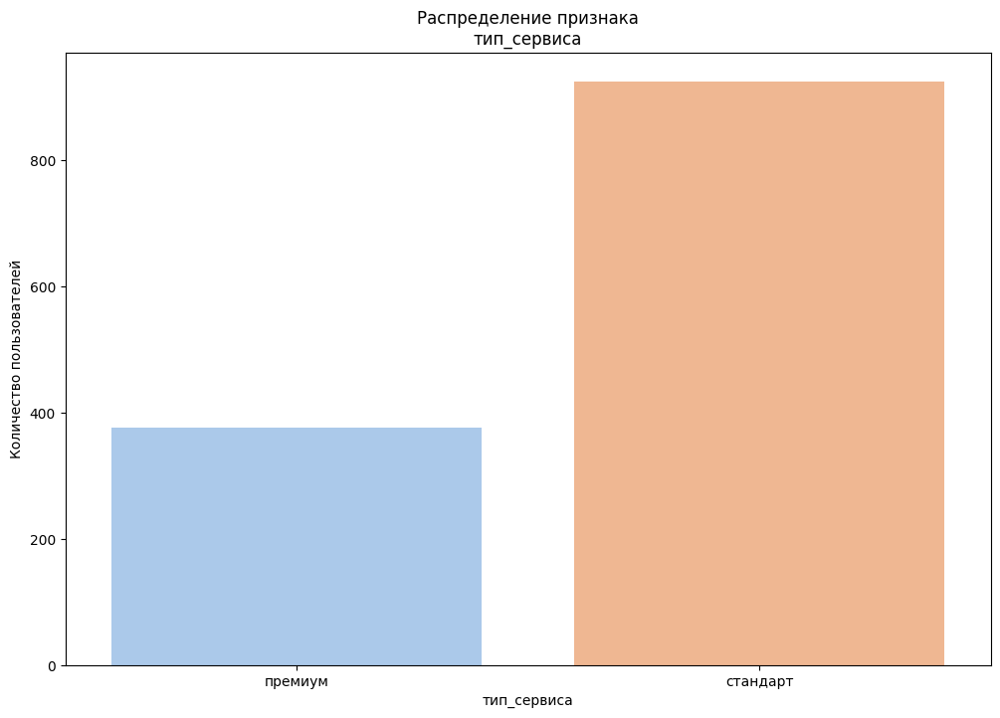

In [26]:
market_file['тип_сервиса'].replace('стандартт', 'стандарт', 
                             regex=True,
                             inplace=True)
cat_feat_analysis(market_file, 'тип_сервиса')

Явно наблюдается несбалансированность классов - пользователей со стандартным уровнем сервиса почти в 3 раза больше, чем с премиум-уровнем

#### разрешить_сообщать

Уникальные значения

да     0.74
нет    0.26
Name: разрешить_сообщать, dtype: float64
-----------------------------------------------------
Базовые статистики

count     1300
unique       2
top         да
freq       962
Name: разрешить_сообщать, dtype: object
-----------------------------------------------------


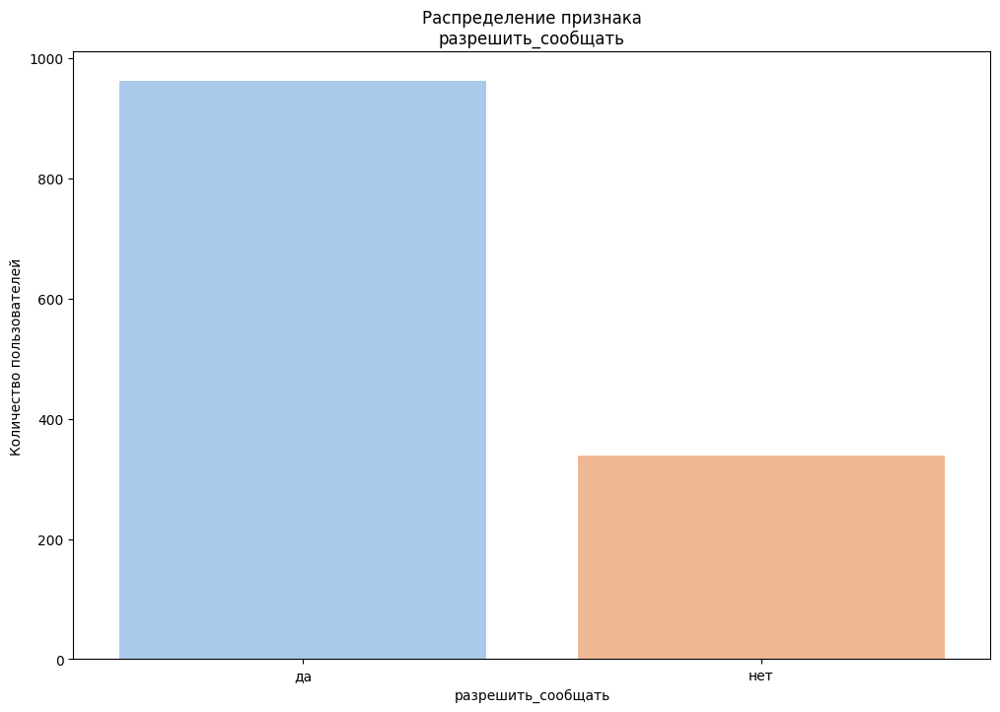

In [27]:
cat_feat_analysis(market_file, 'разрешить_сообщать')

Явно наблюдается несбалансированность классов - пользователей, разрешивших рассылку, почти в 3 раза больше

####  маркет_актив__6_мес

Базовые статистики

count    1300.000000
mean        4.253769
std         1.014814
min         0.900000
25%         3.700000
50%         4.200000
75%         4.900000
max         6.600000
Name: маркет_актив_6_мес, dtype: float64
-----------------------------------------------------


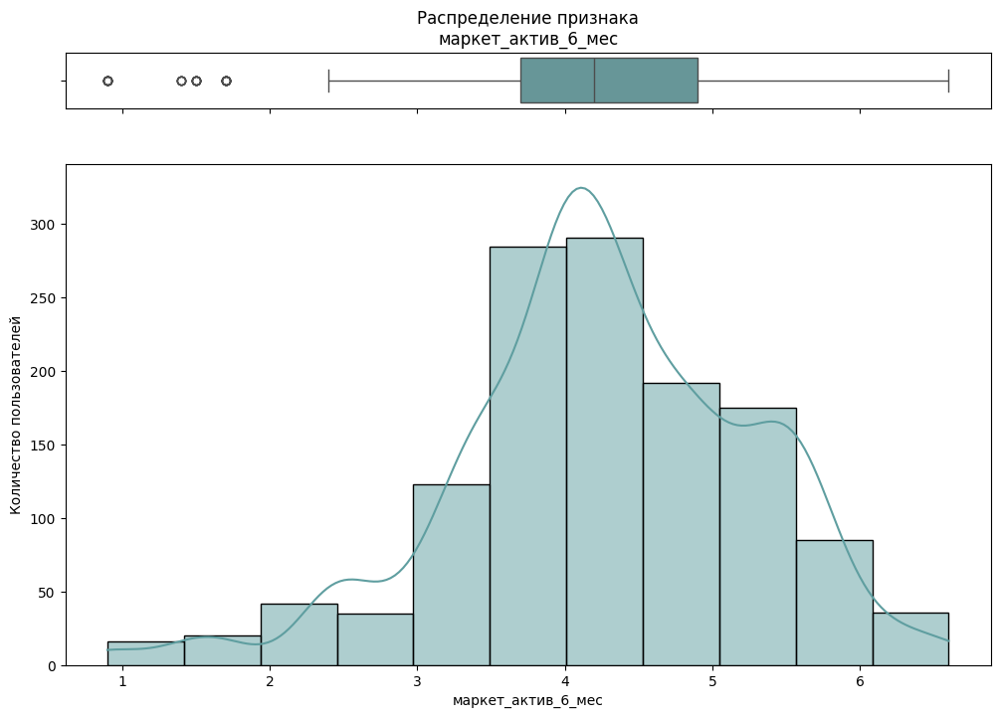

In [28]:
quant_feat_analysis(market_file, 'маркет_актив_6_мес')

Судя по графику гистограммы, распределение признака мономодальное, скошено вправо (медиана меньше среднего арифметического). 
Посмотрим на выбросы, выделенные боксплотом

In [29]:
market_file.query('маркет_актив_6_мес < 2').head(20)

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит
30,215378,Снизилась,стандарт,да,1.7,3,488,0.39,Техника для красоты и здоровья,5,1,4,3
32,215380,Снизилась,премиум,нет,1.7,4,637,0.94,Техника для красоты и здоровья,3,2,4,7
38,215386,Снизилась,стандарт,да,1.5,3,495,0.98,Домашний текстиль,2,3,7,5
47,215395,Снизилась,премиум,да,1.5,5,645,0.27,Товары для детей,3,3,6,5
55,215403,Снизилась,премиум,да,1.7,5,771,0.39,Техника для красоты и здоровья,1,8,2,5
61,215409,Снизилась,премиум,да,1.4,4,857,0.95,Кухонная посуда,3,4,5,5
63,215411,Снизилась,стандарт,да,1.7,4,756,0.33,Товары для детей,2,3,7,4
70,215418,Снизилась,стандарт,нет,1.7,4,472,0.94,Домашний текстиль,2,6,4,3
81,215429,Снизилась,премиум,нет,0.9,4,690,0.24,Домашний текстиль,2,5,7,4
108,215456,Снизилась,стандарт,да,1.7,4,449,0.23,Косметика и аксесуары,3,4,4,5


На первый взгляд, аномальных записей не наблюдается. Несколько удивительным кажется только возросшее в разы количество активностей в последний месяц - возможно, компания решила увеличить количество активностей для части клиентов в этот период. Не будем удалять записи с выбросами, явных аномальных значений не наблюдается

#### маркет_актив_тек_мес

Уникальные значения

4    0.514615
5    0.248462
3    0.236923
Name: маркет_актив_тек_мес, dtype: float64
-----------------------------------------------------
Базовые статистики

count    1300.000000
mean        4.011538
std         0.696868
min         3.000000
25%         4.000000
50%         4.000000
75%         4.000000
max         5.000000
Name: маркет_актив_тек_мес, dtype: float64
-----------------------------------------------------


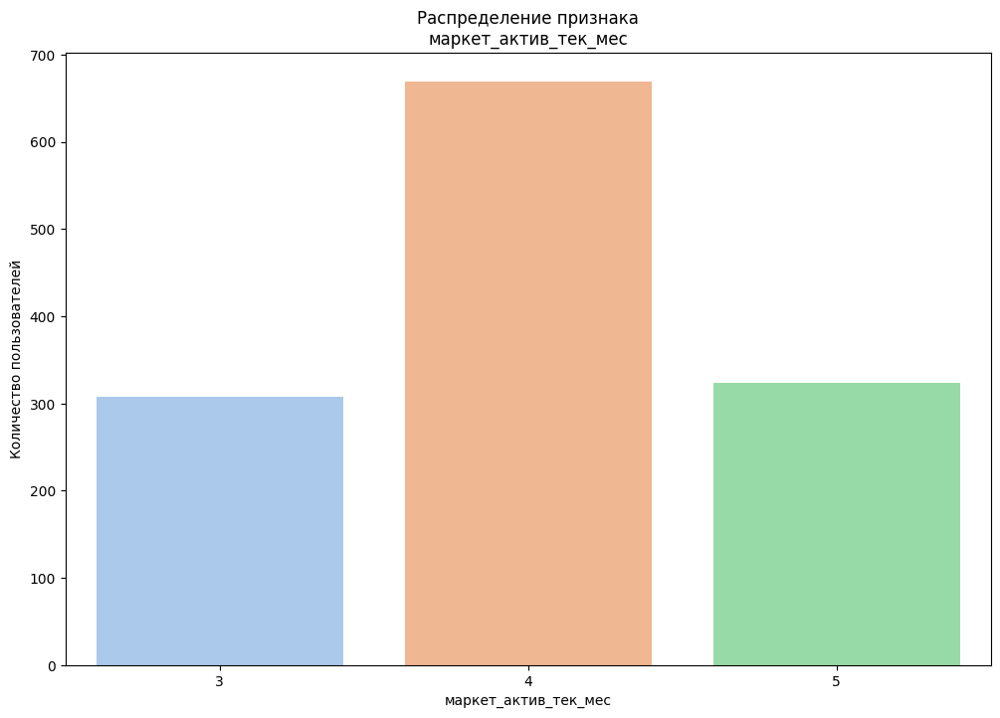

In [30]:
cat_feat_analysis(market_file, 'маркет_актив_тек_мес')

Наблюдаем неравномерное распределение классов - людей с 4 активностями в текущий месяц больше, чем людей с 3 и 5 активностями суммарно. При этом пользователей с 3 и 5 активностями за последний месяц примерно одинаковое количество

#### длительность

Базовые статистики

count    1300.000000
mean      601.898462
std       249.856289
min       110.000000
25%       405.500000
50%       606.000000
75%       806.000000
max      1079.000000
Name: длительность, dtype: float64
-----------------------------------------------------


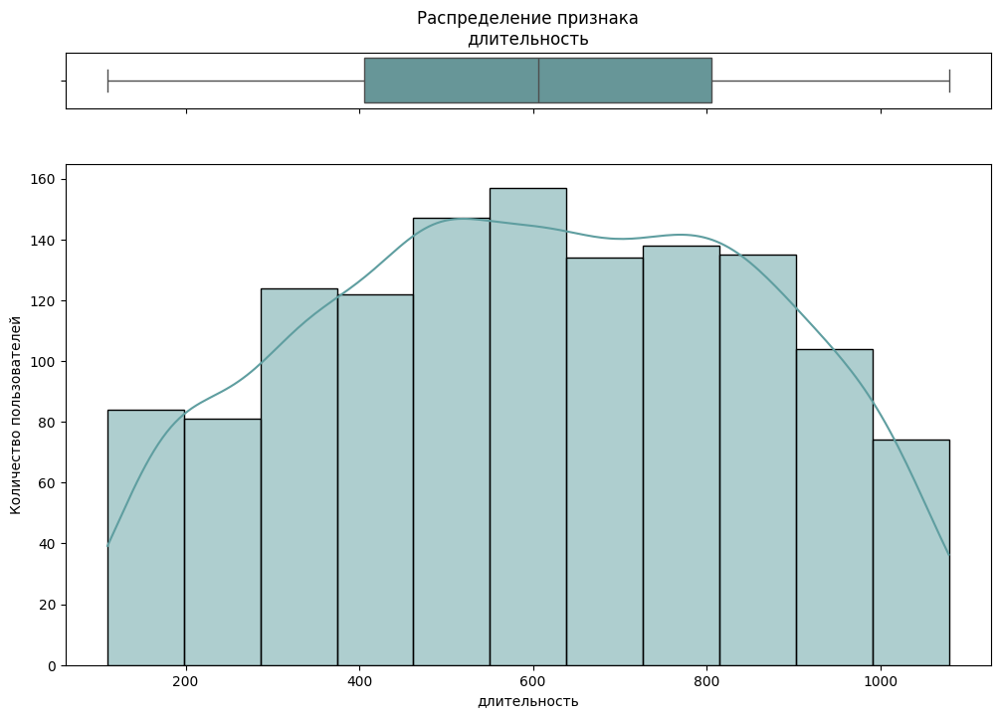

In [31]:
quant_feat_analysis(market_file, 'длительность')

Судя по гистограмме, распределение признака больше напоминает равномерное, чем нормальное. Боксплот показывает, что выбросов не наблюдается

#### акционные_покупки

Базовые статистики

count    1300.000000
mean        0.319808
std         0.249843
min         0.000000
25%         0.170000
50%         0.240000
75%         0.300000
max         0.990000
Name: акционные_покупки, dtype: float64
-----------------------------------------------------


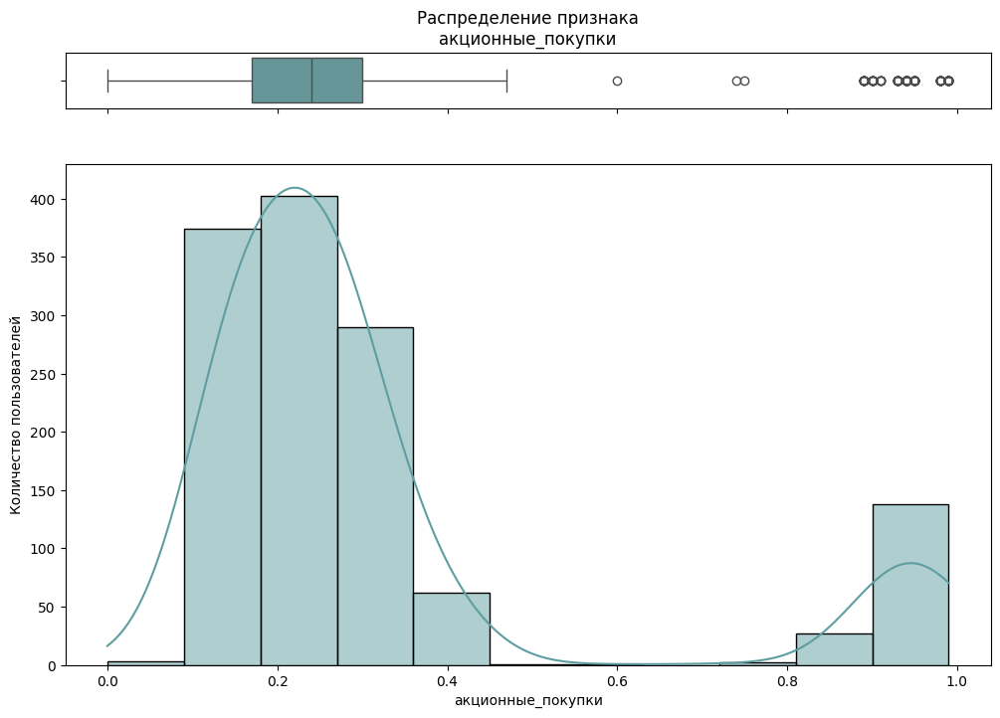

In [32]:
quant_feat_analysis(market_file, 'акционные_покупки')

Наблюдается явная бимодальность в значениях признака, граница проходит около значения **0.7**. Можно предположить, что большая часть пользователей с невысоким значением признака покупают товары по акции не очень часто, однако некоторая часть пользователей с высоким значением признака покупают товары почти всегда только по акции. Запомним этот признак как кандидат на то, чтобы быть категоризованным.

#### популярная_категория

Уникальные значения

Товары для детей                        0.253846
Домашний текстиль                       0.193077
Косметика и аксесуары                   0.171538
Техника для красоты и здоровья          0.141538
Мелкая бытовая техника и электроника    0.133846
Кухонная посуда                         0.106154
Name: популярная_категория, dtype: float64
-----------------------------------------------------
Базовые статистики

count                 1300
unique                   6
top       Товары для детей
freq                   330
Name: популярная_категория, dtype: object
-----------------------------------------------------


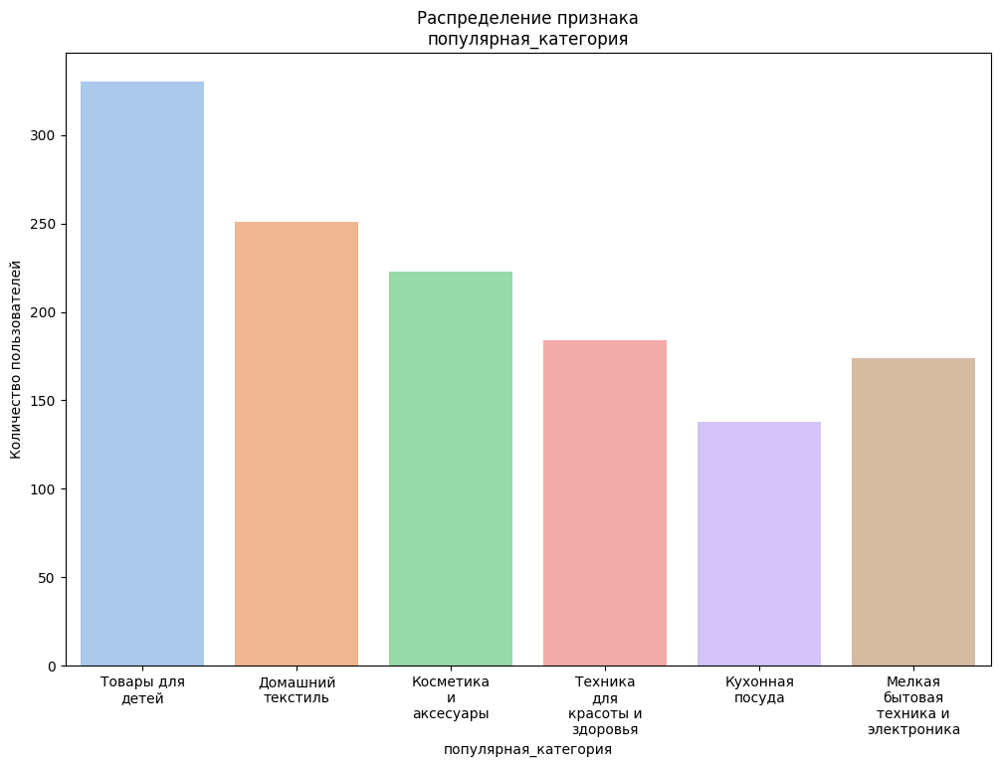

In [33]:
cat_feat_analysis(market_file, 'популярная_категория')

Исправим опечатку в названии класса

Уникальные значения

Товары для детей                        0.253846
Домашний текстиль                       0.193077
Косметика и аксессуары                  0.171538
Техника для красоты и здоровья          0.141538
Мелкая бытовая техника и электроника    0.133846
Кухонная посуда                         0.106154
Name: популярная_категория, dtype: float64
-----------------------------------------------------
Базовые статистики

count                 1300
unique                   6
top       Товары для детей
freq                   330
Name: популярная_категория, dtype: object
-----------------------------------------------------


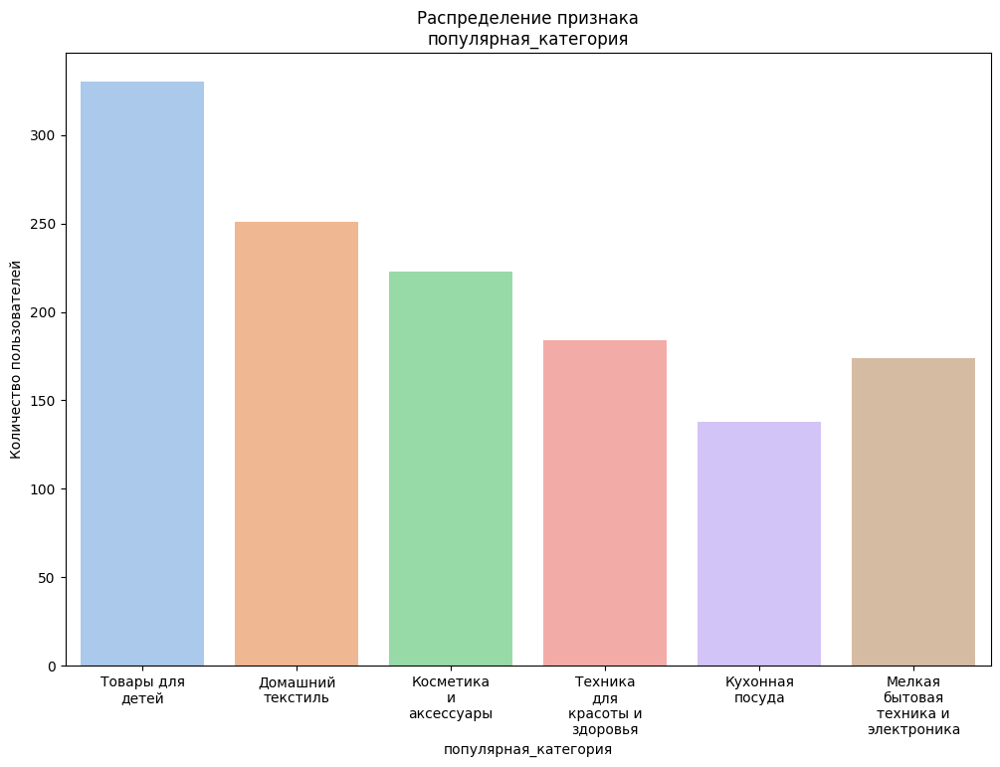

In [34]:
market_file['популярная_категория'].replace('Косметика и аксесуары', 'Косметика и аксессуары', 
                             regex=True,
                             inplace=True)
cat_feat_analysis(market_file, 'популярная_категория')

Всего существует 6 уникальных популярных категорий товаров. Самая популярная - `товары для детей`, наименее популярная - `кухонная посуда`

#### средний_просмотр_категорий_за_визит

Уникальные значения

3    0.273846
2    0.240000
4    0.202308
5    0.136154
1    0.081538
6    0.066154
Name: средний_просмотр_категорий_за_визит, dtype: float64
-----------------------------------------------------
Базовые статистики

count    1300.00000
mean        3.27000
std         1.35535
min         1.00000
25%         2.00000
50%         3.00000
75%         4.00000
max         6.00000
Name: средний_просмотр_категорий_за_визит, dtype: float64
-----------------------------------------------------


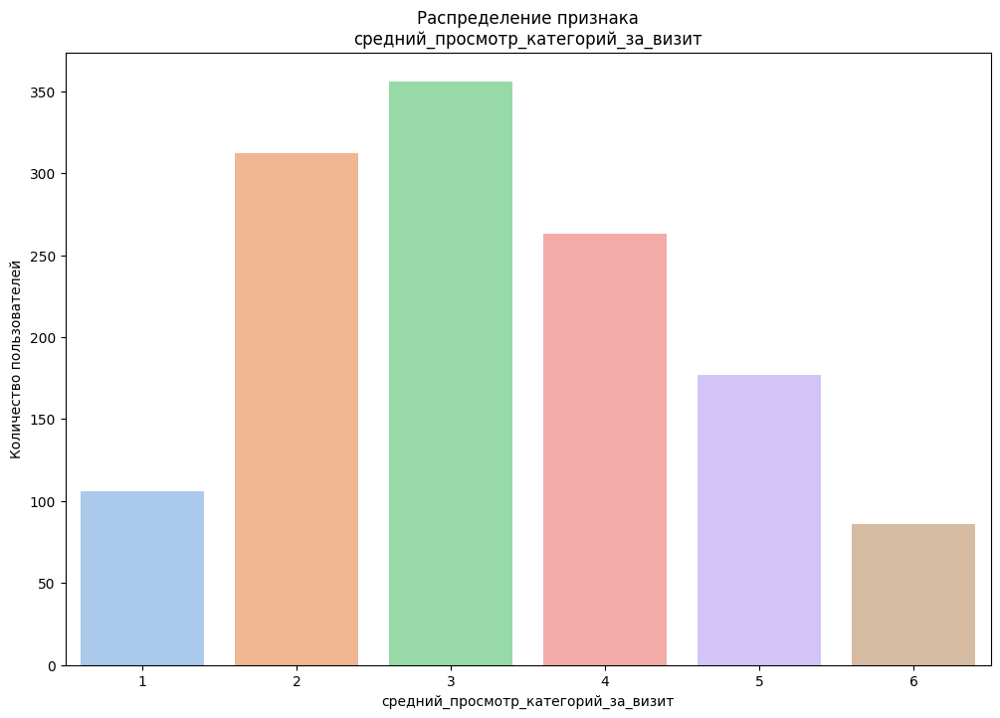

In [35]:
cat_feat_analysis(market_file, 'средний_просмотр_категорий_за_визит')

Наиболее часто пользователи смотрели в среднем от 2 до 4 категорий за визит в течение последнего месяца, реже всего - 1 из 6 или все 6 категорий. Наиболее популярное значение - 3 категории, наименее популярное - 6 категорий

#### неоплаченные_продукты_штук_квартал

Уникальные значения

1     0.200769
2     0.200769
3     0.167692
4     0.151538
5     0.103846
0     0.089231
6     0.033846
7     0.026154
8     0.015385
9     0.007692
10    0.003077
Name: неоплаченные_продукты_штук_квартал, dtype: float64
-----------------------------------------------------
Базовые статистики

count    1300.000000
mean        2.840000
std         1.971451
min         0.000000
25%         1.000000
50%         3.000000
75%         4.000000
max        10.000000
Name: неоплаченные_продукты_штук_квартал, dtype: float64
-----------------------------------------------------


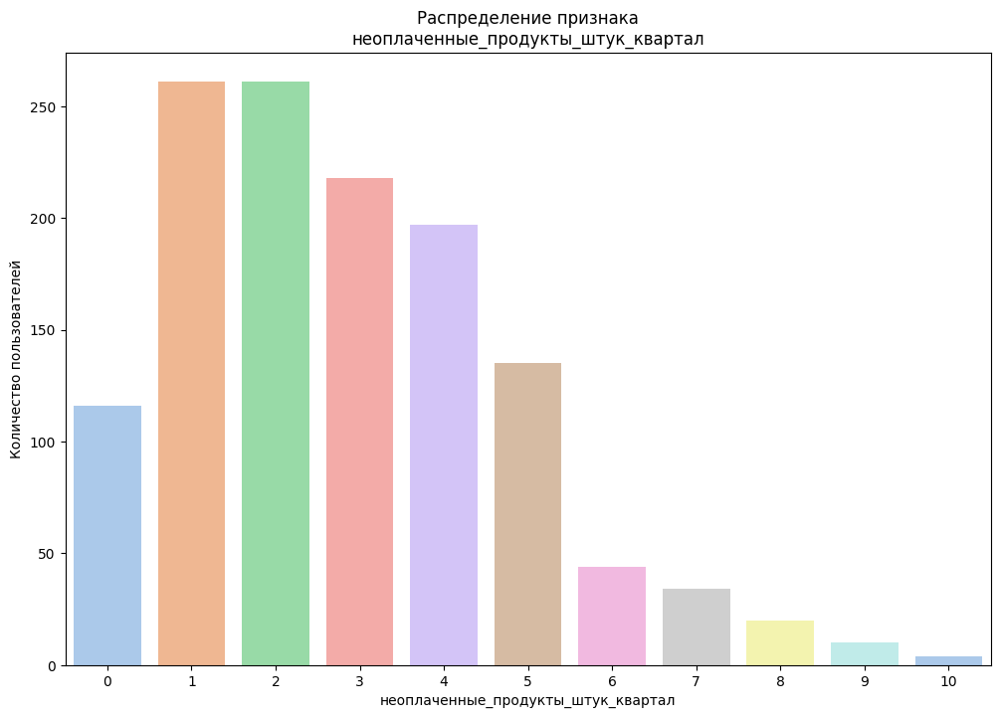

In [36]:
cat_feat_analysis(market_file, 'неоплаченные_продукты_штук_квартал')

Распределение мономодальное, имеет вид пуассоновского. Можно отметить, что наиболее часто пользователи имеют от 1 до 4 неоплаченных товаров в корзине за последние 3 месяца. Суммарная доля людей, у которых не оплачено от 6 до 10 покупок, меньше 9 процентов. Самые частые значения - 1 или 2 неоплаченных товара, меньше всего пользователей имеют 10 неоплаченных товаров

#### ошибка_сервиса

Уникальные значения

4    0.197692
3    0.173846
5    0.160000
2    0.145385
6    0.120000
7    0.070769
1    0.056923
8    0.050769
0    0.013077
9    0.011538
Name: ошибка_сервиса, dtype: float64
-----------------------------------------------------
Базовые статистики

count    1300.000000
mean        4.185385
std         1.955298
min         0.000000
25%         3.000000
50%         4.000000
75%         6.000000
max         9.000000
Name: ошибка_сервиса, dtype: float64
-----------------------------------------------------


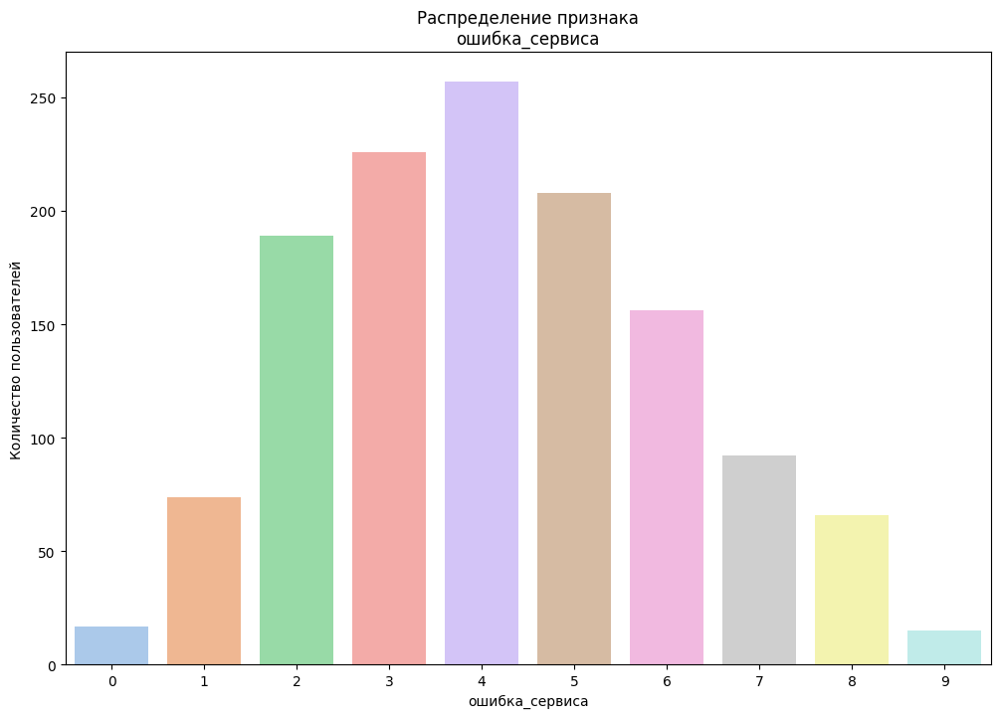

In [37]:
cat_feat_analysis(market_file, 'ошибка_сервиса')

Распределение мономодальное. Можно отметить, что чаще всего пользователи сталкивались с 2-6 ошибками во время посещения сайта. Пользователей, которые вообще не сталкивались со сбоями, всего около 1%, как и пользователей с максимальным числом ошибок - 9. Наиболее часто встречающееся значение - 4 ошибки

#### страниц_за_визит

Уникальные значения

6     0.097692
5     0.088462
4     0.086154
8     0.083846
9     0.083077
10    0.080000
7     0.078462
11    0.070769
3     0.058462
12    0.056154
13    0.046923
2     0.044615
14    0.040769
15    0.027692
16    0.016154
1     0.015385
17    0.014615
18    0.005385
19    0.003846
20    0.001538
Name: страниц_за_визит, dtype: float64
-----------------------------------------------------
Базовые статистики

count    1300.000000
mean        8.176923
std         3.978126
min         1.000000
25%         5.000000
50%         8.000000
75%        11.000000
max        20.000000
Name: страниц_за_визит, dtype: float64
-----------------------------------------------------


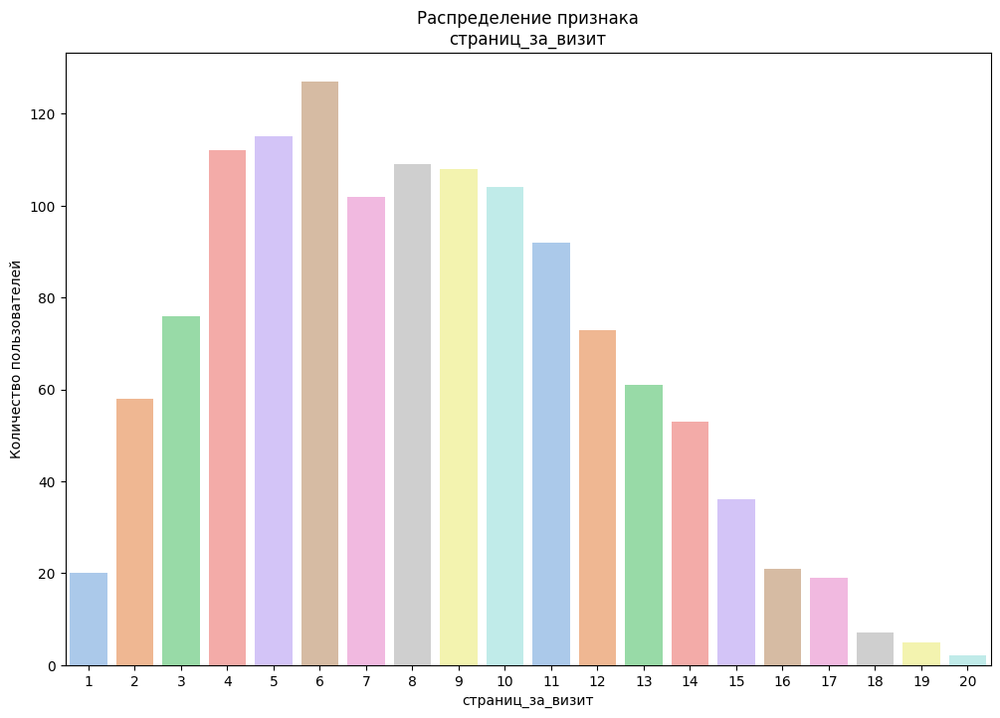

In [38]:
cat_feat_analysis(market_file, 'страниц_за_визит')

Распределение мономодальное. Можно отметить, что чаще всего пользователи посещали 4-10 страниц сайта за один визит. Пользователей, посетивших только 1 страницу, всего около 1.5%, пользователей, посетивших максимальное число страниц - 20 - меньше 0.2%. Самое часто встречающееся значение - 6

### market_money

#### id

Не будем анализировать столбец с идентификаторами

#### период

Уникальные значения

предыдущий_месяц       0.333333
препредыдущий_месяц    0.333333
текущий_месяц          0.333333
Name: период, dtype: float64
-----------------------------------------------------
Базовые статистики

count                 3900
unique                   3
top       предыдущий_месяц
freq                  1300
Name: период, dtype: object
-----------------------------------------------------


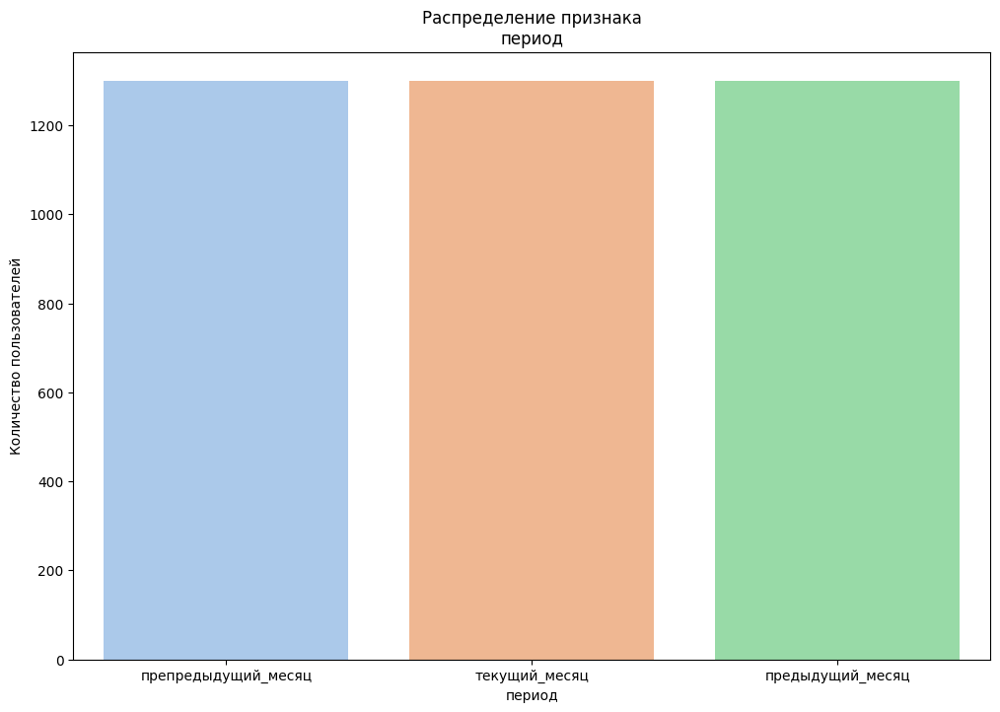

In [39]:
cat_feat_analysis(market_money, 'период')

Видно, что для каждого пользователя существует информация по 3 последним месяцам, распределённая в равных пропорциях. В будущем необходимо будет сделать отдельные столбцы для каждого периода.

#### выручка

Базовые статистики

count      3900.000000
mean       5025.696289
std        1777.704224
min           0.000000
25%        4590.150146
50%        4957.500000
75%        5363.000000
max      106862.203125
Name: выручка, dtype: float64
-----------------------------------------------------


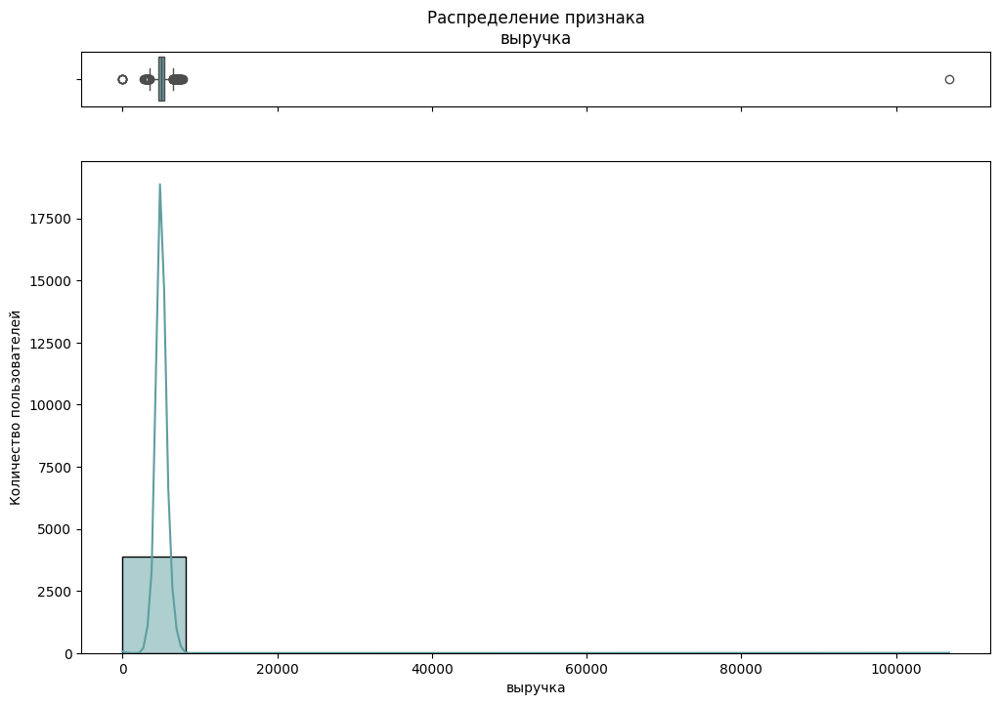

In [40]:
quant_feat_analysis(market_money, 'выручка')

Судя по боксплоту, наблюдаем аномальные значения крайне высокой выручки. Изучим эти значения

In [41]:
market_money.query('выручка > 10000')

,id,период,выручка
98,215380,текущий_месяц,106862.203125


Всего одна аномальная запись (0.08% от общего числа). Посмотрим на все записи для пользователя с указанным `id` 

In [42]:
market_money.query('id == 215380')

,id,период,выручка
96,215380,препредыдущий_месяц,5051.000000
97,215380,предыдущий_месяц,6077.000000
98,215380,текущий_месяц,106862.203125


Видно, что у пользователя с id **215380** аномальная выручка была получена только в текущем месяце.
Так как данное значение более чем в 20 раз отличается от медианы и среднего, удалим запись с выбросом.

Также создадим список значений `outliers_id` с идентификаторами клиентов удалённых записей

Базовые статистики

count    3899.000000
mean     4999.577148
std       706.999878
min         0.000000
25%      4590.100098
50%      4957.000000
75%      5363.000000
max      7799.399902
Name: выручка, dtype: float64
-----------------------------------------------------


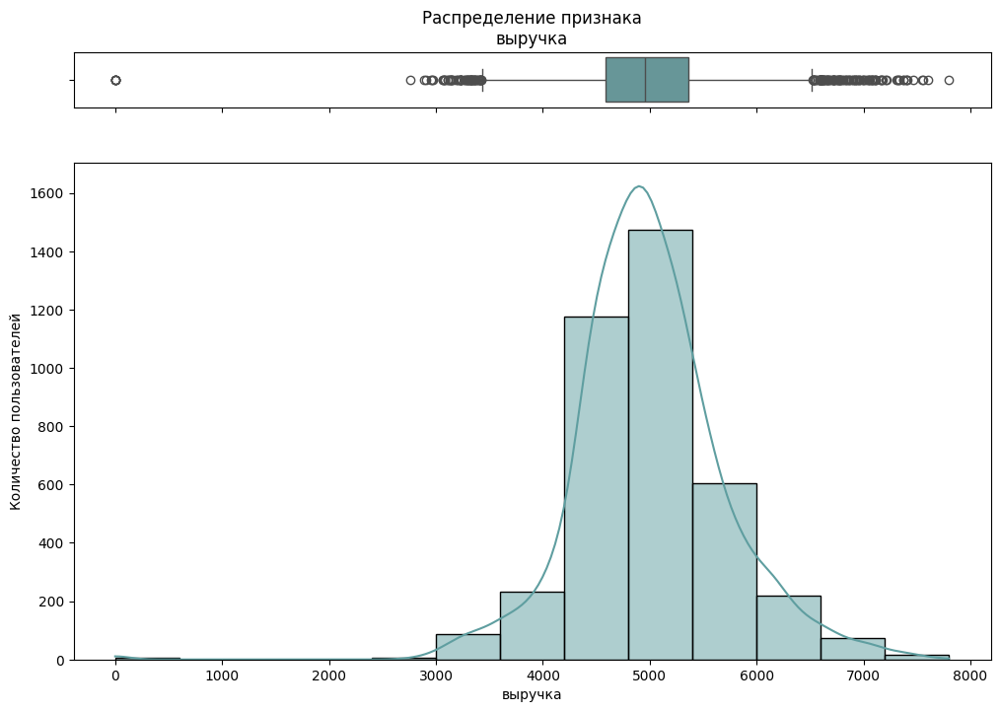

In [43]:
outliers_id = [215380]
market_money.query('выручка < 10000', inplace=True)
quant_feat_analysis(market_money, 'выручка')

Картина распределения значений признака приняла более адекватный вид. Однако мы помним, что нас будут интересовать клиенты, совершавшие покупки как минимум 3 последних месяца. Поэтому нас также интересует наличие записей с нулевым значением признака.

In [44]:
market_money.query('выручка == 0')

,id,период,выручка
0,215348,препредыдущий_месяц,0.0
2,215348,предыдущий_месяц,0.0
28,215357,препредыдущий_месяц,0.0
29,215357,предыдущий_месяц,0.0
34,215359,предыдущий_месяц,0.0
35,215359,препредыдущий_месяц,0.0


Шесть записей и 3 пользователя, отвечающих указанным условиям (0.23% от общего числа). Посмотрим на все записи для пользователей с указанными `id` 

In [45]:
market_money.query('id == 215348 | id == 215357 | id == 215359')

,id,период,выручка
0,215348,препредыдущий_месяц,0.000000
1,215348,текущий_месяц,3293.100098
2,215348,предыдущий_месяц,0.000000
27,215357,текущий_месяц,5986.299805
28,215357,препредыдущий_месяц,0.000000
29,215357,предыдущий_месяц,0.000000
33,215359,текущий_месяц,4735.000000
34,215359,предыдущий_месяц,0.000000
35,215359,препредыдущий_месяц,0.000000


Три пользователя имеют покупки только в текущем месяце, однако ничего не покупали до этого. Очевидно, такие пользователи нам не подойдут, поэтому удалим записи с нулевым значением выручки, а также обновим список с `id`

Базовые статистики

count    3893.000000
mean     5007.282715
std       679.724915
min      2758.699951
25%      4592.000000
50%      4959.000000
75%      5363.000000
max      7799.399902
Name: выручка, dtype: float64
-----------------------------------------------------


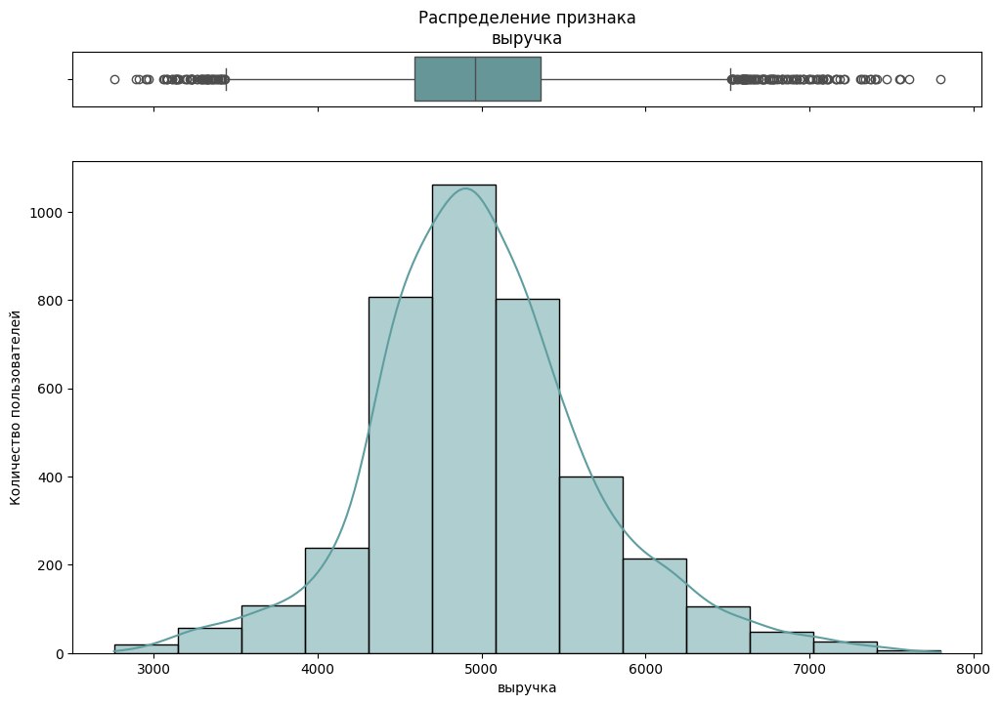

In [46]:
outliers_id.extend([215348, 215357, 215359])
market_money.query('выручка > 0', inplace=True)
quant_feat_analysis(market_money, 'выручка')

Теперь по гистограмме и боксплоту видно, что явных выбросов не наблюдается. Распределение мономодальное, скошено вправо (медиана меньше среднего арифметического). Не будем удалять значения, отмеченнные боксплотом как выбросы - они не являются критическими

### market_time

#### id

Не будем анализировать столбец с идентификаторами пользователей

#### период

Уникальные значения

предыдцщий_месяц    0.5
текущий_месяц       0.5
Name: период, dtype: float64
-----------------------------------------------------
Базовые статистики

count                 2600
unique                   2
top       предыдцщий_месяц
freq                  1300
Name: период, dtype: object
-----------------------------------------------------


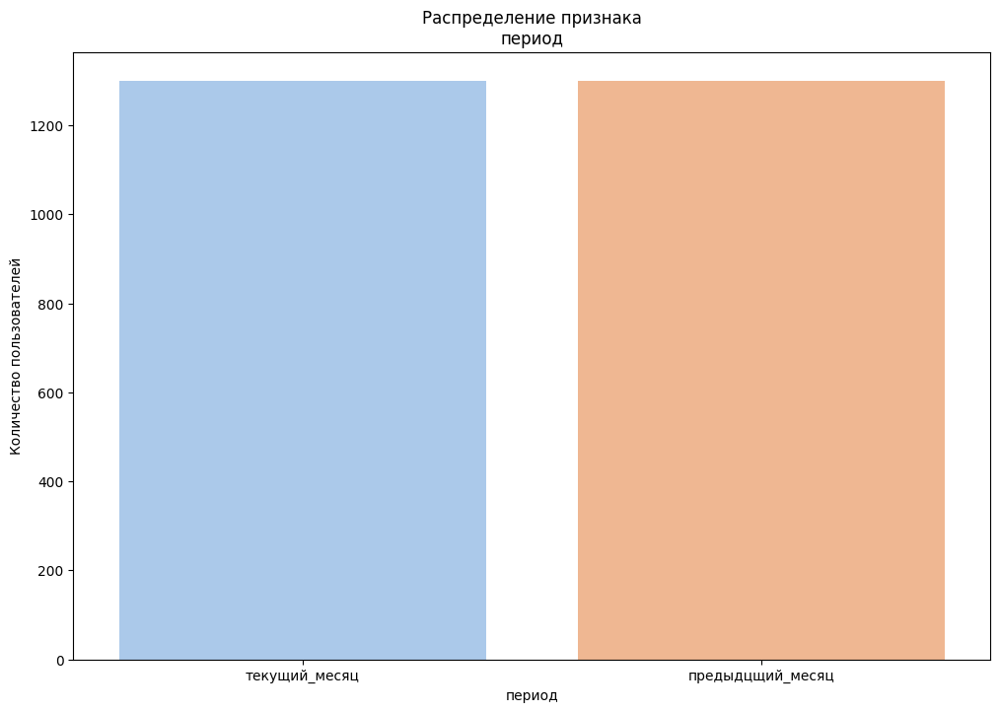

In [47]:
cat_feat_analysis(market_time, 'период')

Видно, что есть опечатка в названии одной категории, исправим её

Уникальные значения

предыдущий_месяц    0.5
текущий_месяц       0.5
Name: период, dtype: float64
-----------------------------------------------------
Базовые статистики

count                 2600
unique                   2
top       предыдущий_месяц
freq                  1300
Name: период, dtype: object
-----------------------------------------------------


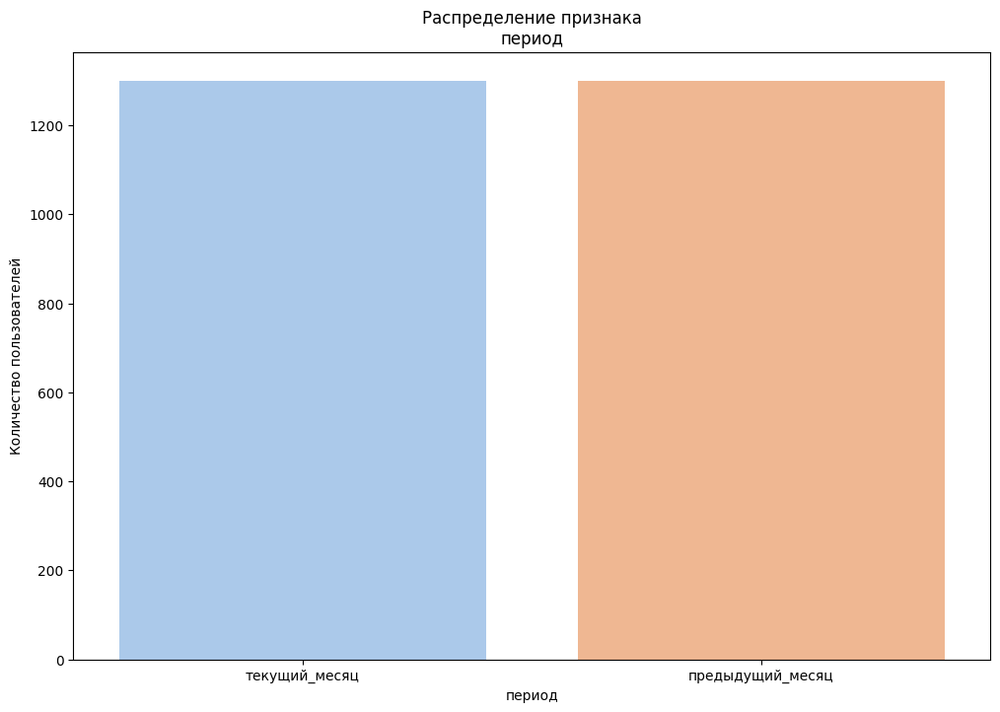

In [48]:
market_time['период'].replace('предыдцщий_месяц', 'предыдущий_месяц', 
                             regex=True,
                             inplace=True)
cat_feat_analysis(market_time, 'период')

Наблюдаем, что для каждого пользователя существует информация по времени на сайте за два месяца - текущий и предыдущий. Не забудем, что при объединении надо будет разделить информацию на отдельные столбцы


#### минут

Уникальные значения

14    0.098462
12    0.091154
11    0.085000
13    0.079231
10    0.078462
9     0.071538
15    0.066923
17    0.062692
16    0.062308
18    0.055769
8     0.054231
19    0.045769
20    0.038846
7     0.033846
6     0.022692
21    0.020385
22    0.015385
5     0.008462
23    0.005385
4     0.003462
Name: минут, dtype: float64
-----------------------------------------------------
Базовые статистики

count    2600.000000
mean       13.336154
std         4.080198
min         4.000000
25%        10.000000
50%        13.000000
75%        16.000000
max        23.000000
Name: минут, dtype: float64
-----------------------------------------------------


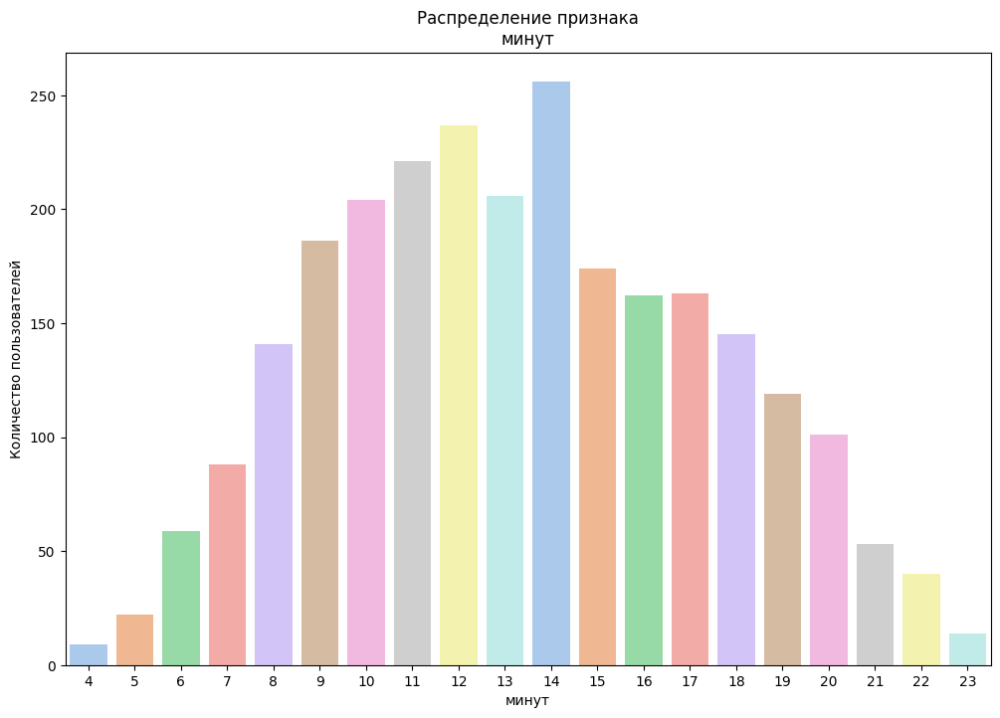

In [49]:
cat_feat_analysis(market_time, 'минут')

Распределение мономодальное. Можно отметить, что чаще всего люди находятся на сайте от 9 до 15 минут. Меньше всего люди находились на сайте в экстремальных значениях - 4 и 23 минуты. Мода - 14 минут

### money

#### id

Не будем анализировать идентификаторы пользователей

#### прибыль


Базовые статистики

count    1300.000000
mean        3.996630
std         1.013722
min         0.860000
25%         3.300000
50%         4.045000
75%         4.670000
max         7.430000
Name: прибыль, dtype: float64
-----------------------------------------------------


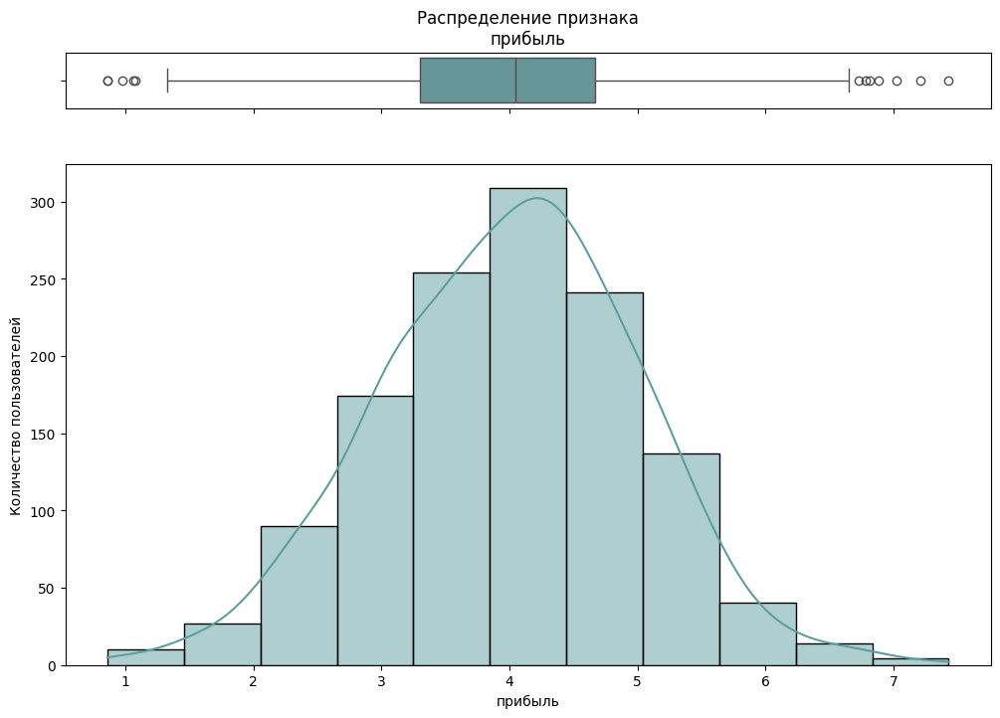

In [50]:
quant_feat_analysis(money, 'прибыль')

Распределение признака мономодальное. Медиана больше среднего арифметического - наблюдаем скошенное влево распределение. Выбросы удалять не будем, так как они не являются критическими

Теперь необходимо отфильтровать клиентов в каждом из датафреймов. Используем для этого наш ранее сформированный список идентификаторов

In [51]:
outliers_id

[215380, 215348, 215357, 215359]

In [52]:
market_file.query('id != @outliers_id', inplace=True)
market_file.shape

(1296, 13)

In [53]:
market_money.query('id != @outliers_id', inplace=True)
market_money.shape

(3888, 3)

In [54]:
market_time.query('id != @outliers_id', inplace=True)
market_time.shape

(2592, 3)

Удаление произведено успешно: в датафрейме `market_file` удалены 4 записи (из 1300), соответствующие 4 пользователям. В датафрейме `market_money` - 12 записей (из 3900), соответствующих трём месяцам для 4 пользователей. В датафрейме `market_time` - 8 записей (из 2600), соответствующих двум месяцам для 4 пользователей

Таким образом, был проведён исследовательский анализ данных в четырёх датафреймах. 
* Были проанализированы количественные и категориальные признаки, проведена коррекция данных там, где имели место неявные дубликаты в названиях групп категориальных признаков или опечатки в названиях категорий;
* отмечена несбалансированность классов целевого признака, что необходимо будет учесть пр обучении модели;
* установлена бимодальность признака `акционные покупки` датафрейма `market_file`  - необходимо будет категоризовать данный признак перед обучением модели;
* удалён явный выброс в признаке `выручка` датайфрейма `market_money`;
* удалены записи о пользователях, показатель выручки для которых в какой-либо из 3 последних месяцев равняется нулю


## Объединение таблиц

In [55]:
#создадим датафрейм market_money_exp на основе market_money,
#в котором выделим новые столбцы на основании каждого периода времени
market_money_exp = market_money.pivot_table(index=['id'], columns=['период'])
market_money_exp.columns = ['выручка_предыдущий_месяц', 'выручка_препредыдущий_месяц', 'выручка_текущий_месяц']
market_money_exp['id'] = market_money_exp.index
market_money_exp.head()

,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,id
id,,,,
215349,5216.0,4472.0,4971.600098,215349
215350,5457.5,4826.0,5058.399902,215350
215351,6158.0,4793.0,6610.399902,215351
215352,5807.5,4594.0,5872.500000,215352
215353,4738.5,5124.0,5388.500000,215353


In [56]:
#создадим датафрейм market_time_exp на основе market_time,
#в котором выделим новые столбцы на основании каждого периода времени
market_time_exp = market_time.pivot_table(index=['id'], columns=['период'])
market_time_exp.columns = ['минут_предыдущий_месяц', 'минут_текущий_месяц']
market_time_exp['id'] = market_time_exp.index
market_time_exp.head()

,минут_предыдущий_месяц,минут_текущий_месяц,id
id,,,
215349,12,10,215349
215350,8,13,215350
215351,11,13,215351
215352,8,11,215352
215353,10,10,215353


In [57]:
#объединим датафреймы по столбцу id 
#в новый датафрейм market_df
market_df = (market_file.join(market_money_exp, on='id', lsuffix='_1', rsuffix='_2') 
                        .drop(columns='id_2')
                        .rename(columns={'id_1':'id'}))
market_df = (market_df.join(market_time_exp, on='id', lsuffix='_1', rsuffix='_2')
                      .drop(columns='id_2')
                      .rename(columns={'id_1':'id'}))
market_df.head()

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,5216.0,4472.0,4971.600098,12,10
2,215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,5457.5,4826.0,5058.399902,8,13
3,215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,6158.0,4793.0,6610.399902,11,13
4,215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,5807.5,4594.0,5872.500000,8,11
5,215353,Снизилась,стандарт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4,4738.5,5124.0,5388.500000,10,10


In [58]:
df_basic_info(market_df)

Названия столбцов

Index(['id', 'покупательская_активность', 'тип_сервиса', 'разрешить_сообщать',
       'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность',
       'акционные_покупки', 'популярная_категория',
       'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_предыдущий_месяц',
       'выручка_препредыдущий_месяц', 'выручка_текущий_месяц',
       'минут_предыдущий_месяц', 'минут_текущий_месяц'],
      dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['id', 'покупательская_активность', 'тип_сервиса', 'разрешить_сообщать',
       'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность',
       'акционные_покупки', 'популярная_категория',
       'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_предыдущий_месяц',
       'выручка_пре

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,5216.0,4472.0,4971.600098,12,10
2,215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,5457.5,4826.0,5058.399902,8,13
3,215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,6158.0,4793.0,6610.399902,11,13
4,215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,5807.5,4594.0,5872.500000,8,11
5,215353,Снизилась,стандарт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4,4738.5,5124.0,5388.500000,10,10
6,215354,Снизилась,стандарт,да,5.1,3,431,0.23,Косметика и аксессуары,2,3,7,2,5685.0,4503.0,5869.600098,11,12
7,215355,Снизилась,стандарт,нет,4.7,4,284,0.17,Товары для детей,5,1,6,4,3263.0,4749.0,3772.600098,12,10
8,215356,Снизилась,стандарт,да,4.2,4,192,0.14,Косметика и аксессуары,2,2,1,3,4146.5,4433.0,4566.399902,6,7
10,215358,Снизилась,стандарт,да,4.7,4,450,0.13,Домашний текстиль,4,2,6,4,3488.0,4727.0,4209.500000,14,10
12,215360,Снизилась,премиум,да,3.9,3,623,0.35,Кухонная посуда,3,1,4,7,5304.5,5555.0,5834.899902,9,6


Объединение датафреймов было произведено успешно и корректно - имеем 1296 записей о клиентах (как и должно быть), добавились 5 новых столбцов с помесячной разбивкой по выручке и минутам, "артефактов" в виде пропущенных значений или `NaN` в столбцах не добавилось

Проверим также объединённый датафрейм на предмет неявных дубликатов - посмотрим на записи без учёта `id`

In [59]:
market_df[market_df.duplicated(subset=['покупательская_активность', 
                                       'тип_сервиса', 
                                       'разрешить_сообщать',
                                       'маркет_актив_6_мес', 
                                       'маркет_актив_тек_мес', 
                                       'длительность', 
                                       'акционные_покупки', 
                                       'популярная_категория', 
                                       'средний_просмотр_категорий_за_визит',
                                       'неоплаченные_продукты_штук_квартал', 
                                       'ошибка_сервиса', 
                                       'страниц_за_визит',
                                       'выручка_предыдущий_месяц', 
                                       'выручка_препредыдущий_месяц', 
                                       'выручка_текущий_месяц', 
                                       'минут_предыдущий_месяц',
                                       'минут_текущий_месяц'])].shape

(11, 18)

Имеем 11 неявных дубликатов, различающихся лишь номером `id` клиента. Так как совпадение такого большого числа параметров нереально, а `id` идут подряд, можем предположить, что эти записи попали в датафрейм ошибочно. Для того, чтобы модель показала корректные результаты, необходимо удалить дубликаты

In [60]:
market_df.drop_duplicates(subset=['покупательская_активность', 
                                  'тип_сервиса', 
                                  'разрешить_сообщать',
                                  'маркет_актив_6_мес', 
                                  'маркет_актив_тек_мес', 
                                  'длительность', 
                                  'акционные_покупки', 
                                  'популярная_категория', 
                                  'средний_просмотр_категорий_за_визит',
                                  'неоплаченные_продукты_штук_квартал', 
                                  'ошибка_сервиса', 
                                  'страниц_за_визит',
                                  'выручка_предыдущий_месяц', 
                                  'выручка_препредыдущий_месяц',
                                  'выручка_текущий_месяц', 
                                  'минут_предыдущий_месяц', 
                                  'минут_текущий_месяц'], inplace=True)
df_basic_info(market_df)

Названия столбцов

Index(['id', 'покупательская_активность', 'тип_сервиса', 'разрешить_сообщать',
       'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность',
       'акционные_покупки', 'популярная_категория',
       'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_предыдущий_месяц',
       'выручка_препредыдущий_месяц', 'выручка_текущий_месяц',
       'минут_предыдущий_месяц', 'минут_текущий_месяц'],
      dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['id', 'покупательская_активность', 'тип_сервиса', 'разрешить_сообщать',
       'маркет_актив_6_мес', 'маркет_актив_тек_мес', 'длительность',
       'акционные_покупки', 'популярная_категория',
       'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_предыдущий_месяц',
       'выручка_пре

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,5216.0,4472.0,4971.600098,12,10
2,215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,5457.5,4826.0,5058.399902,8,13
3,215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,6158.0,4793.0,6610.399902,11,13
4,215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,5807.5,4594.0,5872.500000,8,11
5,215353,Снизилась,стандарт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4,4738.5,5124.0,5388.500000,10,10
6,215354,Снизилась,стандарт,да,5.1,3,431,0.23,Косметика и аксессуары,2,3,7,2,5685.0,4503.0,5869.600098,11,12
7,215355,Снизилась,стандарт,нет,4.7,4,284,0.17,Товары для детей,5,1,6,4,3263.0,4749.0,3772.600098,12,10
8,215356,Снизилась,стандарт,да,4.2,4,192,0.14,Косметика и аксессуары,2,2,1,3,4146.5,4433.0,4566.399902,6,7
10,215358,Снизилась,стандарт,да,4.7,4,450,0.13,Домашний текстиль,4,2,6,4,3488.0,4727.0,4209.500000,14,10
12,215360,Снизилась,премиум,да,3.9,3,623,0.35,Кухонная посуда,3,1,4,7,5304.5,5555.0,5834.899902,9,6


Удаление неявных дубликатов произведено успешно

Таким образом, в данном разделе был получен датафрейм `market_df` путём объединения записей из датафреймов `market_time`, `market_money` и `market_file`. При этом было обнаружено 11 неявных дубликатов (которые, очевидно, присутствовали и в исходных датафреймах). Данные неявные дубликаты были удалены во избежание некорректного моделирования


## Корреляционный анализ

Проведём корреляционный анализ. Сначала изучим корреляции между количественными признаками с использованием коэффициента Спирмена (хоть у нас и есть признаки, распределение которых визуально (по гистограмме) близко к нормальному, идеального нормального распределения не наблюдается). Создадим списки количественных и категориальных признаков для этого.

In [61]:
market_df_quant_cols = ['маркет_актив_6_мес', 
                        'маркет_актив_тек_мес', 
                        'длительность', 
                        'акционные_покупки', 
                        'средний_просмотр_категорий_за_визит',
                        'неоплаченные_продукты_штук_квартал', 
                        'ошибка_сервиса', 
                        'страниц_за_визит',
                        'выручка_предыдущий_месяц', 
                        'выручка_препредыдущий_месяц', 
                        'выручка_текущий_месяц', 
                        'минут_предыдущий_месяц', 
                        'минут_текущий_месяц']

market_df_cat_cols = ['покупательская_активность', 
                      'тип_сервиса', 
                      'разрешить_сообщать',
                      'популярная_категория']

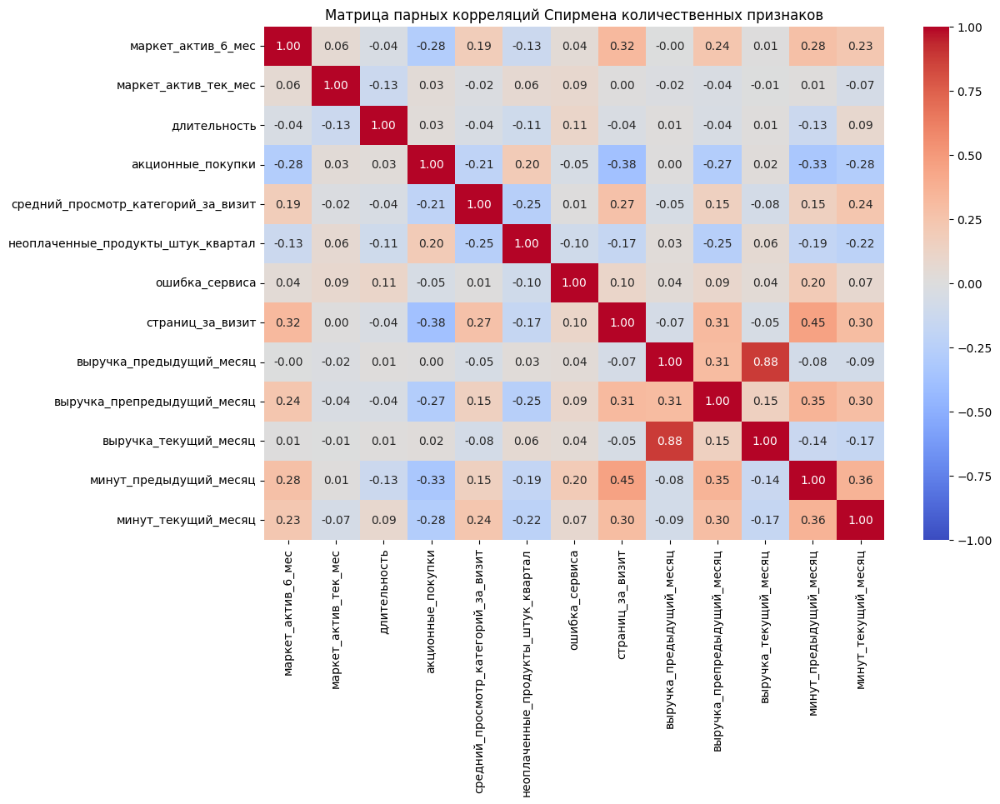

In [62]:
#рассчитаем коэффициенты корреляции Спирмена между количественными признаками
corr_df_spearman = market_df[market_df_quant_cols].corr(method='spearman')
sns.heatmap(corr_df_spearman,
            cmap='coolwarm',
            annot=True,
            vmin=-1,
            vmax=1,
            fmt='.2f').set(title='Матрица парных корреляций Спирмена количественных признаков');

Судя по данной матрице корреляций, мультиколлинеарности между количественными признаками не наблюдается. Заметна высокая прямая связь между признаками `выручка_предыдущий_месяц` и `выручка_текущий_месяц` (0.88) (интересно отметить, что с признаком `выручка_препредыдущий_месяц` связи у двух отмеченных признаков гораздо слабее), а также умеренная связь между признаками `страниц_за_визит` и `минут_предыдущий_месяц` (0.45). Между остальными парами признаков свзь слабая или очень слабая

Теперь проведём корреляционный анализ с помощью библиотеки `phik`. Сначала посмотрим на коэффициенты корреляции всех исходных признаков без разделения на классы

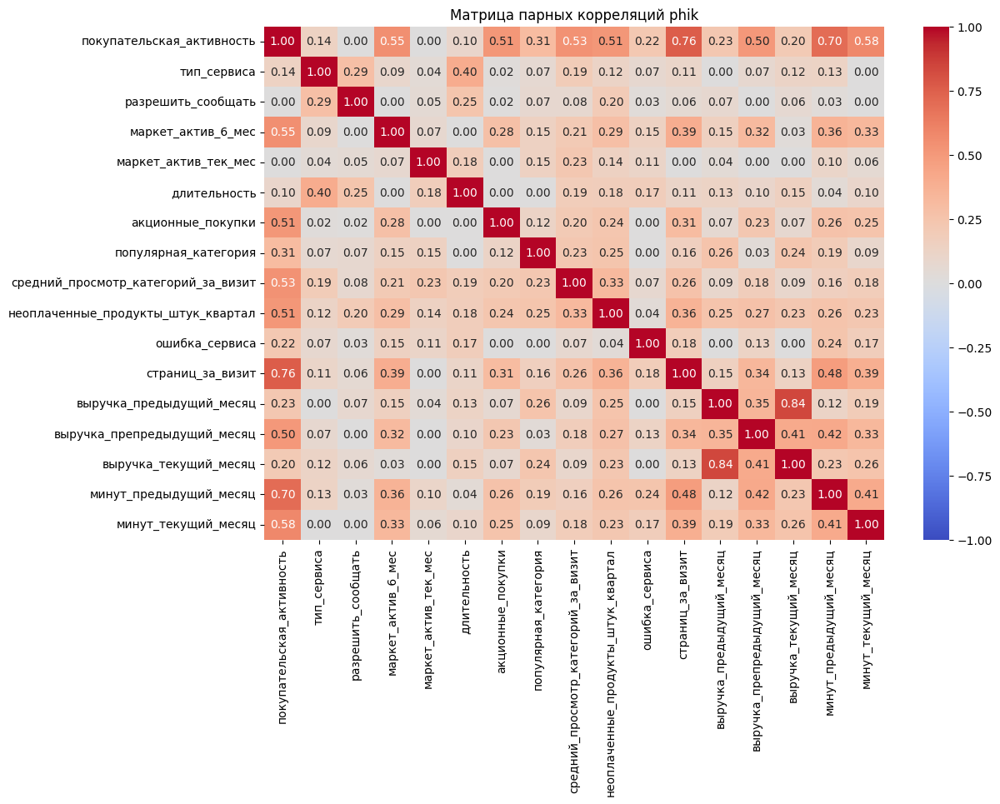

In [63]:
#создадим датафрейм corr_df, в который войдут все признаки исходного датафрема, кроме id
corr_df = market_df.loc[:, market_df.columns != 'id']

#рассчитаем коэффициенты корреляции между всеми признаками
sns.heatmap(corr_df.phik_matrix(interval_cols=market_df_quant_cols),
            cmap='coolwarm',
            annot=True,
            vmin=-1,
            vmax=1,
            fmt='.2f').set(title='Матрица парных корреляций phik');

Отметим корреляции с целевым признаком `покупательская_активность`:
* высокая: `страниц_за_визит` (0.76) и `минут_предыдущий_месяц` (0.70). Сильная прямая связь: чем больше времени пользователь проводит на сайте и просматривает страниц, тем больше его активность;
* заметная: `маркет_актив_6_мес` (0.55), `акционные_покупки` (0.51), `средний_просмотр_категорий_за_визит` (0.53), `неоплаченные_продукты_штук_квартал` (0.51), `выручка_препредыдущий_месяц` (0.50) и `минут_текущий_месяц` (0.58). Все эти признаки показывают заметную корреляцию с таргетом
* умеренная: `популярная_категория` (0.31), `ошибка_сервиса` (0.22), `выручка_предыдущий_месяц` (0.23).

Остальные признаки имеют слабую корреляцию с целевым признаком.

Посмотрим теперь на матрицы корреляции в завимости от значения целевого признака.

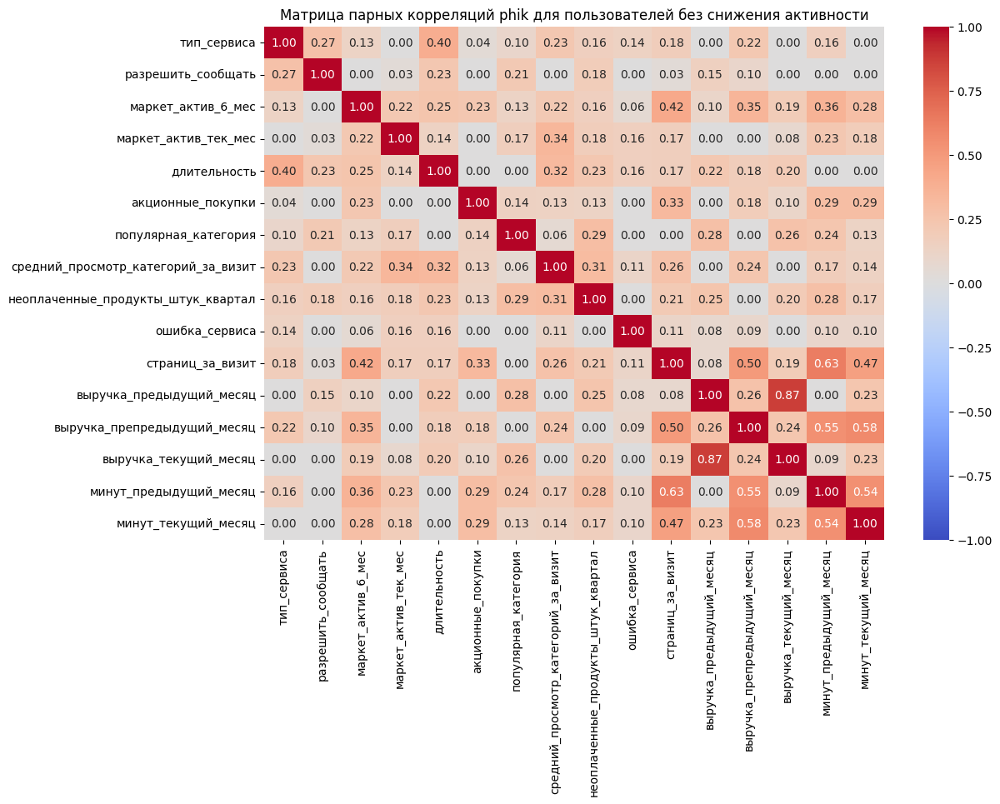

In [64]:
#рассчитаем коэффициенты корреляции между всеми признаками
#для пользователей без снижения активности
sns.heatmap((corr_df.query('покупательская_активность == "Снизилась"'))
                    .loc[:, corr_df.columns != 'покупательская_активность']
                    .phik_matrix(interval_cols=market_df_quant_cols),
             cmap='coolwarm',
             annot=True,
             vmin=-1,
             vmax=1,
             fmt='.2f').set(title='Матрица парных корреляций phik для пользователей без снижения активности');

Отметим значения парных корреляций, которые стали не меньше 0.5 для пользователей со сниженной активностью:
* высокая: `страниц_за_визит` и `минут_предыдущий_месяц` (0.63)
* заметная: `страниц_за_визит` и `выручка_препредыдущий_месяц` (0.50), `минут_предыдущий_месяц` и `выручка_препредыдущий_месяц` (0.55), `минут_текущий_месяц` и `выручка_препредыдущий_месяц` (0.58), `минут_предыдущий_месяц` и `выручка_текущий_месяц` (0.55).

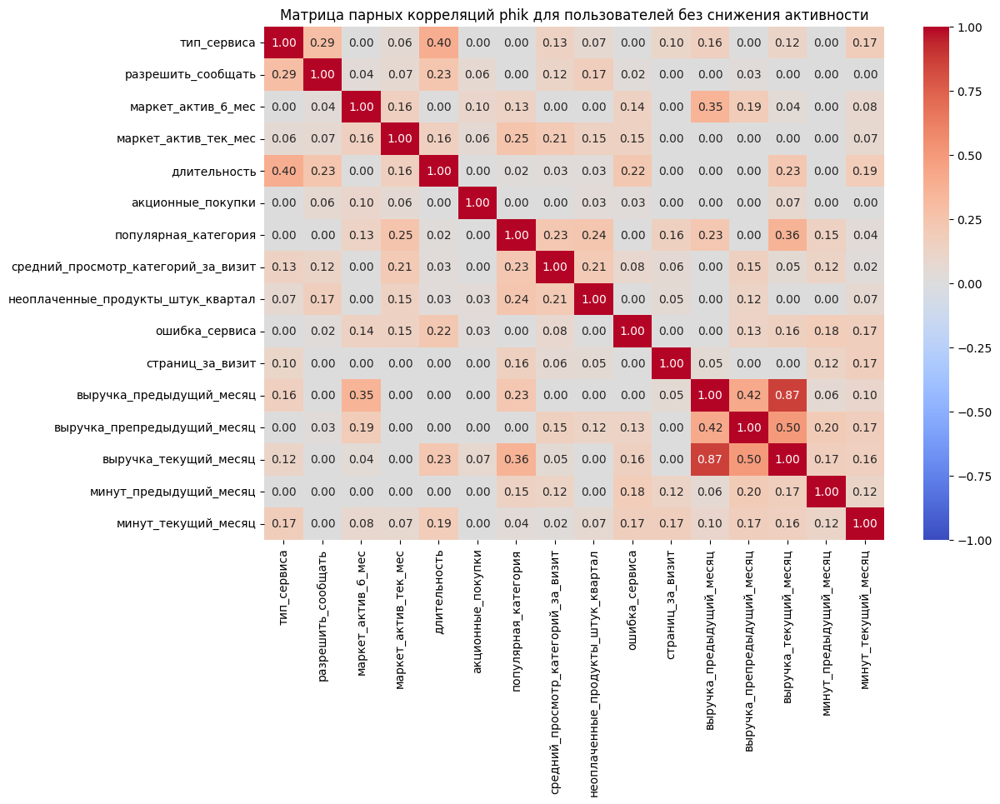

In [65]:
#рассчитаем коэффициенты корреляции между всеми признаками
#для пользователей без снижения активности
sns.heatmap((corr_df.query('покупательская_активность == "Прежний уровень"'))
                    .loc[:, corr_df.columns != 'покупательская_активность']
                    .phik_matrix(interval_cols=market_df_quant_cols),
             cmap='coolwarm',
             annot=True,
             vmin=-1,
             vmax=1,
             fmt='.2f').set(title='Матрица парных корреляций phik для пользователей без снижения активности');

Отметим значения парных корреляций, которые стали не меньше 0.5 для пользователей, у которых активность осталась на прежнем уровне:
* заметная: `выручка_текущий_месяц` и `выручка_препредыдущий_месяц` (0.50).

По матрицам корреляций `phik` для отдельных классов можно сделать следующие выводы:
* самый большой коэффициент парной корреляции достигается для обоих классов в паре `выручка_предыдущий_месяц` и `выручка_текущий_месяц` (0.87)
* Для пользователей класса `Снизилась` существует гораздо больше корреляций пар признаков с коэффициентом кореляции не менее 0.5 - 6 против 2 у пользователей класса `Прежний уровень`.

Создадим теперь категориальный признак `акционные_покупки_бин` на основе признака `акционные_покупки` c учётом границы 0.7

In [66]:
market_df['акционные_покупки_бин'] = market_df['акционные_покупки'].map(lambda x: 'частые' if x > 0.7 else 'редкие')
market_df.head(10)

,id,покупательская_активность,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,акционные_покупки_бин
1,215349,Снизилась,премиум,да,4.4,4,819,0.75,Товары для детей,4,4,2,5,5216.0,4472.0,4971.600098,12,10,частые
2,215350,Снизилась,стандарт,нет,4.9,3,539,0.14,Домашний текстиль,5,2,1,5,5457.5,4826.0,5058.399902,8,13,редкие
3,215351,Снизилась,стандарт,да,3.2,5,896,0.99,Товары для детей,5,0,6,4,6158.0,4793.0,6610.399902,11,13,частые
4,215352,Снизилась,стандарт,нет,5.1,3,1064,0.94,Товары для детей,3,2,3,2,5807.5,4594.0,5872.500000,8,11,частые
5,215353,Снизилась,стандарт,да,3.3,4,762,0.26,Домашний текстиль,4,1,1,4,4738.5,5124.0,5388.500000,10,10,редкие
6,215354,Снизилась,стандарт,да,5.1,3,431,0.23,Косметика и аксессуары,2,3,7,2,5685.0,4503.0,5869.600098,11,12,редкие
7,215355,Снизилась,стандарт,нет,4.7,4,284,0.17,Товары для детей,5,1,6,4,3263.0,4749.0,3772.600098,12,10,редкие
8,215356,Снизилась,стандарт,да,4.2,4,192,0.14,Косметика и аксессуары,2,2,1,3,4146.5,4433.0,4566.399902,6,7,редкие
10,215358,Снизилась,стандарт,да,4.7,4,450,0.13,Домашний текстиль,4,2,6,4,3488.0,4727.0,4209.500000,14,10,редкие
12,215360,Снизилась,премиум,да,3.9,3,623,0.35,Кухонная посуда,3,1,4,7,5304.5,5555.0,5834.899902,9,6,редкие


Новый признак создан успешно. Построим теперь ещё раз матрицы корреляций `phik` с учётом нового признака, чтобы оценить его влияние

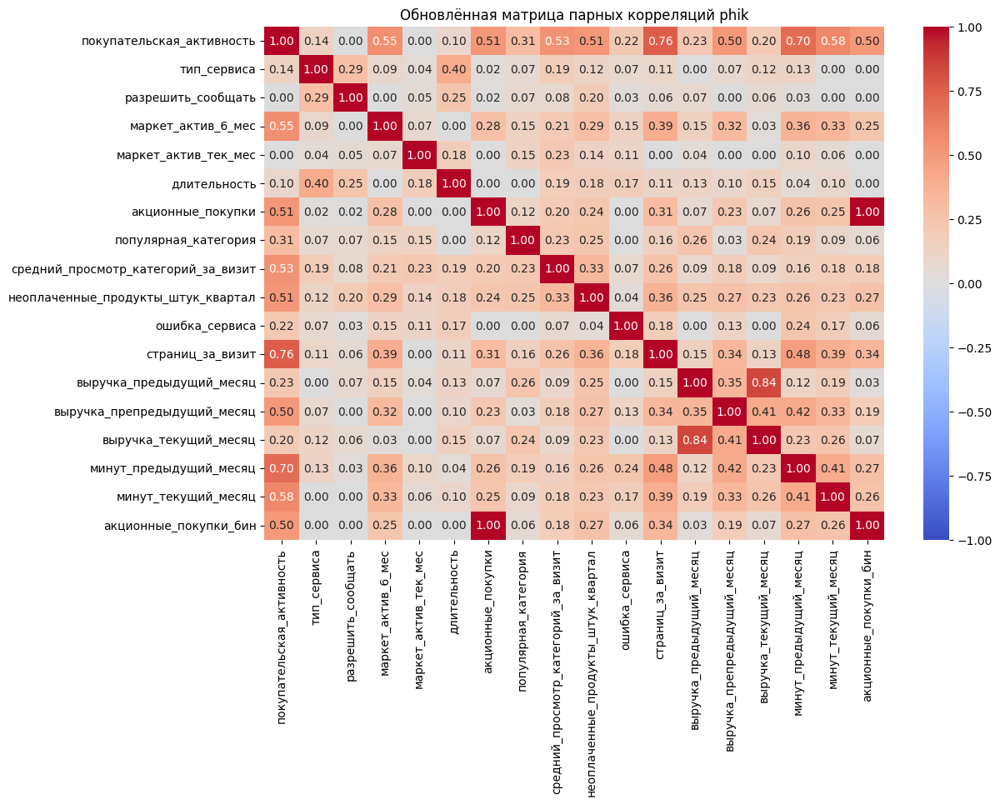

In [67]:
#создадим датафрейм corr_df_upd, в который войдут все обновлённые признаки исходного, кроме id
corr_df_upd = market_df.loc[:, market_df.columns != 'id']

#рассчитаем обновлённые коэффициенты корреляции между всеми признаками
sns.heatmap(corr_df_upd.phik_matrix(interval_cols=market_df_quant_cols),
            cmap='coolwarm',
            annot=True,
            vmin=-1,
            vmax=1,
            fmt='.2f').set(title='Обновлённая матрица парных корреляций phik');

Из матрицы заметно, что бинаризация признака `акционные_покупки` не привела к улучшению корреляции (коэффициент корреляции с целевым признаком 0.5 против 0.51 у исходного). Проверим, какое влияние оказывает новый признак внутри отдельных классов

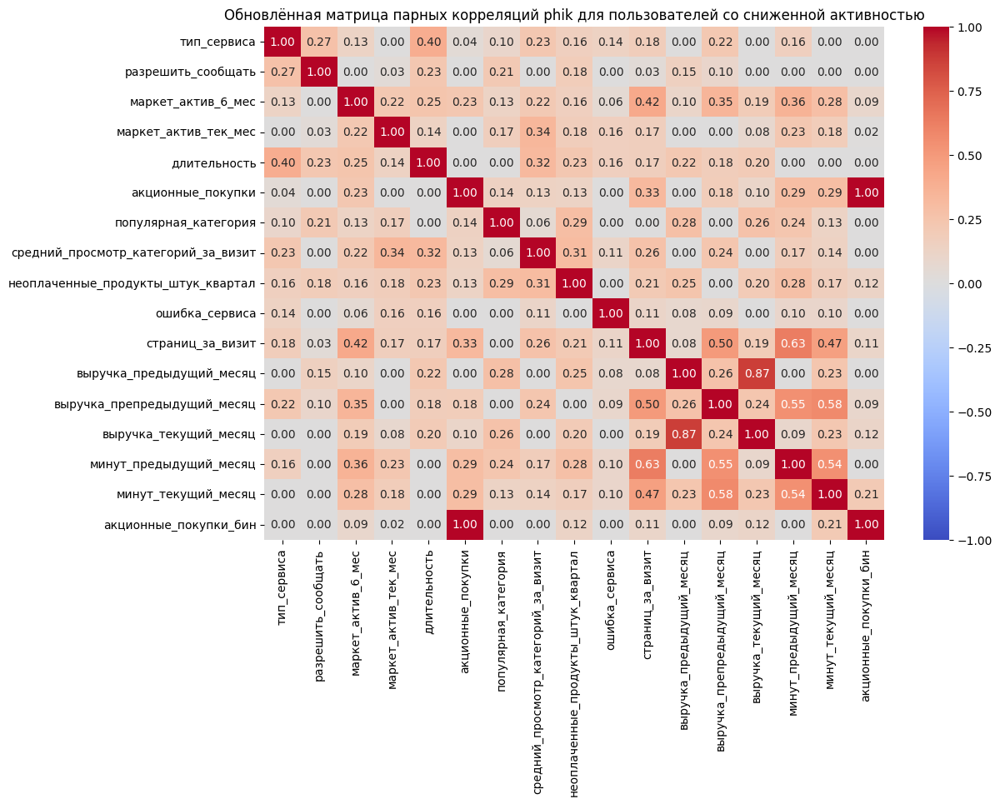

In [68]:
#рассчитаем обновлённые коэффициенты корреляции между всеми признаками
#для пользователей со сниженной активностью
sns.heatmap((corr_df_upd.query('покупательская_активность == "Снизилась"'))
                        .loc[:, corr_df_upd.columns != 'покупательская_активность']
                        .phik_matrix(interval_cols=market_df_quant_cols),
             cmap='coolwarm',
             annot=True,
             vmin=-1,
             vmax=1,
             fmt='.2f').set(title='Обновлённая матрица парных корреляций phik для пользователей со сниженной активностью');

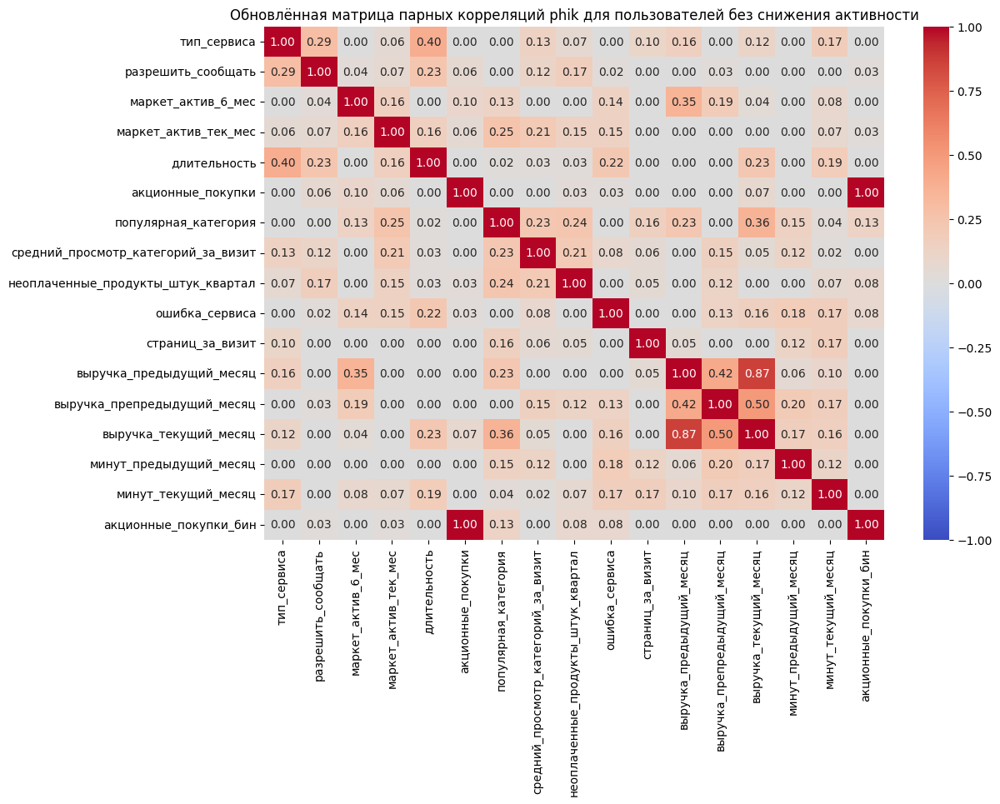

In [69]:
#рассчитаем обновлённые коэффициенты корреляции между всеми признаками
#для пользователей без снижения активности
sns.heatmap((corr_df_upd.query('покупательская_активность == "Прежний уровень"'))
                        .loc[:, corr_df_upd.columns != 'покупательская_активность']
                        .phik_matrix(interval_cols=market_df_quant_cols),
             cmap='coolwarm',
             annot=True,
             vmin=-1,
             vmax=1,
             fmt='.2f').set(title='Обновлённая матрица парных корреляций phik для пользователей без снижения активности');

Судя по обновлённым матрицам корреляций внутри индивидуальных классов, новый признак `акционные_покупки_бин` даёт слабые корреляции с остальными исходными признаками.
Таким образом, на основании обновлённых матриц корреляций можно сделать вывод, что введение данного признака  не приводит к добавлению более сильных связей с целевым признаком или исходными признаками

Таким образом, в данном разделе был проведён корреляционный анализ признаков в объединённом датафрейме `market_df`:
* **парные корреляции Спирмена количественных признаков** показали отсутствие мультиколлинеарности. Заметна высокая прямая связь между признаками `выручка_предыдущий_месяц` и `выручка_текущий_месяц` (0.88), а также умеренная связь между признаками `страниц_за_визит` и `минут_предыдущий_месяц` (0.45). Между остальными парами признаков связь слабая или очень слабая. Отмечаем здесь высокую корреляцию между выручками за 2 последних месяца - вероятно, пользовательская покупательская активность не сильно изменилась за этот период времени;
* **корреляционный анализ с помощью библиотеки phik** показал, что наиболее сильная связь с таргетом наблюдается у признаков `страниц_за_визит` (0.76) и `минут_предыдущий_месяц` (0.70);
* **корреляционный анализ отдельных классов с помощью библиотеки phik** показал, что самый большой коэффициент парной корреляции достигается для обоих классов в паре `выручка_предыдущий_месяц` и `выручка_текущий_месяц` (0.87); при этом для пользователей класса `Снизилась` существует гораздо больше корреляций пар признаков с коэффициентом корреляции не менее 0.5 - 6 против 2 у пользователей класса `Прежний уровень`;
* **добавление нового бинарного признака `акционные_покупки_бин`** не привело к усилению связей с таргетом и остальными признаками, если судить по матрицам корреляций `phik`;
* **утечки целевого признака также не наблюдается** - ни у одного из признаков нет корреляции, равной 1, с таргетом (за исключением признака `id`, который не будем включать в признаковое описание для обучения моделей)

## Использование пайплайнов

Для начала необходимо определиться с метрикой:
* `accuracy` не подойдёт, так как ранее мы установили, что таргет несбалансирован;
* `precision` и `recall` также не являются идеальными метриками в этой задаче. Да, они неплохо показывают себя в задачах с несбалансированными классами, однако нам нет надобности максимизировать какую-либо из метрик - нам важно научиться одинаково хорошо предсказывать как пользователей со снизившейся активностью, так и пользователей с постоянной активностью, чтобы одновременно разобраться с проблемой снижения активности и понимать закономерности поведения пользователей с постоянной активностью;
* `f-мера` является агрегированной метрикой `precision` и `recall`, однако нам точно неизвестно, должна ли какая-то из метрик являться доминирующей и если должна, то какая. Соответсвенно, конкретный вид формулы `f-меры` нам тоже неизвестен;
* хорошим вариантом мне видится использование метрики `AUC-ROC`. Она также хорошо себя показывает в случае несбалансированных классов, при этом позволяет оценить качество модели, не привязываясь к конкретному пороговому значению

Подготовим данные для обучения

In [70]:
#зададим необходимые константы
random_state = 42
test_size = 0.25

#выделим необходимое признаковое описание
X = market_df.drop(['id', 'покупательская_активность', 'акционные_покупки_бин'], axis=1)
y = market_df['покупательская_активность']

#разделим данные на тренировочную и тестовую выборку с учётом дисбаланса классов
#для проверки выведем размеры
X_train, X_test, y_train, y_test = train_test_split(
    X, 
    y,
    test_size = test_size,
    random_state = random_state,
    stratify = y)

X_train.shape, X_test.shape

((963, 16), (322, 16))

Разделение прошло успешно


In [71]:
#закодируем целевой признак с помощью LabelEncoder
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)
label_encoder.classes_

array(['Прежний уровень', 'Снизилась'], dtype=object)

Начнём собирать пайплайн. Сначала подготовим списки признаков, которые будут по-разному предобработаны

In [72]:
#создаём списки с названиями признаков
ohe_columns = [
    'разрешить_сообщать',
    'популярная_категория'
]

ord_columns = ['тип_сервиса']

num_columns = [
    'маркет_актив_6_мес', 
    'маркет_актив_тек_мес',
    'длительность', 
    'акционные_покупки', 
    'средний_просмотр_категорий_за_визит',
    'неоплаченные_продукты_штук_квартал', 
    'ошибка_сервиса', 
    'страниц_за_визит',
    'выручка_предыдущий_месяц', 
    'выручка_препредыдущий_месяц', 
    'выручка_текущий_месяц', 
    'минут_предыдущий_месяц', 
    'минут_текущий_месяц'
]

Создадим пайплайн. 

В качестве метрики ранее была выбрана ROC-AUC. Исходные данные были разделены на тренировочную и тестовую выборку с учётом дисбаланса классов. Таргет был закодирован с помощью LabelEncoder.

Исходные признаки были разделены на категориальные ранговые (`ord_columns`), категориальные номинальные (`ohe_columns`) и количественные (`num_columns`). Категориальные признаки предобработаем с помощью OneHotEncoder (номинальные признаки) и OrdinalEncoder (ранговые признаки) с заполнением пропусков с помощью SimpleImputer. Для количественных признаков исследуем маштабирование с помощью MinMaxScaler, StandardScaler, MaxAbsScaler, RobustScaler, а также предобработку без масштабирования.

Будем исследовать 4 модели машинного обучения:

* *KNeighborsClassifier*. Проварьируем количество ближайших соседей для нахождения баланса между сложностью модели и качеством;
* *DecisionTreeClassifier*. Проварьируем типы критерия (функции оценки качества разделения), максимальная глубина дерева, максимальное количество признаков, минимальное количество объектов в листе, минимальное количество объектов в разделяемом листе, максимальное количество узлов в листе для определения оптимальной структуры дерева;
* *LogisticRegression*. Проварьируем способы регуляризации, коэффициент регуляризации `C` и алгоритмы оптимизации для улучшения обобщающей способности модели;
* *SVC*. Проварьируем виды гиперплоскости, параметр `gamma` для нелинейных гиперплоскостей, а также коэффициент регуляризации `C` для построения оптимальной разделяющей поверхности.

Оптимизацию гиперпараметров будем проводить с помощью RandomizedSearchCV. Качество лучшей модели оценим с помощью метрики ROC-AUC на тренировочной и тестовой выборке. Также определим параметры и гиперпараметры лучшей модели


In [73]:
#создаём пайплайн для подготовки признаков из списка ohe_columns: заполнение пропусков и OHE-кодирование
#SimpleImputer + OHE
ohe_pipe = Pipeline(
    [
        ('simpleImputer_ohe', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
        ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))
    ]
)

#создаём пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование
#SimpleImputer + OE
ord_pipe = Pipeline(
    [
        ('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
        ('ord', OrdinalEncoder(
                    categories=[
                        ['стандарт', 'премиум'],
                    ],
                    handle_unknown='use_encoded_value', unknown_value=np.nan
        )),
        ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
    ]
)

#создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [('ohe', ohe_pipe, ohe_columns),
     ('ord', ord_pipe, ord_columns),
     ('num', MinMaxScaler(), num_columns)
    ],
    remainder='passthrough'
)

#создаём итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('models', DecisionTreeClassifier(random_state=random_state))
    ]
)

param_grid = [
    #словарь для модели KNeighborsClassifier()
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(1, 10),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), MaxAbsScaler(), RobustScaler(), 'passthrough']
    },
    
    #словарь для модели DecisionTreeClassifier()
    {
        'models': [DecisionTreeClassifier(random_state=random_state)],
        'models__criterion': ['gini', 'entropy'],
        'models__max_depth': range(1, 10),
        'models__max_features': range(1, 10),
        'models__min_samples_leaf': range(1, 5),
        'models__min_samples_split': range(2, 10),
        'models__max_leaf_nodes': range(2, 10),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), MaxAbsScaler(), RobustScaler(), 'passthrough']
    },
    
    #словарь для модели LogisticRegression()
    {
        'models': [LogisticRegression(random_state=random_state)],
        'models__penalty' : ['l1', 'l2'],
        'models__C': np.logspace(-4, 4, 10),
        'models__solver' : ['lbfgs', 'liblinear'],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), MaxAbsScaler(), RobustScaler(), 'passthrough']
        
    },
    
    #словарь для модели SVC()
    {
        'models': [SVC(probability=True, random_state=random_state)],
        'models__kernel': ['linear', 'rbf'], 
        'models__C': [0.1, 1, 10, 100, 1000],
        'models__gamma': [1, 0.1, 0.01, 0.001, 0.0001],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), MaxAbsScaler(), RobustScaler(), 'passthrough']   
    }
]

randomized_search = RandomizedSearchCV(
    pipe_final,
    param_grid,
    scoring='roc_auc',
    n_jobs=-1,
    cv=5,
    n_iter=1000,
    random_state=random_state
)
randomized_search.fit(X_train, y_train_encoded)

#проверяем работу модели на тренировочной выборке
print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print('Метрика лучшей модели на тренировочной выборке:', randomized_search.best_score_)

#проверяем качество модели на тестовой выборке
y_test_pred = randomized_search.predict_proba(X_test)[:, 1]
print(f'Метрика ROC-AUC на тестовой выборке: {roc_auc_score(y_test_encoded, y_test_pred)}')

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['разрешить_сообщать',
                                                   'популярная_категория']),
                                                 ('ord',
                                 

Получили значение метрики ROC-AUC на тренировочной выборке 0.9023, на тестовой - 0.9181. Значения метрик достаточно высокие, при этом модель не переобучена (значение метрики на тестовых данных не только не упало, но и выросло) и не недообучена (значение метрики на тренировочных данных достаточно высокое)

In [74]:
#получим все параметры лучшей модели
randomized_search.best_params_

{'preprocessor__num': MinMaxScaler(),
 'models__solver': 'liblinear',
 'models__penalty': 'l2',
 'models__C': 0.3593813663804626,
 'models': LogisticRegression(random_state=42)}

Таким образом, лучшей моделью на наших данных является логистическая регрессия с параметрами и гиперпараметрами:
* *метод масштабирования количественных признаков:* MinMaxScaler();
* *solver:* 'liblinear';
* *penalty:* 'l2';
* *C:*  0.3593813663804626

Таким образом, в этом разделе мы использовали пайплайн для обучения моделей машинного обучения на имеющихся данных.

В качестве метрики была выбрана ROC-AUC. Исходные данные были разделены на тренировочную и тестовую выборку с учётом дисбаланса классов. Таргет был закодирован с помощью LabelEncoder.

Исходные признаки были разделены на категориальные (ранговые и номинальные) и количественные признаки. Категориальные признаки были предобработаны с помощью OneHotEncoder (номинальные признаки) и OrdinalEncoder (ранговые признаки) с заполнением пропусков с помощью SimpleImputer. Для количественных признаков исследовалось маштабирование с помощью MinMaxScaler, StandardScaler, MaxAbsScaler, RobustScaler, а также без масштабирования.

Были исследованы 4 модели машинного обучения:

* *KNeighborsClassifier*. Было проварьировано количество ближайших соседей для нахождения баланса между сложностью модели и качеством;
* *DecisionTreeClassifier*. Были проварьированы типы критерия (функции оценки качества разделения), максимальная глубина дерева, максимальное количество признаков, минимальное количество объектов в листе, минимальное количество объектов в разделяемом листе, максимальное количество узлов в листе для определения оптимальной структуры дерева;
* *LogisticRegression*. Были проварьированы способы регуляризации, коэффициент регуляризации `C` и алгоритмы оптимизации для улучшения обобщающей способности модели;
* *SVC*. Были проварьированы виды гиперплоскости, параметр `gamma` для нелинейных гиперплоскостей, а также коэффициент регуляризации `C` для построения оптимальной разделяющей поверхности.

Оптимизацию гиперпараметров проводили с помощью RandomizedSearchCV. Качество лучшей модели оценивали с помощью метрики ROC-AUC на тренировочной и тестовой выборке. Также определили параметры и гиперпараметры лучшей модели.

Наилучшие результаты (значение метрики ROC-AUC на тренировочной выборке 0.9023, на тестовой - 0.9181) были достигнуты при использовании логистической регрессии с гиперапараметрами 
* *solver:* 'liblinear';
* *penalty:* 'l2';
* *C:*  0.3593813663804626,

а также при использовании MinMaxScaler для масштабировании количественных признаков.

## Анализ важности признаков

Оценим важность признаков для нашей лучшей модели разными способами

### Коэффициенты значимости модели

На прошлом шаге было установлено, что лучше всего на наших данных показала себя модель логистической регрессии. Мы можем первоначально визуализировать важность признаков с помощью встроенных инструментов

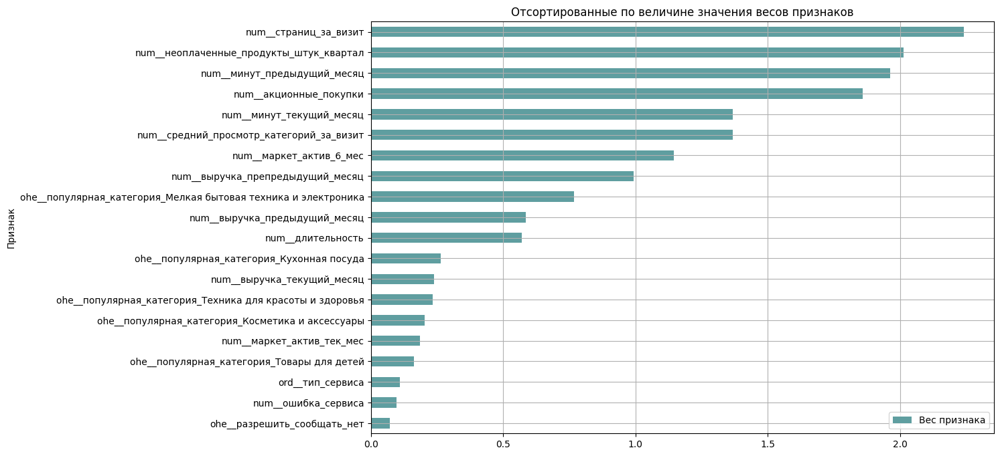

In [75]:
#выберем лучший пайплайн по итогам обучения
best_pipeline = randomized_search.best_estimator_

#выберем лучший классификатор из пайплайна
best_clf = best_pipeline[-1]

#получим веса признаков и покажем их на горизонтальной столбчатой диаграмме
coeffs_best_clf = best_clf.coef_[0]
feature_importance = pd.DataFrame({'Признак': best_pipeline[:-1].get_feature_names_out(), 
                                   'Вес признака': np.abs(coeffs_best_clf)})
feature_importance = feature_importance.sort_values(by='Вес признака', ascending=True)
feature_importance.plot(x='Признак', 
                        y='Вес признака', 
                        kind='barh',
                        grid=True,
                        title='Отсортированные по величине значения весов признаков',
                        color='cadetblue');


Судя по весам, наиболее значимым признаком является среднее количество просмотренных страниц за визит. Затем очень похожие веса имеют:
* число неоплаченных товаров в корзине; 
* число минут, проведённое на сайте за предыдущий месяц; 
* а также доля покупок по акции от общего числа.

Веса остальных признаков существенно меньше

### Проверка permutation importance

Посмотрим теперь на "перестановочную важность" признаков с помощью метода `permutation_importance`

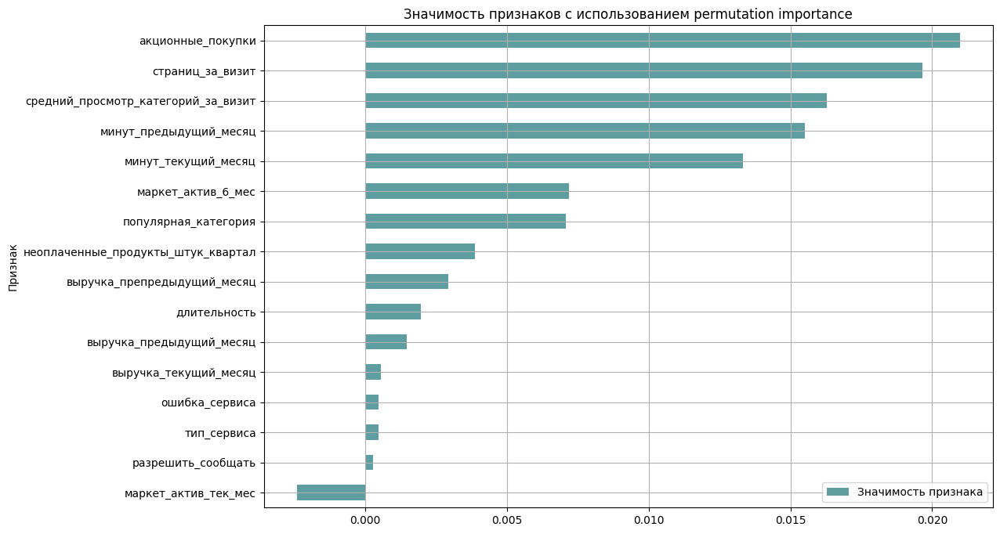

In [76]:
#сохраним результат работы метода permutation_importance
result = permutation_importance(best_pipeline, 
                                X_test, 
                                y_test_encoded, 
                                scoring='roc_auc',
                                random_state=random_state)

#получим значимости признаков и выведем их на горизонтальной столбчатой диаграмме
feature_importance_perm = pd.DataFrame({'Признак': X_train.columns, 
                                        'Значимость признака': result['importances_mean']})
feature_importance_perm = feature_importance_perm.sort_values(by='Значимость признака', ascending=True)
feature_importance_perm.plot(x='Признак', 
                             y='Значимость признака', 
                             kind='barh',
                             grid=True,
                             title='Значимость признаков с использованием permutation importance',
                             color='cadetblue');

По методу перестановочной важности наиболее значимыми признаками оказались:
* *акционные_покупки* - самый важный признак (был 4 по важности, ориентируясь на веса признаков);
* *страниц_за_визит* - 2 по важности признак (был самым важным, ориентируясь на веса признаков);
* *средний_просмотр_категорий_за_визит* - 3 по важности признак (был 6 по важности, ориентируясь на веса признаков); 
* *минут_предыдущий_месяц* - 4 по важности признак (был 3 по важности, ориентируясь на веса признаков);
* *минут_текущий_месяц* - 5 по важности признак (был 5 по важности, ориентируясь на веса признаков)

Таким образом, можно отметить, что два использованных метода оценки важности признаков достаточно близко определяют наиболее важные признаки: 5 самых важных признаков по методу `permutation importance` присутствовали в топ-6 самых признаков с учётом их весов. Занятно, что признак `неоплаченные_продукты_штук_квартал`, который был 2 по значимости на предыдущем шаге, по методу перестановочной значимости оказался всего лишь 9 по значимости

### Анализ SHAP-значений

Воспользуемся библиотекой SHAP для более детального изучения влияния признаков

In [77]:
#выделим объект preprocessor для предобработки признакового описания
preprocessor = best_pipeline['preprocessor']
X_train_transformed = preprocessor.transform(X_train)
X_test_transformed = preprocessor.transform(X_test)
X_test_df = pd.DataFrame(X_test_transformed,
                         columns=best_pipeline[:-1].get_feature_names_out())

#передадим объекту explainer данные модели
explainer = shap.LinearExplainer(best_clf, X_train_transformed)
shap_values = explainer(X_test_df)

#### Bar plot

Построим столбчатую диаграмму, отражающую результаты усреднения SHAP-значений для всех признаков

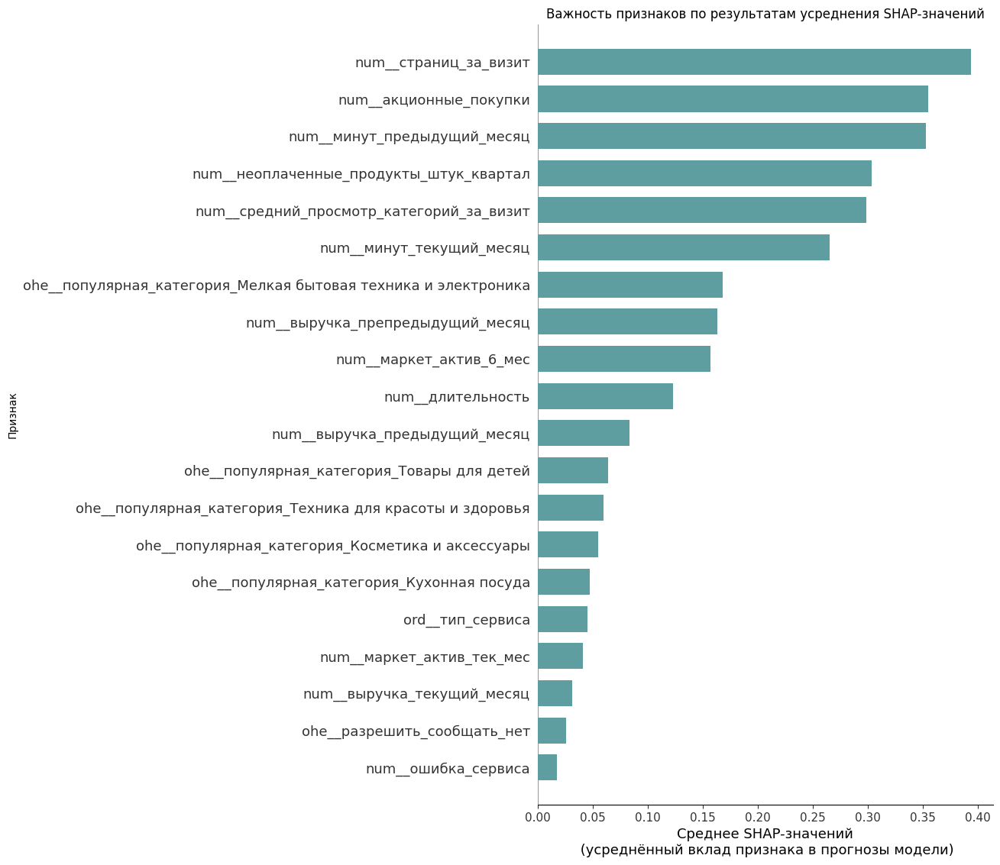

In [78]:
shap.summary_plot(shap_values, 
                  features=X_test_df,  
                  feature_names=best_pipeline[:-1].get_feature_names_out(),
                  show=False,
                  plot_type='bar', 
                  plot_size=(13, 11),
                  color='cadetblue')

fig = plt.gcf()
ax = plt.gca()   

ax.set_xlabel('Среднее SHAP-значений\n (усреднённый вклад признака в прогнозы модели)')
ax.set_ylabel('Признак')
ax.set_title('Важность признаков по результатам усреднения SHAP-значений');


SHAP выделяет следующие наиболее важные признаки:
* страниц_за_визит;
* акционные_покупки;
* минут_предыдущий_месяц;
* неоплаченные_продукты_штук_квартал;
* средний_просмотр_категорий_за_визит;
* минут_текущий_месяц

Если подвести промежуточный итог и составить таблицу по признакам,
которые выбирались наиболее важными тремя использованнными методами, и их местам в общем рейтинге,  получится следующий результат:

| Признак\Метод                            | Веса      | permutation_importance      | SHAP   | Сумма мест | Среднее значение |
|:----------------------------------------:|:---------:| :--------------------------:|:------:|:----------:|:----------------:|
| страниц_за_визит                         | 1         | 2                           | 1      |  4         |1.33              |
| акционные_покупки                        | 4         | 1                           | 2      |  7         |2.33              |
| минут_предыдущий_месяц                   | 3         | 4                           | 3      | 10         |3.33              |
| неоплаченные_продукты_штук_квартал       | 2         | 9                           | 4      | 15         |5                 | 
| средний_просмотр_категорий_за_визит      | 6         | 3                           | 5      | 14         |4.67              |
| минут_текущий_месяц                      | 5         | 5                           | 6      | 16         |5.33              |


По результатам таблицы можно сделать следующие выводы:
* топ-6 самых важных признаков практически неизменен. Лишь в случае `permutation_importance` признак `неоплаченные_продукты_штук_квартал` "выпал" из топ-6 на 9 место. Его место занял признак `маркет_актив_6_мес`, которого не было в топ-6 при анализе весов и с помощью SHAP. Поэтому можно утверждать, что набор самых важных признаков стабилен и не зависит от выбора модели анализа;
* в 2 из 3 случаев (анализ весов и SHAP) самым важным признаком оказалось среднее количество посещаемых пользователем страниц;
* при анализе с помощью `permutation_importance` наиболее важным оказался признак `акционные_покупки`, который в двух других случаях был 2 и 4 по важности соответственно.

Проанализируем также самые топ-5 самых незначимых признаков для метода SHAP (будем обсчитывать место с конца, так как в разных случаях было разное количество признаков):

| Признак\Метод                       | Веса      | permutation_importance      | SHAP   | Сумма мест | Среднее значение |
|:-----------------------------------:|:---------:| :--------------------------:|:------:|:----------:|:----------------:|
|ошибка_сервиса                       |   2       |               4             | 1      |  7         |2.33              |
|разрешить_сообщать_нет               |   1       |               2             | 2      |  5         |1.67              |
|выручка_текущий_месяц                |   8       |               3             | 3      | 14         |4.67              |
|маркет_актив_тек_мес                 |   5       |               1             | 4      | 10         |3.33              | 
|тип_сервиса                          |   3       |               6             | 5      | 14         |4.67              |


Можно отметить следующие особенности:
* практически всегда указанные в таблице признаки находятся в топ-5 самых незначимых при анализе тремя разными методами (исключение составляют `выручка_текущий_месяц` и 8 с конца место при анализе весов, а также `тип_сервиса` и 6 место при анализе permutation importance; однако при визуальном анализе можно установить, что значимость этих признаков всё равно невелика);
* признак `разрешить_сообщать_нет` входил в топ-2 самых незначимых признаков при анализе тремя разными методами

#### Beeswarm plot

Изучим теперь закономерности между признаками и прогнозами модели

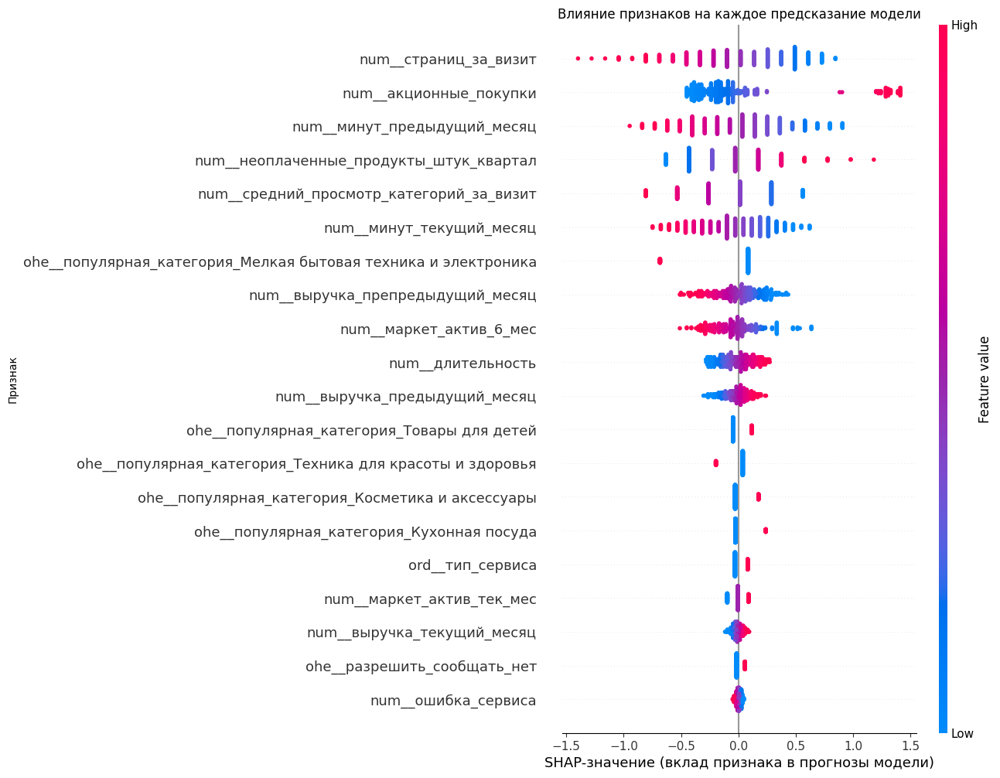

In [79]:
shap.summary_plot(shap_values, 
                  features=X_test_df,  
                  feature_names=best_pipeline[:-1].get_feature_names_out(),
                  show=False, 
                  plot_size=(13, 10))
fig = plt.gcf()
ax = plt.gca()   

ax.set_xlabel('SHAP-значение (вклад признака в прогнозы модели)')
ax.set_ylabel('Признак')
ax.set_title('Влияние признаков на каждое предсказание модели')

plt.show()

Посмотрим на выделенный ранее топ-6 самых важных признаков (вспомним также, что к классу 1 у нас относятся пользователи со сниженной активностью, к классу 0 - с постоянной активностью):
* *страниц_за_визит*: более высокое значение признака увеличивает уверенность классификатора в присвоении класса 0. Звучит логично - обычно чем больше страниц просмотришь, тем с большей вероятностью совершишь покупку;
* *акционные_покупки*: более высокое значение признака увеличивает уверенность классификатора в присвоении класса 1. Вполне согласуется с базовой логикой - если пользователь часто покупает товары по акции, это значит, что он не является постоянным покупателем магазина и с большой долей вероятности уйдёт;
* *минут_предыдущий_месяц*: более высокое значение признака увеличивает уверенность классификатора в присвоении класса 0. Ситуация похожая на признак `страниц_за_визит` - чем больше времени в среднем пользователь проводит на сайте, тем больше вероятность, что он будет что-то покупать;
* *неоплаченные_продукты_штук_квартал*: более высокое значение признака увеличивает уверенность классификатора в присвоении класса 1. Вполне понятно - чем больше товаров хранится у пользователя в корзине в течение 3 месяцев, тем больше вероятность, что он про них забыл и в целом перестал покупать на данной платформе;
* *средний_просмотр_категорий_за_визит*: более высокое значение признака увеличивает уверенность классификатора в присвоении класса 0. Ситуация аналогична признаку `страниц_за_визит`;
* *минут_текущий_месяц*: более высокое значение признака увеличивает уверенность классификатора в присвоении класса 0. Ситуация аналогична признаку `минут_предыдущий_месяц`

Кроме этого, можно отметить ещё несколько закономерностей:
* Интересно проанализировать влияние самой популярной категории покупок на таргет. Для пользователей, у которых наиболее популярная категория - мелкая бытовая техника/электроника (гораздо более значимый признак из группы популярных категорий, судя по предыдущему разделу) или техника для красоты и здоровья - классификатор предсказывает отсутствие снижения покупательской активности с увеличением значения признака. Для тех пользователей, у которых популярная категория - товары для детей, косметика и аксессуары или кухонная посуда - классификатор предсказывает снижение покупательской активности с увеличением значения признака. Можно предположить, что ключевое влияние здесь оказывает цена товара - пользователи, которые часто покупают дорогую продукцию (как в первом случае), имеют доверие к платформе и с большой долей вероятности останутся постоянными пользователями онлайн-магазина. В случае же, если у пользователя популярная категория характеризуется более дешёвыми товарами (как во втором случае), можно предположить, что большого доверия к платформе он может не иметь и покупать на ней будет от случая к случаю;
* признаки `выручка_препредыдущий_месяц` (8 по значимости) и `выручка_предыдущий месяц` (11 по значимости) оказывают противоположное влияние на таргет: увеличение значения первого признака повышает вероятность присвоения класса 0 (нет снижения активности), увеличение значения второго - повышает вероятность класса 1 (есть снижение активности). Первый факт кажется вполне логичным (чем больше пользователь потратил в одном из недавних месяцев, тем больше вероятность, что он потратит много и в дальнейшем), а вот второй кажется спорным. Можно предположить, что в предыдущем месяце были дополнительное стимулирование акциями. Либо же просто это малое влияние не самого значимого признака;
* маркетинговые коммуникации компании положительно влияют на лояльность покупателей к сайту - увеличение значения признака `маркет_актив_6_мес` приводит к увеличению уверенности классификатора в присвоении пользователю класса 0. Однако маркетинговые коммуникации последнего месяца (`маркет_актив_тек_мес`) - один из наименее важных признаков. Возможно, в текущем месяце что-то сломалось в механизмах взаимодействия с клиентами;
* анализ признака `длительность` показывает, что увеличение срока пребывания на сайте может привести к снижению покупательской активности. Конечно, этот признак имеет не очень большую значимость, однако, возможно, стоит повышать лояльность наиболее долго зарегистрированных клиентов

#### waterfall

Посмотрим на отдельные примеры неверно классифицированных объектов

In [80]:
#сначала выберем наблюдения, где истинное значение таргета равно 1,
#а вероятность принадлежности к классу 1 была оценена ниже 0.1
X_test_df['y_test'] = y_test_encoded.tolist()
X_test_df['predict_proba'] = best_clf.predict_proba(X_test_transformed)[:,1]
X_test_df[(X_test_df['y_test'] == 1) & (X_test_df['predict_proba'] < 0.1)]

,ohe__разрешить_сообщать_нет,ohe__популярная_категория_Косметика и аксессуары,ohe__популярная_категория_Кухонная посуда,ohe__популярная_категория_Мелкая бытовая техника и электроника,ohe__популярная_категория_Техника для красоты и здоровья,ohe__популярная_категория_Товары для детей,ord__тип_сервиса,num__маркет_актив_6_мес,num__маркет_актив_тек_мес,num__длительность,...,num__неоплаченные_продукты_штук_квартал,num__ошибка_сервиса,num__страниц_за_визит,num__выручка_предыдущий_месяц,num__выручка_препредыдущий_месяц,num__выручка_текущий_месяц,num__минут_предыдущий_месяц,num__минут_текущий_месяц,y_test,predict_proba
18,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.807018,0.5,0.607516,...,0.1,0.333333,0.315789,0.135193,0.158466,0.316404,0.722222,0.368421,1,0.097035
184,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.649123,0.5,0.058455,...,0.2,0.777778,0.684211,0.529966,0.623003,0.482869,0.666667,0.842105,1,0.054598
190,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.754386,0.0,0.490605,...,0.1,0.444444,0.842105,0.762030,0.217891,0.908505,0.555556,0.473684,1,0.093799
281,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.684211,0.5,0.301670,...,0.2,0.777778,0.421053,0.761151,0.706709,0.529728,0.500000,0.789474,1,0.053555


Всего 4 таких объекта. Оценим вклад каждого признака для всех 4 наблюдений:

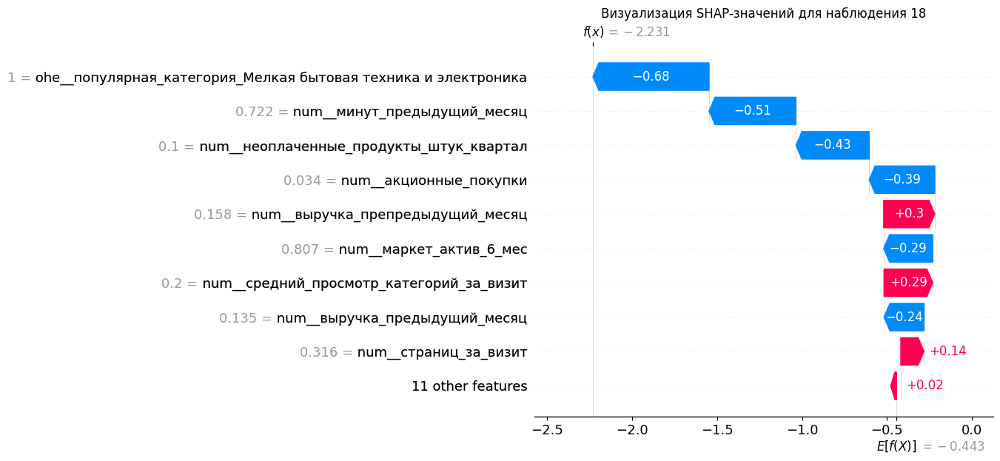

In [81]:
plt.title('Визуализация SHAP-значений для наблюдения 18')
shap.plots.waterfall(shap_values[18]) 

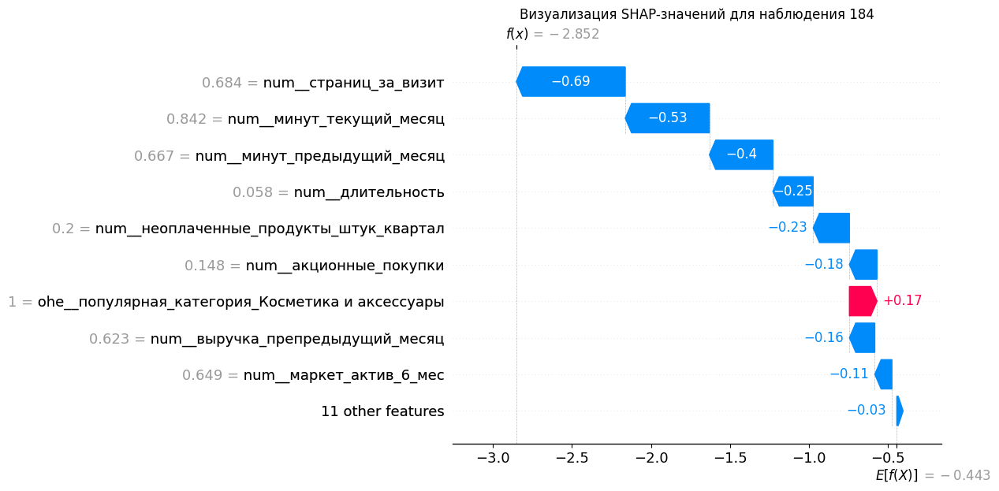

In [82]:
plt.title('Визуализация SHAP-значений для наблюдения 184')
shap.plots.waterfall(shap_values[184]) 

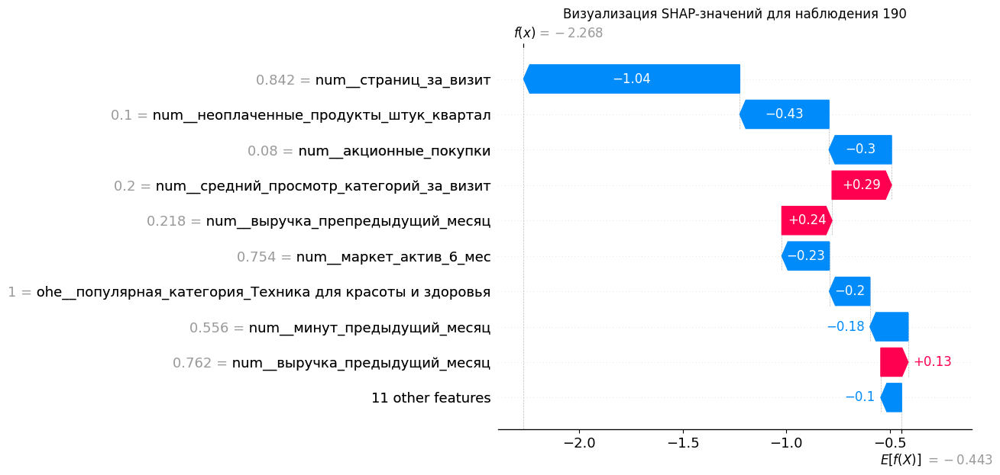

In [83]:
plt.title('Визуализация SHAP-значений для наблюдения 190')
shap.plots.waterfall(shap_values[190]) 

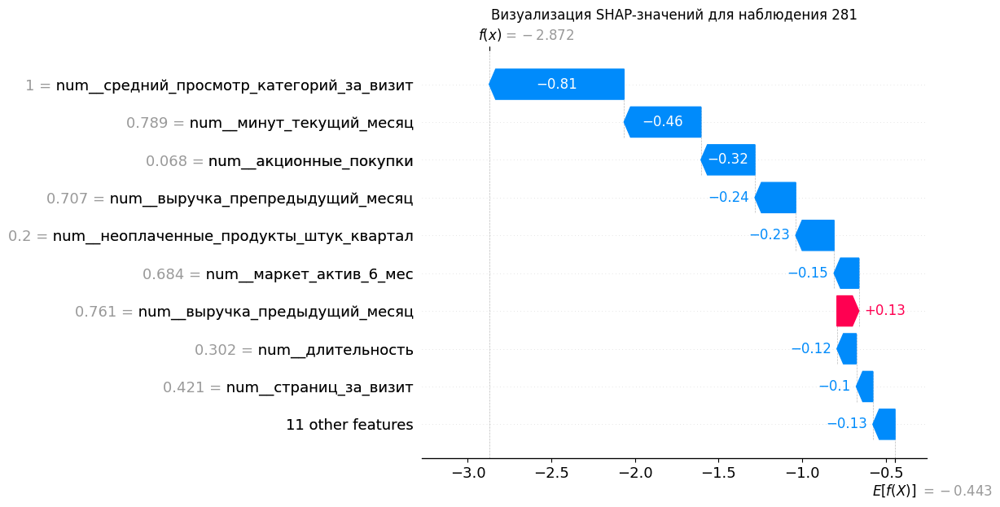

In [84]:
plt.title('Визуализация SHAP-значений для наблюдения 281')
shap.plots.waterfall(shap_values[281]) 

Можно отметить, что во всех этих случаях модель была очень уверена в классификации объектов - подавляющее количество признаков склоняло классификатор к ошибочному выбору класса 0

Посмотрим также, сколько раз модель неверно предсказала класс 1

In [85]:
#выберем наблюдения, где истинное значение таргета равно 0,
#а вероятность принадлежности к классу 1 была оценена выше 0.7
X_test_df[(X_test_df['y_test'] == 0) & (X_test_df['predict_proba'] > 0.7)]

,ohe__разрешить_сообщать_нет,ohe__популярная_категория_Косметика и аксессуары,ohe__популярная_категория_Кухонная посуда,ohe__популярная_категория_Мелкая бытовая техника и электроника,ohe__популярная_категория_Техника для красоты и здоровья,ohe__популярная_категория_Товары для детей,ord__тип_сервиса,num__маркет_актив_6_мес,num__маркет_актив_тек_мес,num__длительность,...,num__неоплаченные_продукты_штук_квартал,num__ошибка_сервиса,num__страниц_за_визит,num__выручка_предыдущий_месяц,num__выручка_препредыдущий_месяц,num__выручка_текущий_месяц,num__минут_предыдущий_месяц,num__минут_текущий_месяц,y_test,predict_proba
238,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.263158,0.5,0.913361,...,0.4,0.555556,0.263158,0.692172,0.486901,0.733172,0.277778,0.526316,0,0.747276


Всего один такой объект. Оценим вклад каждого признака:

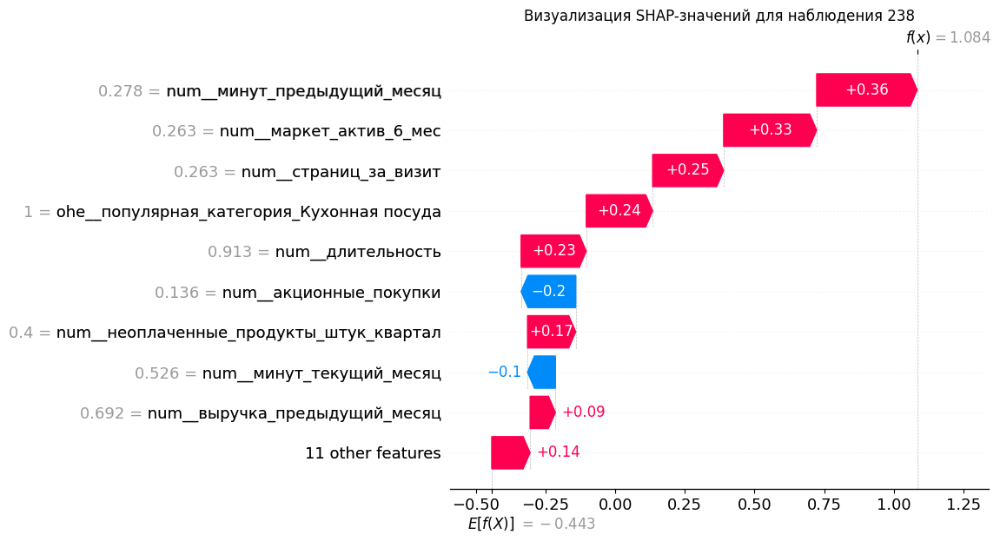

In [86]:
plt.title('Визуализация SHAP-значений для наблюдения 238')
shap.plots.waterfall(shap_values[238]) 

Ситуация аналогична предыдущему шагу - подавляющее большинство признаков склоняли модель к ошибочной классификации, нет какого-то одного признака, который бы оказал ключевое ошибочное влияние

### Выводы о значимости признаков

1. В рамках данного раздела для анализа важности признаков использовались 3 метода: анализ весов признаков, permutation importance и SHAP. С помощью этих методов было установлено, что наименее важными признаками являются:

    * `разрешить_сообщать`: информация о том, можно ли присылать покупателю дополнительные предложения о товаре;
    * `ошибка_сервиса`: число сбоев, которые коснулись покупателя во время посещения сайта;
    * `маркет_актив_тек_мес`: количество маркетинговых коммуникаций в текущем месяце;
    * `выручка_текущий_месяц`: сумма выручки за текущий месяц;
    * `тип_сервиса`: уровень сервиса, например «премиум» и «стандарт».
    
    
2. Также было определено, что наиболее важными признаками являются:

    * `страниц_за_визит`: среднее количество страниц, которые просмотрел покупатель за один визит на сайт за последние 3 месяца;
    * `акционные_покупки`: среднемесячная доля покупок по акции от общего числа покупок за последние 6 месяцев;
    * `минут_предыдущий_месяц`: значение времени, проведённого на сайте в прошлом месяце, в минутах;
    * `неоплаченные_продукты_штук_квартал`: общее число неоплаченных товаров в корзине за последние 3 месяца;
    * `средний_просмотр_категорий_за_визит`: показывает, сколько в среднем категорий покупатель просмотрел за визит в течение последнего месяца;
    * `минут_текущий_месяц`: значение времени, проведённого на сайте в текущем месяце, в минутах;
    
    
3. Исходя из этих данных, можно предложить следующие идеи:

    * Очень важно работать над улучшением удержания клиента при использовании интернет-магазина. 4 из 6 наиболее значимых признака (среднее число посещённых страниц; количество минут, проведённое на сайте в текущем и прошлом месяцах; количество просмотрённых категорий за визит), положительно влияющих на сохранение покупательской способности клиента, напрямую связаны с длительностью пребывания пользователя на сайте;
    * при этом надо разобраться с маркетинговыми коммуникациями. Более плотное взаимодействие с клиентами в течение последних 6 месяцев повышало шансы сохранить его покупательскую активность (хотя этот признак был средним по важности). В последний же месяц что-то сломалось, и практически никакого влияния на лояльность клиента к сервису маркетинговые коммуникации не оказывали. Возможно, дело как раз в этом - может быть, рекомендации стали слишком назойливыми. В любом случае, с этим надо разобраться;
    * при этом нужно понять, почему в целом не работают дополнительные взаимодействия с клиентами - признак, отвечающий за отсутствие или наличие дополнительных взаимодействий с клиентом (`разрешить_сообщать`), вообще никак не помогает сохранить покупательскую активность. С этим тоже необходимо разобраться - возможно,  акционные предложения недостаточно привлекательны, не учитывают интересы покупателя или, наоборот, слишком назойливы;
    * особое внимание нужно уделить клиентам, совершающим много акционных покупок. С учётом того, что это постоянные клиенты, стоит большее внимание уделить товарам, которые они приобретают по акциям; вероятно, недостаточно хорошо работают персонализированные предложения;
    * достаточно странно, что на покупательскую активность никак не влияет тип сервиса пользователя. Как мне кажется, пользователи с премиум-подпиской должны существенно меньше быть склонны к снижению покупательской активности, чем обычные покупатели - всё-таки покупка премиум-подписки (какая бы она ни была) - это существенный индикатор лояльности к сервису. Однако по разным методам анализа тип сервиса - один из самых мало значащих признаков. Надо разобраться, что с этим не так, возможно, имеющиеся плюсы улучшенного сервиса в последнее время уже не так привлекательны;
    * также нужно попробовать разобраться с проблемой избыточного количества товаров в корзине. Люди, имеющие большое количество неоплаченных покупок в корзине, гораздо более склонны к снижению покупательской активности. Возможно, клиент просто запутывается в большом количестве товаров, теряется и из-за этого ничего не покупает. Как один из возможных вариантов решения, стоит проработать механизмы сравнения похожих товаров в корзине (если таковые имеются) по ключевым характеристикам;
    * стоит также отметить, что признаки, отвечающие за наиболее популярную категорию, оказывают не самое большое влияние на покупательскую активность клиента. Наиболее значимый признак - если популярная категория касается мелкой бытовой техники и электроники. Звучит логично - это наиболее дорогая категория товаров для покупки в интернет-магазине, соответственно, пользователь имеет определённый кредит доверия к платформе;
    * имеет смысл задуматься о расширении признакового описания. Можно добавить следующие признаки, например, возраст клиента и пол (половозрастной анализ покупательской активности пользователя), количество детей, количество покупок клиента за период времени (для более плотного исследование в связке с прибылью и выручкой), показатели конверсии сайта (CTR, CPM, CR и другие) для анализа конверсии просмотров в заказы, доля взаимодействий с маркетинговыми активностями (доля переходов по ссылкам/ответов на звонки/открытий рекламных баннеров и тд), частота использования премиум-пользователями преимуществ подписки (если это возможно выразить количественными характеристиками; также в целом не помешает собрать информацию, какие преимущества есть у премиум-пользователей в сравнении с обычными)

## Сегментация покупателей

In [87]:
#создадим функцию для отрисовки диаграмм рассеяния
def scatterplots(df, x_feature, y_feature, cat_feature):
    #df - датафрейм
    #x_feature, y_feature - основные признаки для диаграммы рассеяния
    #cat_feature - категориальный признак
    
    #отрисовка диаграммы рассеяния
    sns.scatterplot(data=df,
                    x=x_feature,
                    y=y_feature,
                    hue=cat_feature,
                    palette='pastel').set(title=f'Диаграмма рассеяния для признаков\n {x_feature} и {y_feature}\n'
                                                 f'с учётом значения признака {cat_feature}')

In [88]:
#создадим функцию для отрисовки диаграмм рассеяния и столбчатых диаграмм
def scatter_and_bar(df, x_feature, y_feature, cat_feature):
    #df - датафрейм
    #x_feature, y_feature - основные признаки
    #cat_feature - категориальный признак

    #задаём параметры графиков
    fig, ax = plt.subplots(2, figsize=(12, 16))
    
    #отрисовка диаграммы рассеяния
    sns.scatterplot(data=df,
                    x=x_feature,
                    y=y_feature,
                    hue=cat_feature,
                    palette='pastel',
                    ax=ax[0]).set(title=f'Диаграмма рассеяния для признаков\n {x_feature} и {y_feature}\n'
                                        f'с учётом значения признака {cat_feature}')
    
    #отрисовка столбчатой диаграммы и коррекция подписей
    sns.countplot(data=df,
                  x=cat_feature,
                  hue=cat_feature,
                  legend=False,
                  palette='pastel',
                  ax=ax[1]).set(title=f'Распределение признака\n{cat_feature}', 
                                ylabel='Количество пользователей')
    
    wrap_labels(ax[1], 10)

In [89]:
#создадим функцию для отрисовки боксплотов
def boxplot(df, x_feature, y_feature, cat_feature):
    #df - датафрейм
    #x_feature, y_feature - основные признаки для диаграммы рассеяния
    #cat_feature - категориальный признак

    #отрисовка боксплота
    sns.catplot(data=df,
                x=x_feature,
                y=y_feature,
                hue=cat_feature,
                kind='box',
                palette='pastel').set_xticklabels(rotation=90)
    
    plt.suptitle(f'Боксплот для признаков\n {x_feature} и {y_feature}\n'
                 f'для покупателей из различных групп', y=1.1)

### Объединение датафреймов и выделение сегмента

Сначала для каждой из имеющихся у нас выборок получим вероятности принадлежности к классу 1 (покупательская активность снизилась), после чего объединим выборки в один датафрейм `X_concat`

In [90]:
X_train['вероятность_снижения_покупательской_активности'] = randomized_search.predict_proba(X_train)[:, 1]
X_test['вероятность_снижения_покупательской_активности'] = randomized_search.predict_proba(X_test)[:, 1]
X_concat = pd.concat([X_train, X_test])
X_concat.head(10)

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,вероятность_снижения_покупательской_активности
1156,стандарт,да,3.3,4,482,0.20,Товары для детей,4,2,5,11,5015.0,5175.0,5284.100098,19,11,0.113187
1119,стандарт,да,4.1,3,564,0.28,Мелкая бытовая техника и электроника,3,0,4,9,4994.0,5267.0,4887.399902,17,17,0.039072
298,стандарт,нет,2.9,3,657,0.24,Товары для детей,4,0,3,4,4918.0,4636.0,4804.899902,8,9,0.570762
620,стандарт,да,4.9,5,574,0.28,Косметика и аксессуары,4,5,5,5,5355.5,4742.0,6017.200195,13,19,0.431970
212,стандарт,да,3.9,4,589,0.35,Товары для детей,2,6,4,3,3137.0,4931.0,3083.699951,14,12,0.680409
1113,премиум,да,5.5,4,781,0.23,Косметика и аксессуары,3,1,6,9,4837.0,4846.0,4959.200195,14,11,0.249979
893,премиум,да,6.1,3,668,0.17,Домашний текстиль,6,4,4,14,5159.5,5014.0,5415.600098,10,11,0.109418
968,стандарт,да,3.3,4,564,0.19,Косметика и аксессуары,1,3,1,9,5257.0,5476.0,5197.200195,14,19,0.292953
1286,стандарт,да,4.1,4,335,0.40,Техника для красоты и здоровья,3,4,3,7,2970.0,4342.0,4289.500000,14,13,0.370528
721,стандарт,да,5.5,4,1052,0.24,Домашний текстиль,2,3,6,17,5217.0,4959.0,5570.600098,18,11,0.127781


Объединение датафреймов произведено успешно. Теперь разберёмся с датафреймом `money`

In [91]:
#обновим список outliers_id после обнаружения неявных дубликатов
#удалим записи с id из этого списка из датафрейма money
outliers_id += range(215895, 215906)
money.query('id not in @outliers_id', inplace=True)
money.shape

(1285, 2)

Удаление произведено успешно. Объединим теперь датафреймы `X_concat` и `money` в датафрейм `X_concat_full`, а также добавим признак `акционные_покупки_бин` по аналогии с тем, как мы это делали с датафреймом `market_df`

In [92]:
X_concat_full = (X_concat.join(money)) 
X_concat_full['акционные_покупки_бин'] = X_concat_full['акционные_покупки'].map(lambda x: 'частые' if x > 0.7 else 'редкие')
df_basic_info(X_concat_full)

Названия столбцов

Index(['тип_сервиса', 'разрешить_сообщать', 'маркет_актив_6_мес',
       'маркет_актив_тек_мес', 'длительность', 'акционные_покупки',
       'популярная_категория', 'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_предыдущий_месяц',
       'выручка_препредыдущий_месяц', 'выручка_текущий_месяц',
       'минут_предыдущий_месяц', 'минут_текущий_месяц',
       'вероятность_снижения_покупательской_активности', 'id', 'прибыль',
       'акционные_покупки_бин'],
      dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['тип_сервиса', 'разрешить_сообщать', 'маркет_актив_6_мес',
       'маркет_актив_тек_мес', 'длительность', 'акционные_покупки',
       'популярная_категория', 'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_предыдущий_месяц

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,вероятность_снижения_покупательской_активности,id,прибыль,акционные_покупки_бин
1156,стандарт,да,3.3,4,482,0.20,Товары для детей,4,2,5,11,5015.0,5175.0,5284.100098,19,11,0.113187,216504,5.53,редкие
1119,стандарт,да,4.1,3,564,0.28,Мелкая бытовая техника и электроника,3,0,4,9,4994.0,5267.0,4887.399902,17,17,0.039072,216467,5.87,редкие
298,стандарт,нет,2.9,3,657,0.24,Товары для детей,4,0,3,4,4918.0,4636.0,4804.899902,8,9,0.570762,215646,4.79,редкие
620,стандарт,да,4.9,5,574,0.28,Косметика и аксессуары,4,5,5,5,5355.5,4742.0,6017.200195,13,19,0.431970,215968,3.04,редкие
212,стандарт,да,3.9,4,589,0.35,Товары для детей,2,6,4,3,3137.0,4931.0,3083.699951,14,12,0.680409,215560,3.08,редкие
1113,премиум,да,5.5,4,781,0.23,Косметика и аксессуары,3,1,6,9,4837.0,4846.0,4959.200195,14,11,0.249979,216461,3.91,редкие
893,премиум,да,6.1,3,668,0.17,Домашний текстиль,6,4,4,14,5159.5,5014.0,5415.600098,10,11,0.109418,216241,3.91,редкие
968,стандарт,да,3.3,4,564,0.19,Косметика и аксессуары,1,3,1,9,5257.0,5476.0,5197.200195,14,19,0.292953,216316,5.37,редкие
1286,стандарт,да,4.1,4,335,0.40,Техника для красоты и здоровья,3,4,3,7,2970.0,4342.0,4289.500000,14,13,0.370528,216634,2.88,редкие
721,стандарт,да,5.5,4,1052,0.24,Домашний текстиль,2,3,6,17,5217.0,4959.0,5570.600098,18,11,0.127781,216069,4.77,редкие


Объединение и добавление столбца произведено успешно. Построим теперь диаграмму рассеяния зависимости прибыли от предсказанной моделью вероятности снижения покупательской активности клиента

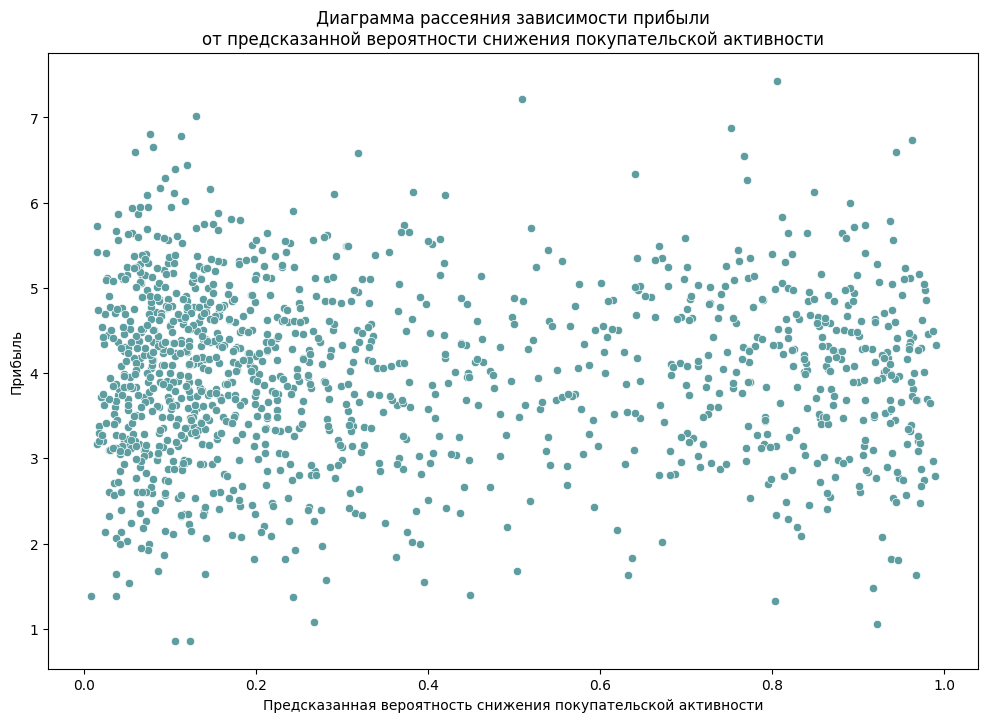

In [93]:
sns.scatterplot(data=X_concat_full,
                x='вероятность_снижения_покупательской_активности',
                y='прибыль',
                color='cadetblue').set(title='Диаграмма рассеяния зависимости прибыли\n'
                                            'от предсказанной вероятности снижения покупательской активности', 
                                      xlabel='Предсказанная вероятность снижения покупательской активности',
                                      ylabel='Прибыль');

Выделим интересующий нас сегмент покупателей - достаточно прибыльные пользователи (не менее 4 у.е.) с достаточно высокой (не менее 0.6) вероятностью снижения покупательской активности

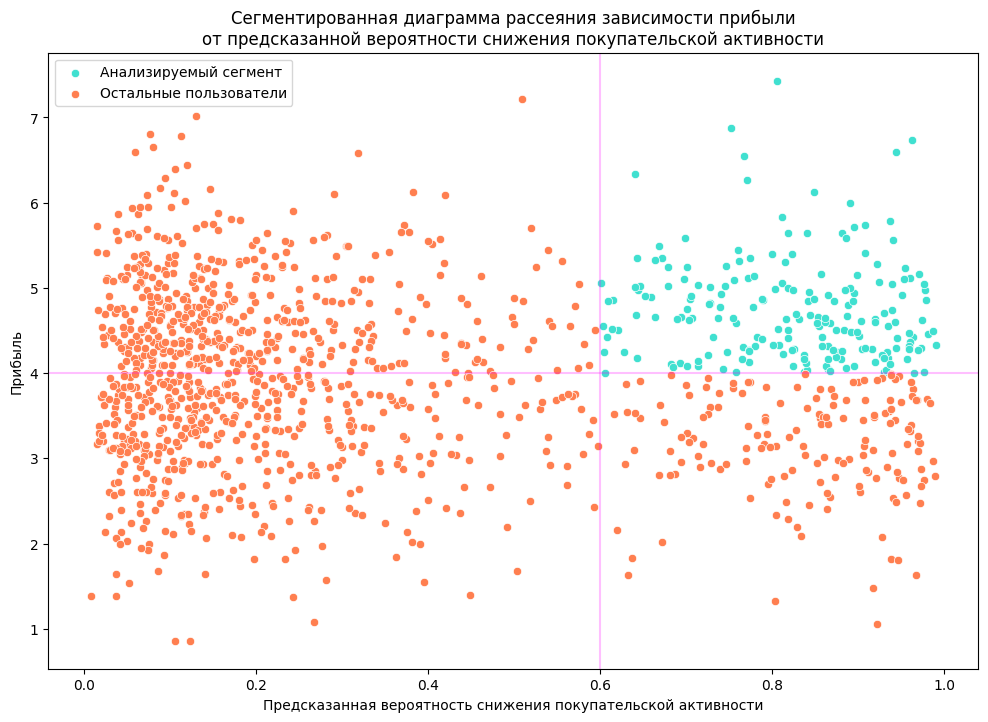

In [94]:
#отрисовка интересующего нас сегмента
sns.scatterplot(data=X_concat_full.query('прибыль >= 4 & вероятность_снижения_покупательской_активности >= 0.6'),
                x='вероятность_снижения_покупательской_активности',
                y='прибыль',
                label='Анализируемый сегмент',
                color='turquoise').set(title='Сегментированная диаграмма рассеяния зависимости прибыли\n'
                                             'от предсказанной вероятности снижения покупательской активности', 
                                       xlabel='Предсказанная вероятность снижения покупательской активности',
                                       ylabel='Прибыль')

#отрисовка остальной части покупателей
sns.scatterplot(data=X_concat_full.query('~(прибыль >= 4 & вероятность_снижения_покупательской_активности >= 0.6)'),
                x='вероятность_снижения_покупательской_активности',
                y='прибыль',
                label='Остальные пользователи',
                color='coral')

plt.axvline(x=0.6, alpha=0.25, color='magenta')
plt.axhline(y=4, alpha=0.25, color='magenta')

plt.show()

Создадим датафрейм `segm_users`, который будеть содержать информацию о выделенных нами выше пользователях

In [95]:
segm_users = X_concat_full.query('прибыль >= 4 & вероятность_снижения_покупательской_активности >= 0.6')
df_basic_info(segm_users)

Названия столбцов

Index(['тип_сервиса', 'разрешить_сообщать', 'маркет_актив_6_мес',
       'маркет_актив_тек_мес', 'длительность', 'акционные_покупки',
       'популярная_категория', 'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_предыдущий_месяц',
       'выручка_препредыдущий_месяц', 'выручка_текущий_месяц',
       'минут_предыдущий_месяц', 'минут_текущий_месяц',
       'вероятность_снижения_покупательской_активности', 'id', 'прибыль',
       'акционные_покупки_бин'],
      dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['тип_сервиса', 'разрешить_сообщать', 'маркет_актив_6_мес',
       'маркет_актив_тек_мес', 'длительность', 'акционные_покупки',
       'популярная_категория', 'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_предыдущий_месяц

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,вероятность_снижения_покупательской_активности,id,прибыль,акционные_покупки_бин
74,стандарт,да,4.2,4,503,0.25,Товары для детей,2,3,1,6,4995.0,4455.0,4668.700195,6,12,0.737026,215422,4.65,редкие
184,стандарт,да,4.1,4,828,0.35,Товары для детей,3,4,4,7,3871.5,4212.0,4422.700195,7,9,0.788834,215532,4.86,редкие
395,премиум,да,4.1,4,375,0.32,Косметика и аксессуары,1,6,3,3,5862.0,4332.0,5985.500000,11,8,0.923718,215743,5.07,редкие
248,стандарт,да,1.5,4,684,0.90,Косметика и аксессуары,3,0,2,4,4917.0,4824.0,5175.700195,14,8,0.837190,215596,4.21,частые
160,стандарт,да,3.5,5,574,0.22,Домашний текстиль,3,2,2,2,4672.0,4102.0,5030.799805,8,5,0.824336,215508,4.08,редкие
101,премиум,да,2.4,3,666,0.39,Кухонная посуда,3,5,2,3,5051.0,4301.0,5223.899902,10,13,0.880957,215449,5.64,редкие
1073,премиум,да,4.1,3,302,0.95,Товары для детей,2,2,2,6,5768.0,5267.0,5463.799805,13,18,0.658516,216421,4.89,частые
259,премиум,да,3.0,3,862,0.94,Косметика и аксессуары,1,5,2,8,4397.0,4313.0,4922.200195,9,11,0.960489,215607,5.12,частые
155,стандарт,да,2.4,5,638,0.24,Домашний текстиль,1,5,2,1,5046.0,4119.0,4886.100098,7,8,0.954653,215503,5.23,редкие
1009,стандарт,нет,4.1,4,184,0.99,Кухонная посуда,3,4,5,7,5700.5,4745.0,6658.600098,16,15,0.745253,216357,5.02,частые


Получили 201 запись о пользователях, имеющих высокую прибыльность и высокую вероятность снижения покупательской активности. Также создадим датафрейм `other_users` с информацией об остальных пользователях

In [96]:
other_users = X_concat_full.query('~(прибыль >= 4 & вероятность_снижения_покупательской_активности >= 0.6)')
df_basic_info(other_users)

Названия столбцов

Index(['тип_сервиса', 'разрешить_сообщать', 'маркет_актив_6_мес',
       'маркет_актив_тек_мес', 'длительность', 'акционные_покупки',
       'популярная_категория', 'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_предыдущий_месяц',
       'выручка_препредыдущий_месяц', 'выручка_текущий_месяц',
       'минут_предыдущий_месяц', 'минут_текущий_месяц',
       'вероятность_снижения_покупательской_активности', 'id', 'прибыль',
       'акционные_покупки_бин'],
      dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['тип_сервиса', 'разрешить_сообщать', 'маркет_актив_6_мес',
       'маркет_актив_тек_мес', 'длительность', 'акционные_покупки',
       'популярная_категория', 'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_предыдущий_месяц

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,вероятность_снижения_покупательской_активности,id,прибыль,акционные_покупки_бин
1156,стандарт,да,3.3,4,482,0.20,Товары для детей,4,2,5,11,5015.0,5175.0,5284.100098,19,11,0.113187,216504,5.53,редкие
1119,стандарт,да,4.1,3,564,0.28,Мелкая бытовая техника и электроника,3,0,4,9,4994.0,5267.0,4887.399902,17,17,0.039072,216467,5.87,редкие
298,стандарт,нет,2.9,3,657,0.24,Товары для детей,4,0,3,4,4918.0,4636.0,4804.899902,8,9,0.570762,215646,4.79,редкие
620,стандарт,да,4.9,5,574,0.28,Косметика и аксессуары,4,5,5,5,5355.5,4742.0,6017.200195,13,19,0.431970,215968,3.04,редкие
212,стандарт,да,3.9,4,589,0.35,Товары для детей,2,6,4,3,3137.0,4931.0,3083.699951,14,12,0.680409,215560,3.08,редкие
1113,премиум,да,5.5,4,781,0.23,Косметика и аксессуары,3,1,6,9,4837.0,4846.0,4959.200195,14,11,0.249979,216461,3.91,редкие
893,премиум,да,6.1,3,668,0.17,Домашний текстиль,6,4,4,14,5159.5,5014.0,5415.600098,10,11,0.109418,216241,3.91,редкие
968,стандарт,да,3.3,4,564,0.19,Косметика и аксессуары,1,3,1,9,5257.0,5476.0,5197.200195,14,19,0.292953,216316,5.37,редкие
1286,стандарт,да,4.1,4,335,0.40,Техника для красоты и здоровья,3,4,3,7,2970.0,4342.0,4289.500000,14,13,0.370528,216634,2.88,редкие
721,стандарт,да,5.5,4,1052,0.24,Домашний текстиль,2,3,6,17,5217.0,4959.0,5570.600098,18,11,0.127781,216069,4.77,редкие


Таким образом, на этом этапе мы отобрали сегмент пользователей с достаточно высокой прибыльностью и достаточно высокой вероятностью снижения покупательской активности. Можно переходить к выбору группы сегмента и её анализу

### Анализ группы выбранного сегмента пользователей

Посмотрим теперь на распределение пользователей внутри нашего сегмента в зависимости от категориальных признаков.

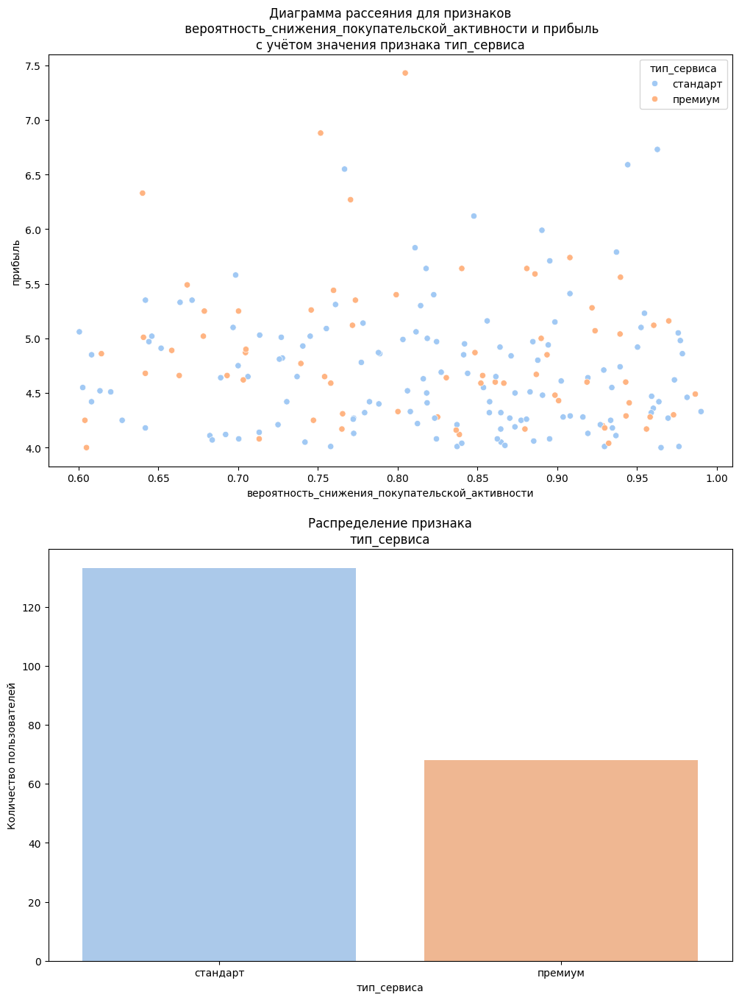

In [97]:
#категориальный признак - тип_сервиса
scatter_and_bar(df=segm_users, 
                x_feature='вероятность_снижения_покупательской_активности',
                y_feature='прибыль',
                cat_feature='тип_сервиса')

Судя по диаграмме рассеяния, не наблюдается особой зависимости между типом сервиса пользователя и вероятностью снижения покупательской активности. Значения распределены достаточно равномерно, даже несмотря на дисбаланс классов

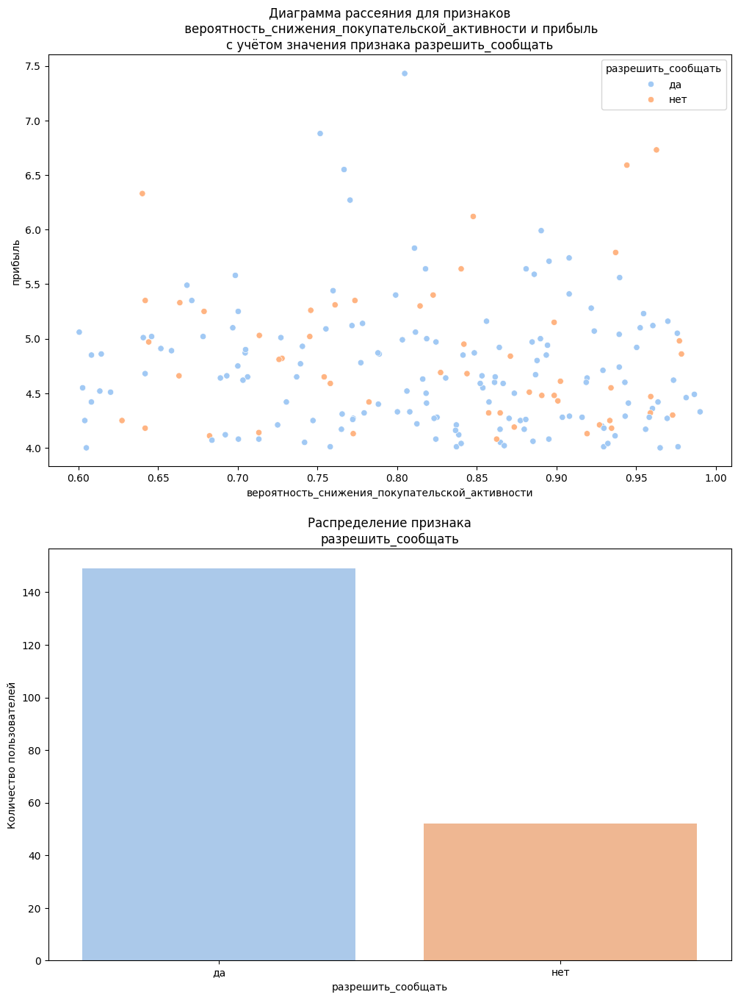

In [98]:
#категориальный признак - разрешить_сообщать
scatter_and_bar(df=segm_users, 
                x_feature='вероятность_снижения_покупательской_активности',
                y_feature='прибыль',
                cat_feature='разрешить_сообщать')

Судя по диаграмме рассеяния, не наблюдается особой зависимости между возможностью отправлять дополнительные сообщения пользователю и вероятностью снижения покупательской активности. Значения распределены достаточно равномерно, даже несмотря на дисбаланс классов

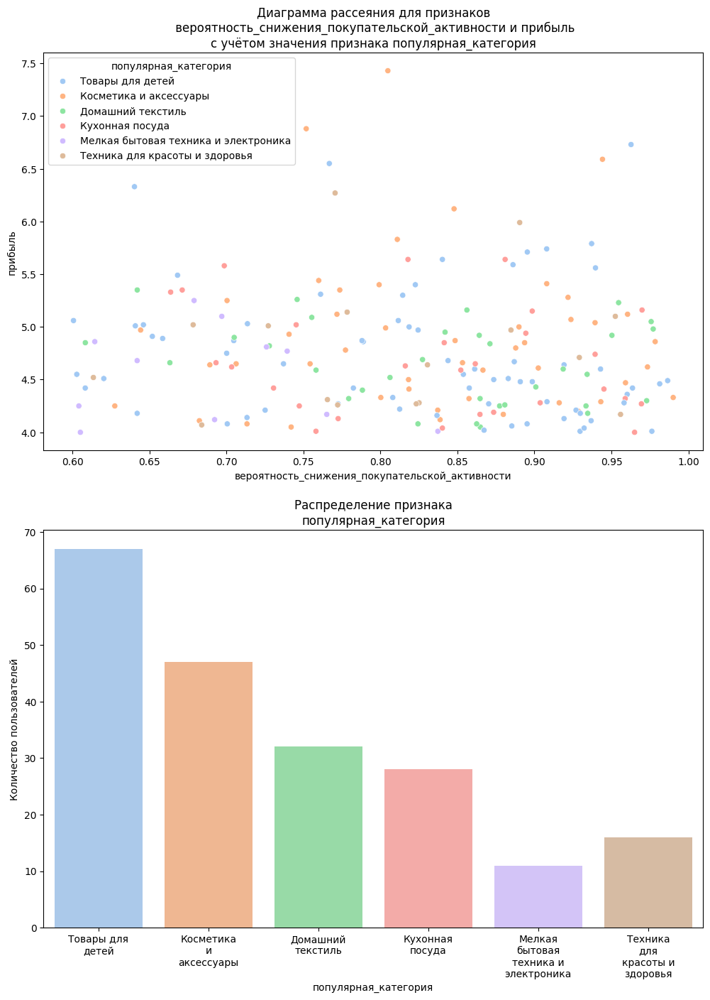

In [99]:
#категориальный признак - популярная_категория
scatter_and_bar(df=segm_users, 
                x_feature='вероятность_снижения_покупательской_активности',
                y_feature='прибыль',
                cat_feature='популярная_категория')

Судя по диаграмме рассеяния, не наблюдается особой зависимости между наиболее популярной категорией товаров пользователя и вероятностью снижения покупательской активности. Значения распределены достаточно равномерно, даже несмотря на дисбаланс классов

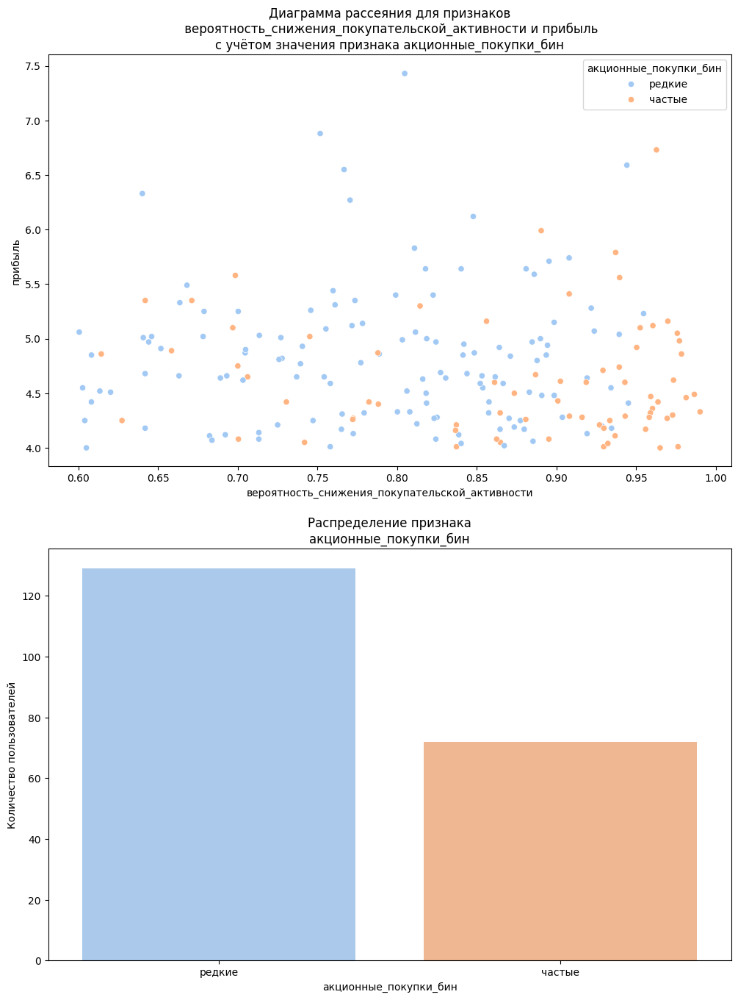

In [100]:
#категориальный признак - акционные_покупки_бин
scatter_and_bar(df=segm_users, 
                x_feature='вероятность_снижения_покупательской_активности',
                y_feature='прибыль',
                cat_feature='акционные_покупки_бин')

С бинарным признаком, описывающим частотность покупок по акции, уже интереснее. Заметно, что с увеличением вероятности снижения покупательской активности доля пользователей, часто совершающих покупки по акции, сильно возрастает.

Посмотрим, каково было распределение этого признака на исходном датафрейме `X_concat_full`

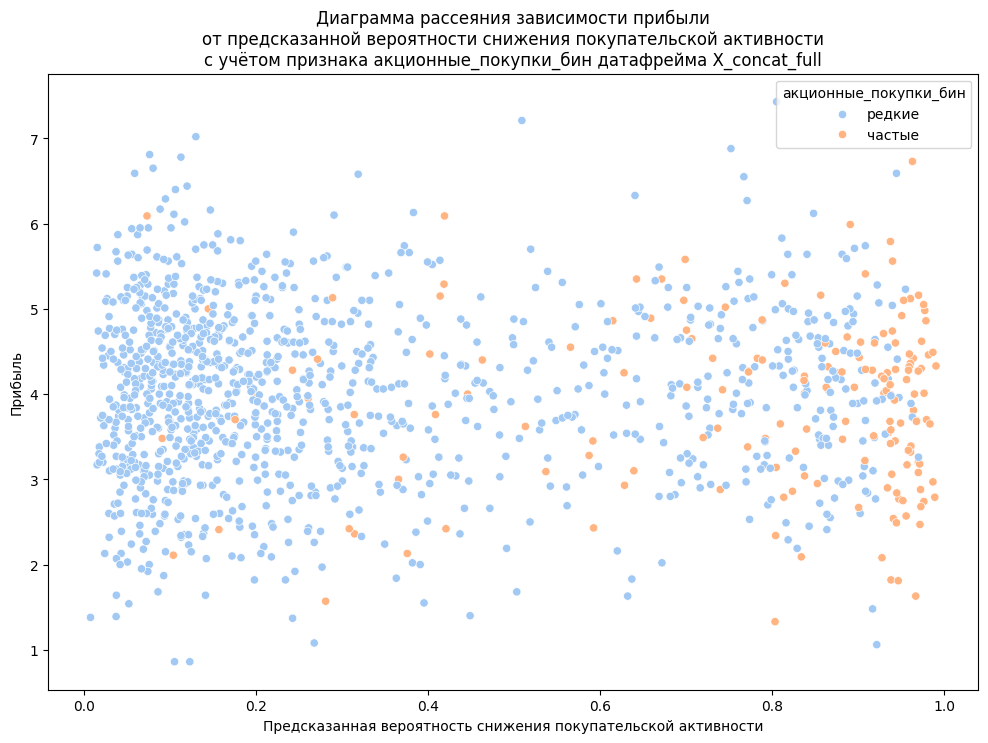

In [101]:
sns.scatterplot(data=X_concat_full,
                x='вероятность_снижения_покупательской_активности',
                y='прибыль',
                hue='акционные_покупки_бин',
                palette='pastel').set(title='Диаграмма рассеяния зависимости прибыли\n'
                                             'от предсказанной вероятности снижения покупательской активности\n'
                                             'с учётом признака акционные_покупки_бин датафрейма X_concat_full', 
                                       xlabel='Предсказанная вероятность снижения покупательской активности',
                                       ylabel='Прибыль');

Можно заметить, что на всём объёме данных зависимость ещё более красноречивая - среди пользователей, которых модель склонна была классифицировать как сохраняющих покупательскую активность, наблюдается единичное число частых покупателей акционных товаров. Тогда как начиная с вероятности отнесения к классу 1 примерно 0.6 доля частых покупателей акционных товаров начинает расти и достигает максимума в области наибольшей уверенности классификатора

Таким образом, выберем как анализируемую группу часть покупателей датафрейма `segm_users`, которые часто совершают покупки по акции

In [102]:
group_of_users = segm_users.query('акционные_покупки_бин == "частые"')
df_basic_info(group_of_users)

Названия столбцов

Index(['тип_сервиса', 'разрешить_сообщать', 'маркет_актив_6_мес',
       'маркет_актив_тек_мес', 'длительность', 'акционные_покупки',
       'популярная_категория', 'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_предыдущий_месяц',
       'выручка_препредыдущий_месяц', 'выручка_текущий_месяц',
       'минут_предыдущий_месяц', 'минут_текущий_месяц',
       'вероятность_снижения_покупательской_активности', 'id', 'прибыль',
       'акционные_покупки_бин'],
      dtype='object')
----------------------------------------------------------------
Основные параметры данных

Index(['тип_сервиса', 'разрешить_сообщать', 'маркет_актив_6_мес',
       'маркет_актив_тек_мес', 'длительность', 'акционные_покупки',
       'популярная_категория', 'средний_просмотр_категорий_за_визит',
       'неоплаченные_продукты_штук_квартал', 'ошибка_сервиса',
       'страниц_за_визит', 'выручка_предыдущий_месяц

,тип_сервиса,разрешить_сообщать,маркет_актив_6_мес,маркет_актив_тек_мес,длительность,акционные_покупки,популярная_категория,средний_просмотр_категорий_за_визит,неоплаченные_продукты_штук_квартал,ошибка_сервиса,страниц_за_визит,выручка_предыдущий_месяц,выручка_препредыдущий_месяц,выручка_текущий_месяц,минут_предыдущий_месяц,минут_текущий_месяц,вероятность_снижения_покупательской_активности,id,прибыль,акционные_покупки_бин
248,стандарт,да,1.5,4,684,0.90,Косметика и аксессуары,3,0,2,4,4917.0,4824.0,5175.700195,14,8,0.837190,215596,4.21,частые
1073,премиум,да,4.1,3,302,0.95,Товары для детей,2,2,2,6,5768.0,5267.0,5463.799805,13,18,0.658516,216421,4.89,частые
259,премиум,да,3.0,3,862,0.94,Косметика и аксессуары,1,5,2,8,4397.0,4313.0,4922.200195,9,11,0.960489,215607,5.12,частые
1009,стандарт,нет,4.1,4,184,0.99,Кухонная посуда,3,4,5,7,5700.5,4745.0,6658.600098,16,15,0.745253,216357,5.02,частые
279,стандарт,да,4.0,3,451,0.89,Домашний текстиль,2,4,3,2,5022.0,4527.0,4470.799805,8,6,0.950328,215627,4.92,частые
52,стандарт,нет,4.4,5,304,0.94,Товары для детей,1,4,3,2,5681.0,4439.0,5691.399902,11,9,0.962745,215400,6.73,частые
264,премиум,нет,4.4,3,255,0.94,Домашний текстиль,3,5,7,7,5848.5,4410.0,6687.000000,8,12,0.900888,215612,4.43,частые
369,стандарт,да,4.8,4,507,0.98,Косметика и аксессуары,2,0,4,3,6320.5,4738.0,6592.200195,8,8,0.916090,215717,4.28,частые
119,стандарт,да,4.4,4,503,0.90,Мелкая бытовая техника и электроника,2,3,3,3,4853.0,4367.0,5062.299805,7,13,0.837273,215467,4.01,частые
120,стандарт,да,2.7,4,515,0.94,Косметика и аксессуары,1,4,2,2,6060.0,4698.0,6346.000000,9,11,0.973433,215468,4.62,частые


Получили 72 записи об исследуемых нами пользователях.

Для дополнительного анализа создадим в исходном датафрейме `X_concat_full` столбец `группа`, показывающий, относится ли пользователь к анализируемой части пользователей, к остатку сегмента или к остальным пользователям

Уникальные значения

остальные покупатели        0.843580
остаток сегмента            0.100389
анализируемые покупатели    0.056031
Name: группа, dtype: float64
-----------------------------------------------------
Базовые статистики

count                     1285
unique                       3
top       остальные покупатели
freq                      1084
Name: группа, dtype: object
-----------------------------------------------------


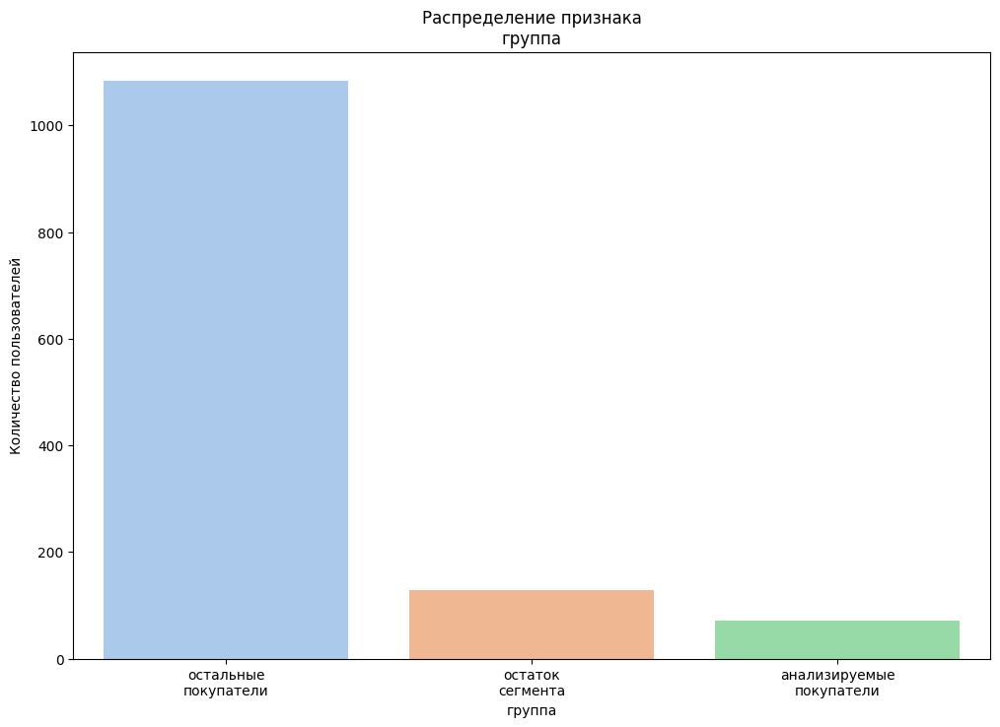

In [103]:
#функция, определяющая тип пользователя, исходя из
#покупательской активности, прибыли и частотности акционных покупок
def type_of_user(row):
    #row - строка датафрейма
    
    income = row['прибыль']
    proba = row['вероятность_снижения_покупательской_активности']
    promo = row['акционные_покупки_бин']
    if (income >=4) & (proba >= 0.6):
        if promo == 'частые':
            return 'анализируемые покупатели'
        return 'остаток сегмента'
    return 'остальные покупатели'

X_concat_full['группа'] = X_concat_full.apply(type_of_user, axis=1)
cat_feat_analysis(X_concat_full, 'группа')

Добавление столбца произошло успешно. Теперь можно переходить к анализу

Прежде всего изучим влияние количественных признаков на признак `группа`. Для этого возьмём топ-6 самых важных признаков, которые мы определили ранее в пункте 7, и ещё 2 признака с высокими коэффициентами корреляции по отношению к таргету матрицы phik из пункта 5

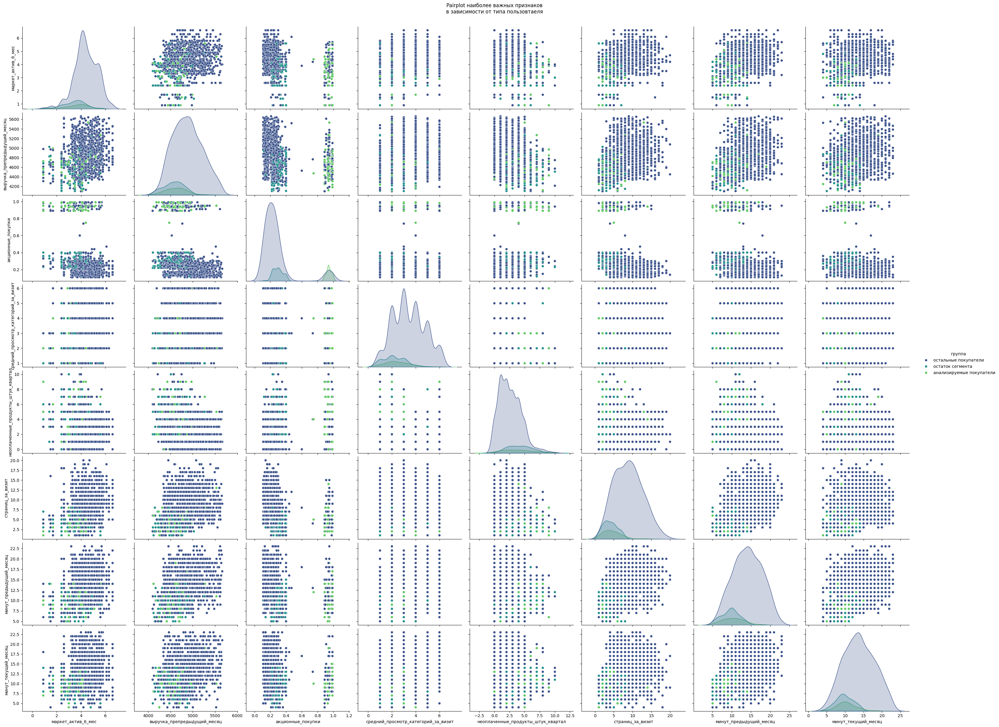

In [104]:
sns.pairplot(X_concat_full,
             hue='группа',
             vars=['маркет_актив_6_мес',
                   'выручка_препредыдущий_месяц',
                   'акционные_покупки', 
                   'средний_просмотр_категорий_за_визит',
                   'неоплаченные_продукты_штук_квартал', 
                   'страниц_за_визит', 
                   'минут_предыдущий_месяц', 
                   'минут_текущий_месяц'],
             height=3,
             aspect=1.3,
             palette='viridis')

plt.suptitle('Pairplot наиболее важных признаков\n'
             'в зависимости от типа пользовтаеля', y=1.02)
plt.show()

По анализу парных диаграмм можно сделать некоторые выводы:
* графики плотности вероятности отобранных пользователей и оставшихся пользователей сегмента очень похожи (с поправкой на величину классов), за исключением признака `акционные_покупки` (логично, по нему и проводилось разделение);
* у отобранных покупателей за последнее время понизились все показатели, связанные с удерживанием покупателя на сайте - это видно на графиках плотности вероятности признаков `минут_текущий_месяц`, `минут_предыдущий_месяц`, `страниц_за_визит`, `средний_просмотр_категорий_за_визит`. Очевидно, отобранные пользователи стали меньше проводить времени на сайте, что, естественно, привело к снижению их покупательской активности и снижению выручки (график плотности `выручка_препредыдущий_месяц`);
* распределение признака `неоплаченные_продукты_штук_квартал` для анализируемых покупателей гораздо более размытое и смещённое, чем у остальных покупателей - исследуемые пользователи чаще оставляют бОльшее количество товаров в корзине и, вероятно, не возвращаются к ним впоследствии;
* среди отобранных покупателей все очень часто совершали покупки по акции, тогда как доля таковых среди остальных пользователей крайне мала, если судить по графику плотности признака `акционные_покупки`. Вероятно, исследуемых покупателей перестал устраивать стандартный ассортимент интернет-магазина, или перестали устраивать цены на обычный ассортимент;
* наконец, у отобранных пользователей наблюдается ощутимо меньшее число маркетинговых коммуникаций по сравнению с остальными (график плотности признака `маркет_актив_6_мес`). Это, вероятно, тоже сказалось - меньше взаимодействий с пользователем - меньше его активность на сайте

Посмотрим теперь на зависимость числа пользователей от категориальных признаков в зависимости от типа группы

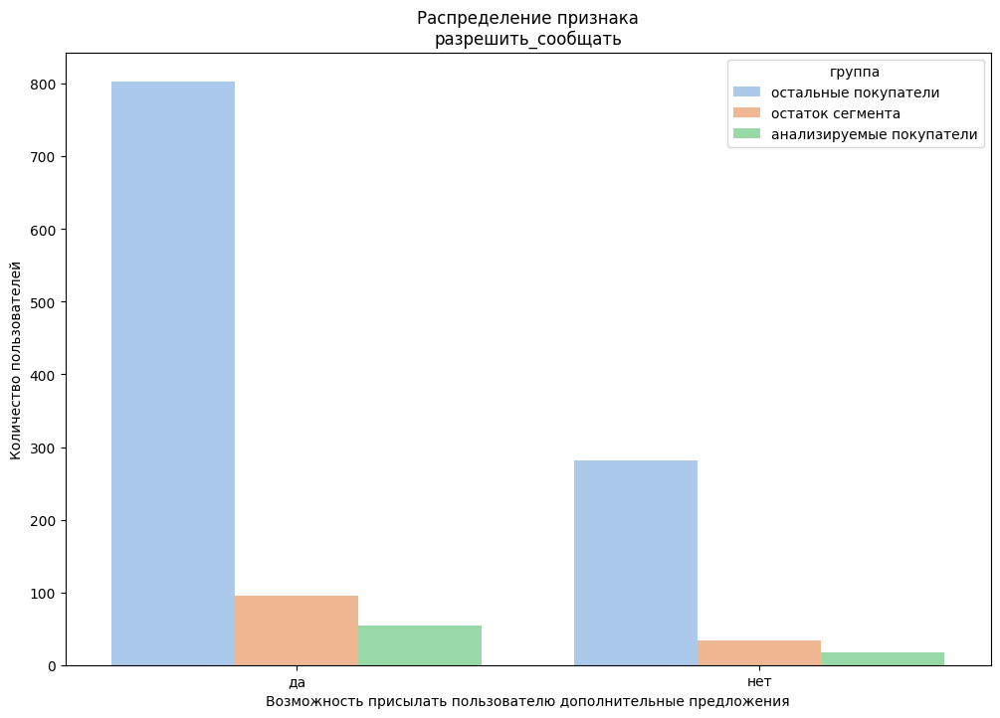

In [105]:
#построим столбчатую диаграмму для категориального признака `разрешить_сообщать`
sns.countplot(x='разрешить_сообщать',
              hue='группа',
              data=X_concat_full,
              palette='pastel').set(title=f'Распределение признака\nразрешить_сообщать', 
                                    xlabel='Возможность присылать пользователю дополнительные предложения',
                                    ylabel='Количество пользователей');

Как видно из столбчатой диаграммы, основные пропорции классов признака `группа` сохраняются в зависимости от возможности присылать дополнительные предложения

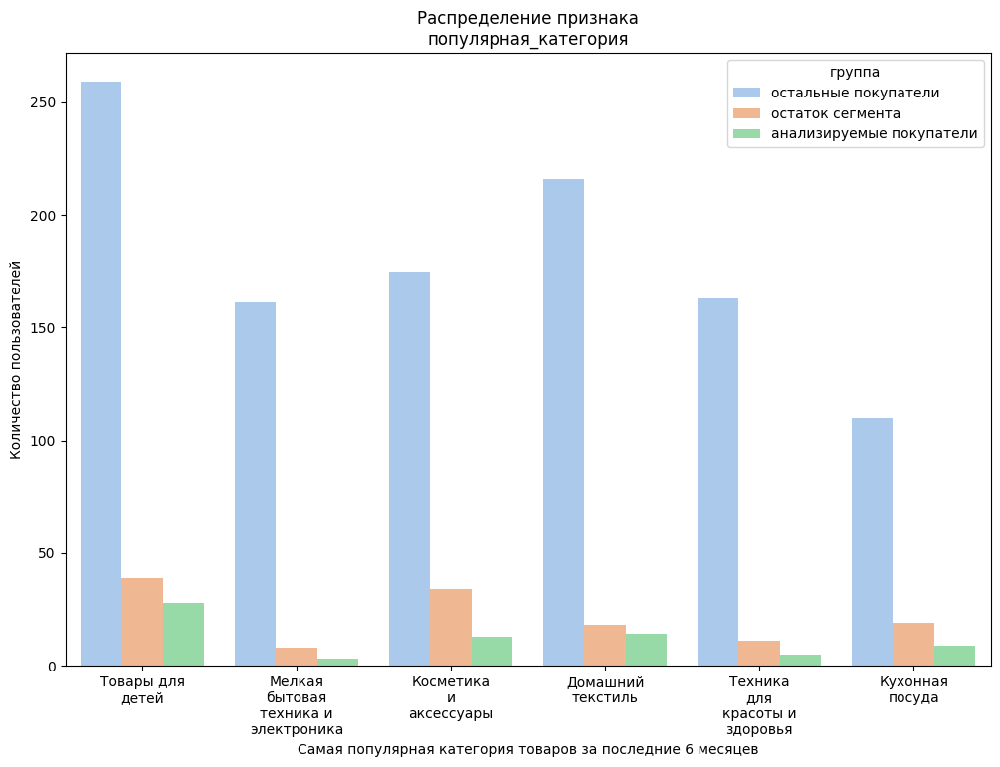

In [106]:
#построим столбчатую диаграмму для категориального признака `популярная_категория`
fig, ax = plt.subplots()
sns.countplot(x='популярная_категория',
              hue='группа',
              data=X_concat_full,
              palette='pastel',
              ax=ax).set(title=f'Распределение признака\nпопулярная_категория', 
                         xlabel='Самая популярная категория товаров за последние 6 месяцев',
                         ylabel='Количество пользователей');
wrap_labels(ax, 10)

Можно отметить, что основные пропорции распределения пользователей по популярным категориям сохраняются для пользователей всех групп, аномалий не наблюдается: самая популярная категория - товары для детей, наименее популярные категории - кухонная посуда/мелкая бытовая техника и электроника/техника для красоты и здоровья

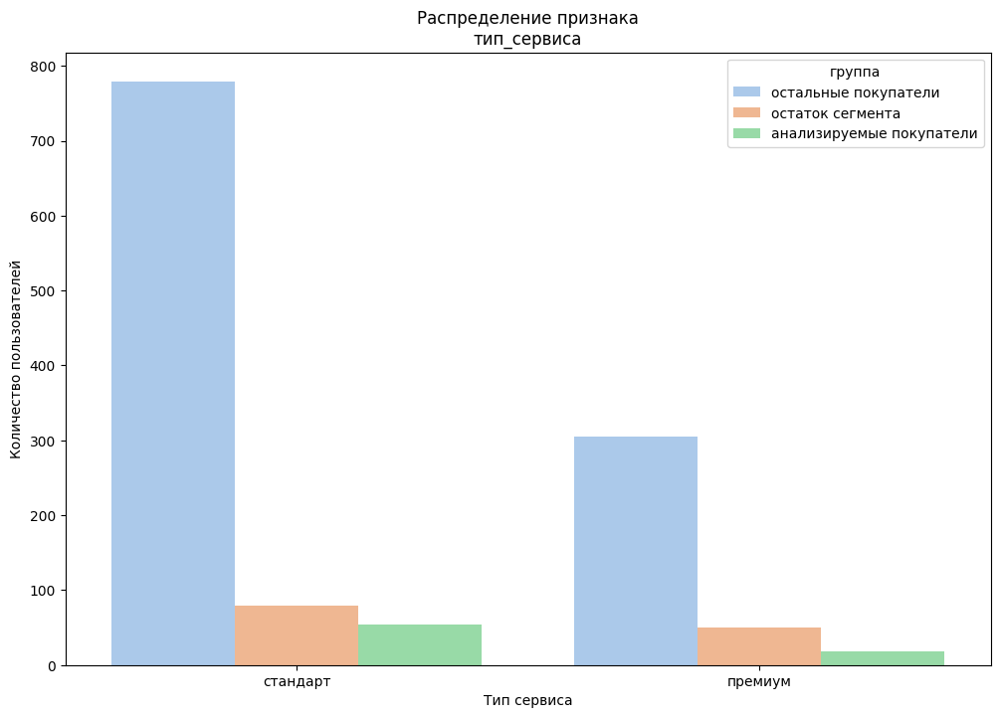

In [107]:
#построим столбчатую диаграмму для категориального признака тип_сервиса
sns.countplot(x='тип_сервиса',
              hue='группа',
              data=X_concat_full,
              palette='pastel').set(title=f'Распределение признака\nтип_сервиса', 
                                    xlabel='Тип сервиса',
                                    ylabel='Количество пользователей');

Как видно из столбчатой диаграммы, основные пропорции классов признака `группа` сохраняются в зависимости от типа сервиса

Посмотрим теперь на влияние самых важных количественных признаков (выделенный ранее нами топ-7 признаков, использованный при построении pairplot, за вычетом признака `акционные_покупки`) на каждую из групп пользователей с учётом популярной категории как наиболее важного из категориальных признаков

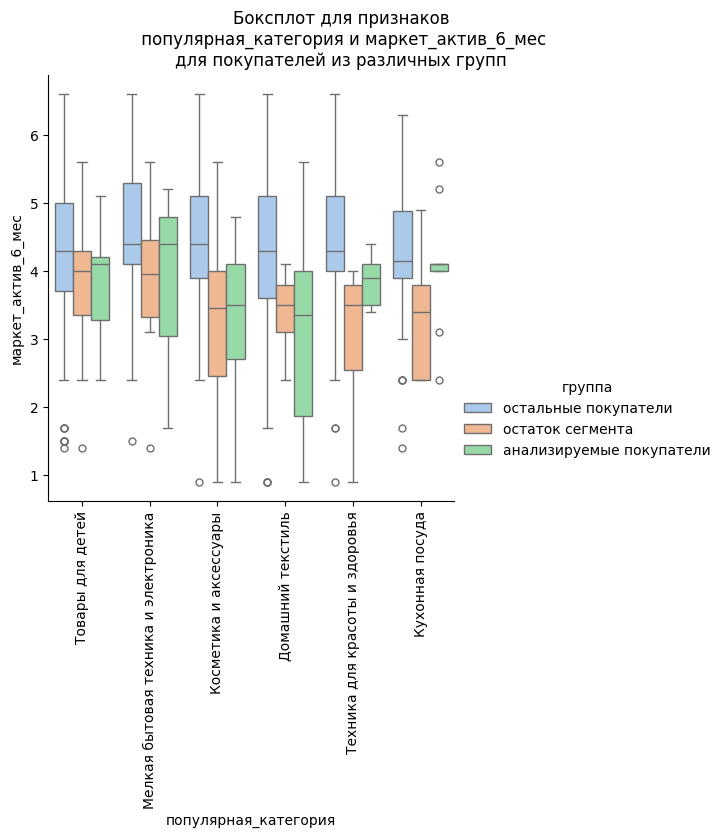

In [108]:
#количественный признак - маркет_актив_6_мес
boxplot(df=X_concat_full,
        x_feature='популярная_категория',
        y_feature='маркет_актив_6_мес',
        cat_feature='группа')

Явно заметно, что почти для всех категорий товаров пользователям выделенного нами сегмента (в том числе анализируемым покупателям) интернет-магазином уделялось меньше внимания, если рассматривать среднемесячное количество маркетинговых коммуникаций за последние полгода

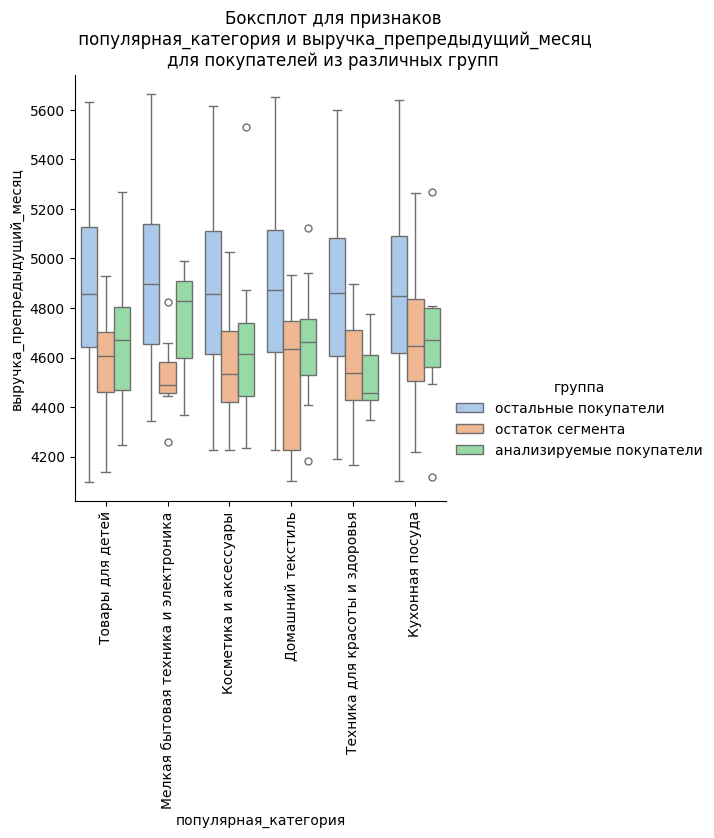

In [109]:
#количественный признак - выручка_препредыдущий_месяц
boxplot(df=X_concat_full,
        x_feature='популярная_категория',
        y_feature='выручка_препредыдущий_месяц',
        cat_feature='группа')

Явно заметно, что пользователи выделенного нами сегмента (в том числе анализируемые покупатели) потратили в препредыдущем месяце на сайте меньше денег, чем остальные покупатели

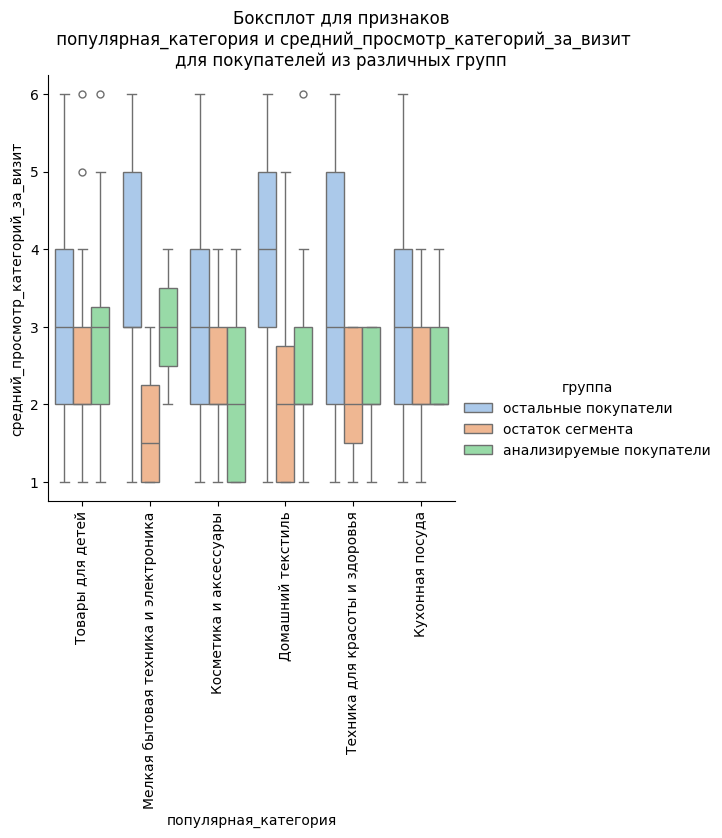

In [110]:
#количественный признак - средний_просмотр_категорий_за_визит
boxplot(df=X_concat_full,
        x_feature='популярная_категория',
        y_feature='средний_просмотр_категорий_за_визит',
        cat_feature='группа')

На боксплоте явно заметно, что пользователи выделенного нами сегмента (в том числе анализируемые покупатели) в среднем просматривали меньшее количество категорий товаров за визит по сравнению с остальными. Вероятно, сказывается высокая доля покупок по акции - скорее всего, пользователи заканчивали изучение ассортимента сразу после нахождения акционного товара

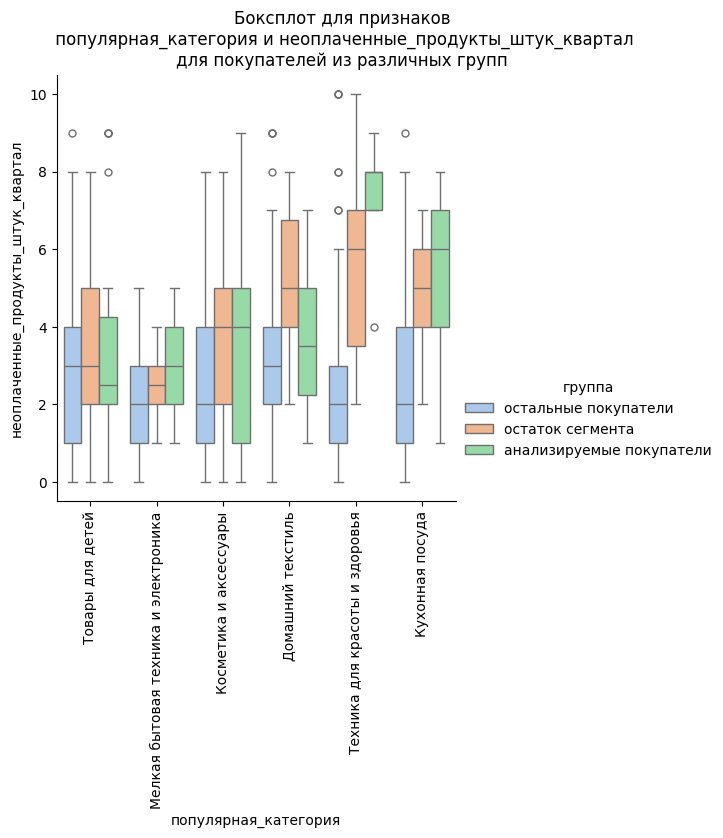

In [111]:
#количественный признак - неоплаченные_продукты_штук_квартал
boxplot(df=X_concat_full,
        x_feature='популярная_категория',
        y_feature='неоплаченные_продукты_штук_квартал',
        cat_feature='группа')

Интересная ситуация с неоплаченнными товарами в корзине. В 4 из 6 исследуемых категориях ситуация с наполненностью корзин неоплаченными товарами слабо отличается для пользователей разных групп. Однако среди покупателей, которые чаще всего приобретают кухонную посуду либо технику для красоты и здоровья, выделяются покупатели выбранного нами сегмента и особенно анализируемые покупатели - они имеют гораздо большее число товаров в корзине по сравнению с остальными пользователями. Вероятно, по каким-то причинам покупателям (из сегмента) именно этих категорий вещей сложнее всего определиться с товаром. Либо же возможны ситуации, что после добавления в корзину пользователь на какое-то время по разным причинам забывает про товар; при этом в какой-то период времени срок действия акции кончается, после чего покупатель уже не хочет приобретать товар по полной цене

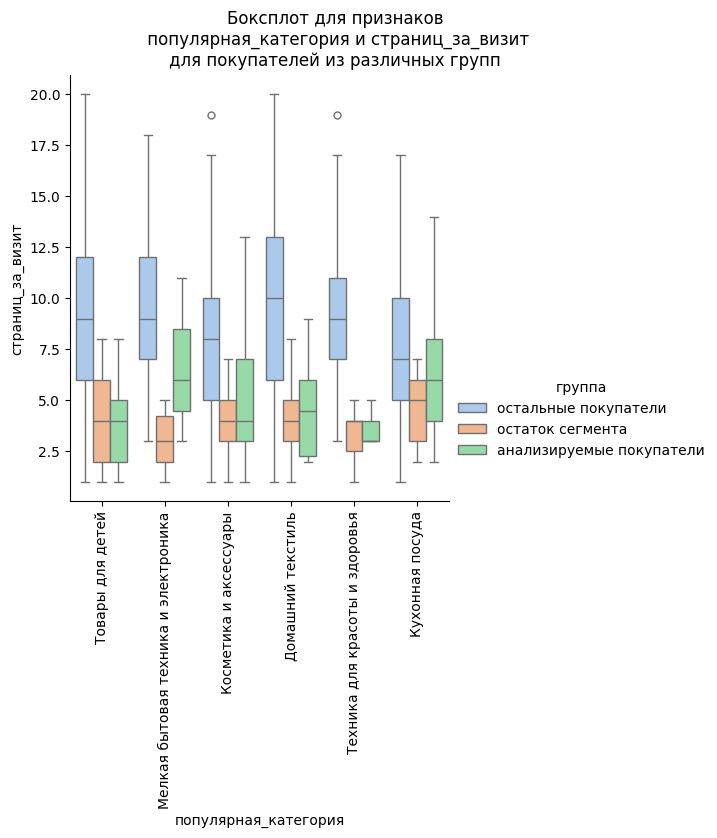

In [112]:
#количественный признак - страниц_за_визит
boxplot(df=X_concat_full,
        x_feature='популярная_категория',
        y_feature='страниц_за_визит',
        cat_feature='группа')

На боксплоте явно заметно, что пользователи выделенного нами сегмента (в том числе анализируемые покупатели) в среднем просматривали гораздо меньшее количество страниц за визит по сравнению с остальными. Вероятно, сказывается высокая доля покупок по акции - скорее всего, пользователи переставали изучать ассортимент магазина сразу после покупки товара по акции

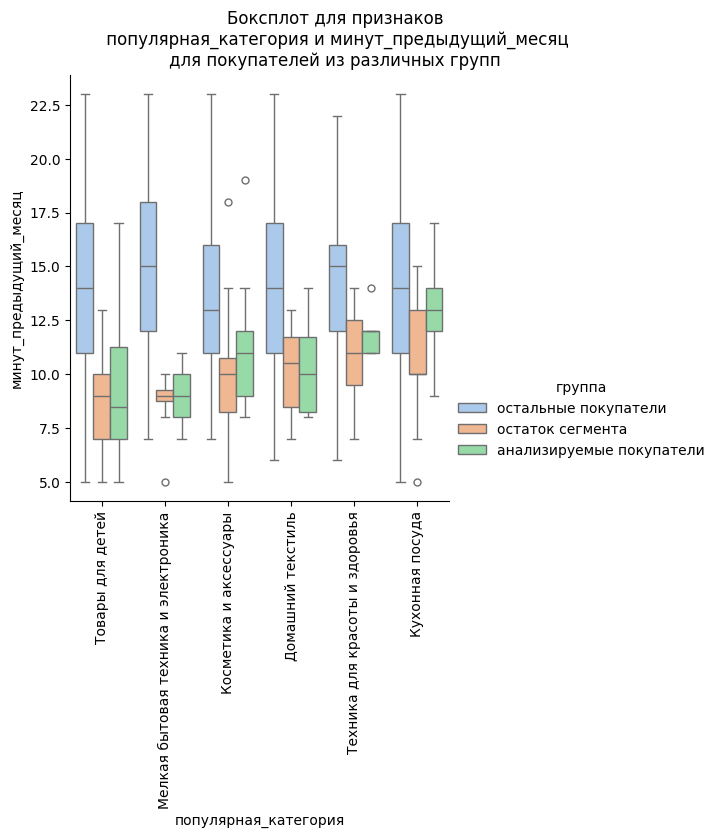

In [113]:
#количественный признак - минут_предыдущий_месяц
boxplot(df=X_concat_full,
        x_feature='популярная_категория',
        y_feature='минут_предыдущий_месяц',
        cat_feature='группа')

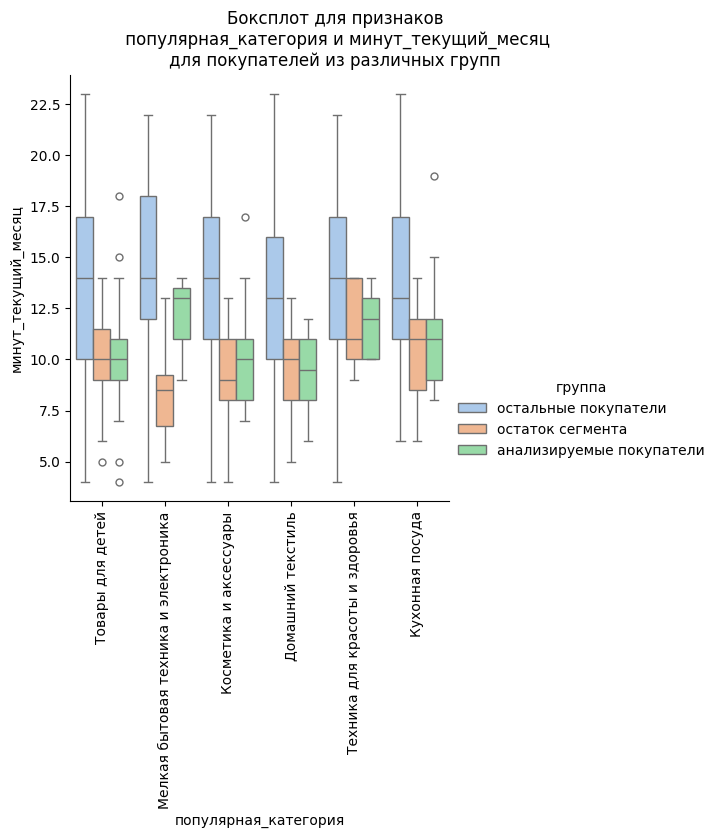

In [114]:
#количественный признак - минут_текущий_месяц
boxplot(df=X_concat_full,
        x_feature='популярная_категория',
        y_feature='минут_текущий_месяц',
        cat_feature='группа')

Общая закономерность - пользователи выделенного нами сегмента (в том числе анализируемые покупатели) проводили в прошлом и текущем месяце на сайте гораздо меньше времени, чем остальные покупатели. Как и ранее, это напрямую связано с акционными покупками - пользователь сразу быстро находит товар по акции, после чего либо покупает его, либо добавляет в корзину, и на этом проведённое на сайте время кончается.

При этом внутри категорий товаров есть некоторые изменения в разные месяца для анализируемых нами покупателей - например, мелкую бытовую технику и электронику, а также товары для детей ощутимо больше покупали в текущем месяце, а вот кухонную посуду - в предыдущем. Впрочем, это вполне может объясняться сезонностью или периодичностью определённых акций, а также искажением из-за небольшого числа покупателей

Таким образом, в данном разделе нами был выделен сегмент покупателей с высокой прибыльностью и достаточно высокой вероятностью снижения покупательской активности. Из этого сегмента мы выбрали группу пользователей, преимущественно совершающих покупки по акциям. По итогам анализа выделенной нами группы покупателей можно сделать некоторые выводы и предложить следующие варинты решения:
* Прежде всего (условный нулевой пункт), необходимо более досконально разобраться с параметрами акций. Не хватает информации, откуда пользователи узнавали об акциях (самостоятельно посещая интернет-магазин или благодаря рассылкам и маркетинговым коммуникациям), существуют ли специальные акции для премиум-пользователей или акции одинаковы для всех пользователей, на какие категории товаров чаще всего предлагались скидочные предложения, в какие периоды времени действовали те или иные акционные предложения. Без всей этой информации к выводам и предложениям стоит относиться с большой осторожностью;
* если абстрагироваться от недостатка информации, можно отметить следующий факт - выбранные нами пользователи имели за последние 6 месяцев меньше маркетинговых коммуникаций, чем остальные. Вариант решения - отслеживать количество взаимодействий с пользователями и увеличивать их долю в том случае, если по каким-то причинам коммуникаций становится меньше/давно не было;
* также стоит отметить, что у выбранных покупателей наблюдается закономерность длительного хранения гораздо большего числа товаров в корзине по сравнению с остальными покупателями. Возможный вариант решения - добавление расширенного функционала сравнения товаров по ключевым параметрам (в том случае, если пользователь не может определиться с товаром), а также система напоминаний и уведомлений (например, если подходит к концу срок акции по отношению к добавленному в корзину товару);
* нельзя не отметить тот факт, что у пользователей со сниженной активностью проседают все показатели, связанные с удерживанием на сайте - число минут, проведённое на сайте, число просматриваемых категорий за визит, число просматриваемых страниц за визит, что, как следствие, приводит к падению выручки. Во многом это объясняется тем, что пользователи совершают акционные покупки, соответственно, меньше анализируют товары и взаимодействуют с интернетом-магазином. Поэтому необходим более глубокий анализ, насколько в целом эффективна политика введения акций (см. пункт про акции выше). Также имеет смысл улучшить инструменты удержания пользователя на сайте - вероятно, этот пункт должен обсуждаться в тесной связке с дизайнерами и фронтенд-разработчиками;
* наконец, можно отметить некоторые необычные тенденции среди категорий в отдельных пунктах (например, избыточно высокое число неоплаченных товаров в категориях `кухонная посуда` и `техника для красоты и здоровья`; значительные изменения проведённого на сайте времени в категориях `кухонная посуда`, `мелкая бытовая техника и электроника` и `товары для детей` в разные месяца). Возможно, всё это объясняется сезонностью и периодичностью акций либо же малым объёмом выборки, но обратить внимание определённо стоит

## Общий вывод

1. **Загрузка данных**

Данные успешно загружены, названия столбцов и разделители приведены к каноническому виду. Необходимые библиотеки импортированы, настроены параметры отображения графиков.

2. **Предобработка данных**

* Изменены некоторые типы данных на корректные или более подходящие;
* установлено отсутствие пропусков и явных дубликатов

3. **Исследовательский анализ данных**

Категориальные и количественные признаки в 4 датафреймах проанализированы аналитически, статистически и с помощью графиков.

* датафрейм `market_file`:
    * в признаках `тип_сервиса` и `популярная_категория` исправлены опечатки в названиях одного из классов;
    * в признаке `акционные_покупки` отмечена бимодальность распределения значений признака;
    * установлено, что присутствуют количественные признаки с ненормальным распределением, а также категориальные с неравномерным распределением классов. В будущем для улучшения прогнозирования необходимо улучшить качество данных -  сбалансировать классы, нормализовать количественные признаки;
    
 
* датафрейм `market_money`:
    * удалён выброс, а также не интересующие записи, исходя из значений признака `выручка`;
    
* датафрейм `market_time`:
    * в признаке `период` исправлена опечатка в названии одного из классов;

Также отмечена несбалансированность классов таргета.
    
Общая рекомендация на будущее - улучшение качества данных как для категориальных, так и для количественных признаков для получения более сбалансированных и качественных данных; равномерное распределение пользователей по значению таргета

4. **Объединение таблиц**

* Был получен датафрейм `market_df` путём объединения записей из датафреймов `market_time`, `market_money` и `market_file`;
* при объединении датафреймов было обнаружено 11 неявных дубликатов. Данные неявные дубликаты были удалены во избежание некорректного моделирования

5. **Корреляционный анализ**

В данном разделе был проведён корреляционный анализ признаков в обединённом датафрейме `market_df`:
* Парные корреляции Спирмена количественных признаков показали отсутствие мультиколлинеарности. Заметна высокая прямая связь между признаками `выручка_предыдущий_месяц` и `выручка_текущий_месяц` (0.88), а также умеренная связь между признаками `страниц_за_визит` и `минут_предыдущий_месяц` (0.45). Между остальными парами признаков связь слабая или очень слабая;
* корреляционный анализ с помощью библиотеки phik показал, что наиболее сильная связь с таргетом наблюдается у признаков `страниц_за_визит` (0.76) и `минут_предыдущий_месяц` (0.70);
* корреляционный анализ отдельных классов с помощью библиотеки phik показал, что самый большой коэффициент парной корреляции достигается для обоих классов в паре `выручка_предыдущий_месяц` и `выручка_текущий_месяц` (0.87); при этом для пользователей класса `Снизилась` существует гораздо больше корреляций пар признаков с коэффициентом кореляции не менее 0.5 - 6 против 2 у пользователей класса `Прежний уровень`;
* добавление нового бинарного признака `акционные_покупки_бин` не привело к усилению связей с целевым признаком и остальными, если судить по матрицам корреляций phik;
* утечки целевого признака также не наблюдается - ни у одного из признаков нет корреляции, равной 1, с таргетом (за исключением признака `id`, который не будем включать в признаковое описание для обучения моделей)

6. **Использование пайплайнов**

В этом разделе мы использовали пайплайн для обучения моделей машинного обучения на имеющихся данных.

В качестве метрики была выбрана ROC-AUC. Исходные данные были разделены на тренировочную и тестовую выборку с учётом дисбаланса классов. Таргет был закодирован с помощью LabelEncoder.

Исходные признаки были разделены на категориальные (ранговые и номинальные) и количественные признаки. Категориальные признаки были предобработаны с помощью OneHotEncoder (номинальные признаки) и OrdinalEncoder (ранговые признаки) с заполнением пропусков с помощью SimpleImputer. Для количественных признаков исследовалось маштабирование с помощью MinMaxScaler, StandardScaler, MaxAbsScaler, RobustScaler, а также без масштабирования.

Были исследованы 4 модели машинного обучения:

* *KNeighborsClassifier*. Было проварьировано количество ближайших соседей для нахождения баланса между сложностью модели и качеством;
* *DecisionTreeClassifier*. Были проварьированы типы критерия (функции оценки качества разделения), максимальная глубина дерева, максимальное количество признаков, минимальное количество объектов в листе, минимальное количество объектов в разделяемом листе, максимальное количество узлов в листе для определения оптимальной структуры дерева;
* *LogisticRegression*. Были проварьированы способы регуляризации, коэффициент регуляризации `C` и алгоритмы оптимизации для улучшения обобщающей способности модели;
* *SVC*. Были проварьированы виды гиперплоскости, параметр `gamma` для нелинейных гиперплоскостей, а также коэффициент регуляризации `C` для построения оптимальной разделяющей поверхности.

Оптимизацию гиперпараметров проводили с помощью RandomizedSearchCV. Качество лучшей модели оценивали с помощью метрики ROC-AUC на тренировочной и тестовой выборке. Также определили параметры и гиперпараметры лучшей модели.

Наилучшие результаты (значение метрики ROC-AUC на тренировочной выборке 0.9023, на тестовой - 0.9181) были достигнуты при использовании логистической регрессии с гиперапараметрами 
* *solver:* 'liblinear';
* *penalty:* 'l2';
* *C:*  0.3593813663804626,

а также при использовании MinMaxScaler для масштабировании количественных признаков.

7. **Анализ важности признаков**

В рамках данного раздела для анализа важности признаков использовались 3 метода: анализ весов признаков, permutation importance и SHAP. С помощью этих методов было установлено, что наименее важными признаками являются:

   * `разрешить_сообщать`: информация о том, можно ли присылать покупателю дополнительные предложения о товаре;
   * `ошибка_сервиса`: число сбоев, которые коснулись покупателя во время посещения сайта;
   * `маркет_актив_тек_мес`: количество маркетинговых коммуникаций в текущем месяце;
   * `выручка_текущий_месяц`: сумма выручки за текущий месяц;
   * `тип_сервиса`: уровень сервиса, например «премиум» и «стандарт».
    
    
Также было определено, что наиболее важными признаками являются:

   * `страниц_за_визит`: среднее количество страниц, которые просмотрел покупатель за один визит на сайт за последние 3 месяца;
   * `акционные_покупки`: среднемесячная доля покупок по акции от общего числа покупок за последние 6 месяцев;
   * `минут_предыдущий_месяц`: значение времени, проведённого на сайте в прошлом месяце, в минутах;
   * `неоплаченные_продукты_штук_квартал`: общее число неоплаченных товаров в корзине за последние 3 месяца;
   * `средний_просмотр_категорий_за_визит`: показывает, сколько в среднем категорий покупатель просмотрел за визит в течение последнего месяца;
   * `минут_текущий_месяц`: значение времени, проведённого на сайте в текущем месяце, в минутах;
    
    
Исходя из этих данных, выдвигаются следующие предложения для повышения покупательской активности клиентов:

   * Очень важно работать над улучшением удержания клиента при использовании интернет-магазина. 4 из 6 наиболее значимых признака (среднее число посещённых страниц; количество минут, проведённое на сайте в текущем и прошлом месяцах; количество просмотрённых категорий за визит), положительно влияющих на сохранение покупательской способности клиента, напрямую связаны с длительностью пребывания пользователя на сайте;
   * при этом необходимо разобраться с маркетинговыми коммуникациями. Более плотное взаимодействие с клиентами в течение последних 6 месяцев повышало шансы сохранить его покупательскую активность (хотя этот признак был средним по важности). В последний же месяц что-то сломалось, и практически никакого влияния на лояльность клиента к сервису маркетинговые коммуникации не оказывали. Возможно, дело как раз в этом - может быть, рекомендации стали слишком назойливыми. В любом случае, этот факт требует тщательного анализа;
   * нужно понять, почему в целом не работают дополнительные взаимодействия с клиентами - признак, отвечающий за отсутствие или наличие дополнительных взаимодействий с клиентом, вообще никак не помогает сохранить покупательскую активность. С этим тоже необходимо разобраться - возможно,  акционные предложения недостаточно привлекательны, не учитывают интересы покупателя или, наоборот, слишком назойливы;
   * особое внимание нужно уделить клиентам, совершающим много акционных покупок. С учётом того, что это постоянные клиенты, стоит большее внимание уделить товарам, которые они приобретают по акциям, вероятно, недостаточно хорошо работают персонализированные предложения;
   * достаточно странно, что на покупательскую активность никак не влияет тип сервиса пользователя. По разным методам анализа тип сервиса - один из самых мало значащих признаков. Надо разобраться, что с этим не так, возможно, имеющиеся плюсы улучшенного сервиса в последнее время уже не так привлекательны;
   * также нужно попробовать разобраться с проблемой избыточного количества товаров в корзине. Люди, имеющие большое количество неоплаченных покупок в корзине, гораздо более склонны к снижению покупательской активности. Возможно, клиент просто запутывается в большом количестве товаров, теряется и из-за этого ничего не покупает. Как один из возможных вариантов решения, стоит проработать механизмы сравнения похожих товаров в корзине (если таковые имеются) по ключевым характеристикам;
   * стоит также отметить, что признаки, отвечающие за наиболее популярную категорию, оказывают не самое большое влияние на покупательскую активность клиента. Наиболее значимый признак - если популярная категория касается мелкой бытовой техники и электроники;
   * имеет смысл задуматься о расширении признакового описания. Можно добавить следующие признаки, например, возраст клиента и пол (половозрастной анализ покупательской активности пользователя), количество детей, количество покупок клиента (для более плотного исследование в связке с прибылью и выручкой), показатели конверсии сайта (CTR, CPM, CR и другие) для анализа конверсии просмотров в заказы, доля взаимодействий с маркетинговыми активностями (доля переходов по ссылкам/ответов на звонки/открытий рекламных баннеров и тд) (изучение динамики за период), частоту использования премиум-пользователями преимуществ подписки (если это возможно выразить количественными характеристиками; также в целом не помешает собрать информацию, какие преимущества есть у премиум-пользователей в сравнении с обычными)
    
8. **Сегментация покупателей**

В данном разделе нами был выделен сегмент покупателей с высокой прибыльностью и достаточно высокой вероятностью снижения покупательской активности. Из этого сегмента мы выбрали группу пользователей, преимущественно совершающих покупки по акциям. По итогам анализа выделенной нами группы покупателей можно сделать некоторые выводы и предложить следующие варинты решения:
* Прежде всего, необходимо более досконально разобраться с параметрами акций. Не хватает информации, откуда пользователи узнавали об акциях (самостоятельно посещая интернет-магазин или благодаря рассылкам и маркетинговым коммуникациям), существуют ли специальные акции для премиум-пользователей или акции одинаковы для всех пользователей, на какие категории товаров чаще всего предлагались скидочные предложения, в какие периоды времени действовали те или иные акционные предложения. Без всей этой информации к выводам и предложениям стоит относиться с большой осторожностью;
* можно отметить следующий факт - выбранные нами пользователи имели за последние 6 месяцев меньше маркетинговых коммуникаций, чем остальные. Вариант решения - отслеживать количество взаимодействий с пользователями и увеличивать их долю в том случае, если по каким-то причинам коммуникаций становится меньше/давно не было;
* стоит отметить, что у выбранных покупателей наблюдается закономерность длительного хранения гораздо большего числа товаров в корзине по сравнению с остальными покупателями. Возможный вариант решения - добавление расширенного функционала сравнения товаров по ключевым параметрам (в том случае, если пользователь не может определиться с товаром), а также система напоминаний и уведомлений (например, если подходит к концу срок акции по отношению к добавленному в корзину товару);
* у пользователей со сниженной активностью проседают все показатели, связанные с удерживанием на сайте - число минут, проведённое на сайте, число просматриваемых категорий за визит, число просматриваемых страниц за визит, что, как следствие, приводит к падению выручки. Во многом это объясняется тем, что пользователи совершают акционные покупки, соответственно, меньше анализируют товары и взаимодействуют с интернетом-магазином. Поэтому необходим более глубокий анализ, насколько в целом эффективна политика введения акций (см. пункт про акции выше). Также имеет смысл улучшить инструменты удержания пользователя на сайте;
* наконец, можно отметить некоторые необычные тенденции среди категорий в отдельных пунктах (например, избыточно высокое число неоплаченных товаров в категориях `кухонная посуда` и `техника для красоты и здоровья`; значительные изменения проведённого на сайте времени в категориях `кухонная посуда`, `мелкая бытовая техника и электроника` и `товары для детей` в разные месяца). Возможно, всё это объясняется сезонностью и периодичностью акций либо же малым объёмом выборки, но обратить внимание определённо стоит